In [1]:
# Import the necessary libraries

from sklearn.cluster import KMeans
import numpy as np
import sqlite3
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns
import csv
import openpyxl
from sklearn.cluster import DBSCAN
from scipy import stats
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_validate
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import f1_score
from sklearn.tree import plot_tree
from sklearn.metrics import precision_score

In [2]:
#!pip install apriori


In [3]:
#!pip install mixtend

In [4]:
con = sqlite3.connect('accident_data_v1.0.0_2023.db') # connect to the database
cur = con.cursor() # creates a cursor for interaction
# returns the list of the table in the database
table_list = cur.execute("SELECT name FROM sqlite_master WHERE type = 'table' ORDER BY name;").fetchall()
table_list

[('accident',), ('casualty',), ('lsoa',), ('vehicle',)]

In [5]:
accident_2020 = cur.execute(" SELECT * FROM accident WHERE accident_year = 2020"). fetchall()
accident_2020

[('2020010219808',
  2020,
  '010219808',
  521389.0,
  175144.0,
  -0.254001,
  51.462262,
  1,
  3,
  1,
  1,
  '04/02/2020',
  3,
  '09:00',
  10,
  'E09000032',
  'E09000032',
  6,
  0,
  6,
  20,
  0,
  -1,
  0,
  -1,
  9,
  9,
  1,
  9,
  9,
  0,
  0,
  1,
  3,
  2,
  'E01004576'),
 ('2020010220496',
  2020,
  '010220496',
  529337.0,
  176237.0,
  -0.139253,
  51.470327,
  1,
  3,
  1,
  2,
  '27/04/2020',
  2,
  '13:55',
  9,
  'E09000022',
  'E09000022',
  3,
  3036,
  6,
  20,
  9,
  2,
  6,
  0,
  0,
  4,
  1,
  1,
  1,
  0,
  0,
  1,
  1,
  2,
  'E01003034'),
 ('2020010228005',
  2020,
  '010228005',
  526432.0,
  182761.0,
  -0.178719,
  51.529614,
  1,
  3,
  1,
  1,
  '01/01/2020',
  4,
  '01:25',
  1,
  'E09000033',
  'E09000033',
  5,
  0,
  6,
  30,
  3,
  1,
  6,
  0,
  0,
  0,
  4,
  1,
  2,
  0,
  0,
  1,
  1,
  2,
  'E01004726'),
 ('2020010228006',
  2020,
  '010228006',
  538676.0,
  184371.0,
  -0.001683,
  51.54121,
  1,
  2,
  1,
  1,
  '01/01/2020',
  4,
  '0

In [6]:
### Get Tables
accident_2020= pd.read_sql_query("SELECT * FROM accident WHERE accident_year = 2020", con)
accident_2020

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,9,1,9,9,0,0,1,3,2,E01004576
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,4,1,1,1,0,0,1,1,2,E01003034
2,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,0,4,1,2,0,0,1,1,2,E01004726
3,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,4,4,1,1,0,0,1,1,2,E01003617
4,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,...,0,4,1,1,0,0,1,1,2,E01004763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020991027064,2020,991027064,343034.0,731654.0,-2.926320,56.473539,99,2,2,...,0,1,1,1,0,0,1,1,-1,-1
91195,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,99,3,1,...,0,1,1,1,0,0,1,2,-1,-1
91196,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,0,1,1,1,0,0,2,1,-1,-1
91197,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,0,1,1,1,0,0,1,2,-1,-1


In [7]:
accident_2020.columns

Index(['accident_index', 'accident_year', 'accident_reference',
       'location_easting_osgr', 'location_northing_osgr', 'longitude',
       'latitude', 'police_force', 'accident_severity', 'number_of_vehicles',
       'number_of_casualties', 'date', 'day_of_week', 'time',
       'local_authority_district', 'local_authority_ons_district',
       'local_authority_highway', 'first_road_class', 'first_road_number',
       'road_type', 'speed_limit', 'junction_detail', 'junction_control',
       'second_road_class', 'second_road_number',
       'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
       'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident',
       'trunk_road_flag', 'lsoa_of_accident_location'],
      dtype='object')

## DATA EXPLORATION

## Exploring the Accident Table

In [8]:
accident_table = pd.read_sql_query("SELECT * FROM accident WHERE accident_year = 2020", con)
accident_table

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,9,1,9,9,0,0,1,3,2,E01004576
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,4,1,1,1,0,0,1,1,2,E01003034
2,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,0,4,1,2,0,0,1,1,2,E01004726
3,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,4,4,1,1,0,0,1,1,2,E01003617
4,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,...,0,4,1,1,0,0,1,1,2,E01004763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020991027064,2020,991027064,343034.0,731654.0,-2.926320,56.473539,99,2,2,...,0,1,1,1,0,0,1,1,-1,-1
91195,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,99,3,1,...,0,1,1,1,0,0,1,2,-1,-1
91196,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,0,1,1,1,0,0,2,1,-1,-1
91197,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,0,1,1,1,0,0,1,2,-1,-1


In [9]:
# checking for duplicated rows in the dataframe

accident_table.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
91194    False
91195    False
91196    False
91197    False
91198    False
Length: 91199, dtype: bool

There is no duplicate row in the dataframe

In [10]:
accident_table.columns

Index(['accident_index', 'accident_year', 'accident_reference',
       'location_easting_osgr', 'location_northing_osgr', 'longitude',
       'latitude', 'police_force', 'accident_severity', 'number_of_vehicles',
       'number_of_casualties', 'date', 'day_of_week', 'time',
       'local_authority_district', 'local_authority_ons_district',
       'local_authority_highway', 'first_road_class', 'first_road_number',
       'road_type', 'speed_limit', 'junction_detail', 'junction_control',
       'second_road_class', 'second_road_number',
       'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'light_conditions',
       'weather_conditions', 'road_surface_conditions',
       'special_conditions_at_site', 'carriageway_hazards',
       'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident',
       'trunk_road_flag', 'lsoa_of_accident_location'],
      dtype='object')

In [11]:
# Check the data structure of the dataframe

accident_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91199 entries, 0 to 91198
Data columns (total 36 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   accident_index                               91199 non-null  object 
 1   accident_year                                91199 non-null  int64  
 2   accident_reference                           91199 non-null  object 
 3   location_easting_osgr                        91185 non-null  float64
 4   location_northing_osgr                       91185 non-null  float64
 5   longitude                                    91185 non-null  float64
 6   latitude                                     91185 non-null  float64
 7   police_force                                 91199 non-null  int64  
 8   accident_severity                            91199 non-null  int64  
 9   number_of_vehicles                           91199 non-null  int64  
 10

In [12]:
# Check the statistical summary of the dataframe

accident_table.describe()

,accident_year,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,day_of_week,...,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag
count,91199.0,91185.000000,9.118500e+04,91185.000000,91185.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,...,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000
mean,2020.0,456487.876416,2.737645e+05,-1.189258,52.351073,27.488043,2.768232,1.835272,1.267382,4.121558,...,0.352975,1.185309,2.065308,1.702047,1.391583,0.244740,0.180594,1.323205,1.415268,1.721521
std,0.0,93512.711807,1.473516e+05,1.367786,1.327573,24.548964,0.456682,0.677272,0.681473,1.932200,...,1.698116,2.445924,1.747690,1.845786,0.925690,1.318554,1.149791,0.468031,0.665469,0.801491
min,2020.0,65947.000000,1.271500e+04,-7.497375,49.970479,1.000000,1.000000,1.000000,1.000000,1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,1.000000,-1.000000,-1.000000
25%,2020.0,392890.000000,1.745690e+05,-2.107789,51.457237,4.000000,3.000000,1.000000,1.000000,2.000000,...,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,2.000000
50%,2020.0,465545.000000,2.085990e+05,-1.046912,51.763385,22.000000,3.000000,2.000000,1.000000,4.000000,...,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,2.000000
75%,2020.0,530168.000000,3.783660e+05,-0.125238,53.297386,45.000000,3.000000,2.000000,1.000000,6.000000,...,0.000000,0.000000,4.000000,1.000000,2.000000,0.000000,0.000000,2.000000,2.000000,2.000000
max,2020.0,655138.000000,1.184351e+06,1.756257,60.541144,99.000000,3.000000,13.000000,41.000000,7.000000,...,9.000000,9.000000,7.000000,9.000000,9.000000,9.000000,9.000000,3.000000,3.000000,2.000000


In [13]:
# Check the shape and dimension of the dataframe
accident_table.shape

(91199, 36)

 Accident table has 91199 rows and 36 columns 

In [14]:
# Check the missing value in accident table

accident_table.isnull().sum()

accident_index                                  0
accident_year                                   0
accident_reference                              0
location_easting_osgr                          14
location_northing_osgr                         14
longitude                                      14
latitude                                       14
police_force                                    0
accident_severity                               0
number_of_vehicles                              0
number_of_casualties                            0
date                                            0
day_of_week                                     0
time                                            0
local_authority_district                        0
local_authority_ons_district                    0
local_authority_highway                         0
first_road_class                                0
first_road_number                               0
road_type                                       0


In [15]:
# Check the unique value of each column and iterate through each column
for column in accident_table.columns:
    unique_values = accident_table[column].unique()
    print(f"Unique values in column '{column}': {unique_values}")


Unique values in column 'accident_index': ['2020010219808' '2020010220496' '2020010228005' ... '2020991030297'
 '2020991030900' '2020991032575']
Unique values in column 'accident_year': [2020]
Unique values in column 'accident_reference': ['010219808' '010220496' '010228005' ... '991030297' '991030900'
 '991032575']
Unique values in column 'location_easting_osgr': [521389. 529337. 526432. ... 383664. 277161. 240402.]
Unique values in column 'location_northing_osgr': [175144. 176237. 182761. ... 810646. 674852. 681950.]
Unique values in column 'longitude': [-0.254001 -0.139253 -0.178719 ... -2.271903 -3.968753 -4.56104 ]
Unique values in column 'latitude': [51.462262 51.470327 51.529614 ... 57.186317 55.95094  56.003843]
Unique values in column 'police_force': [ 1  3  4  5  6  7 10 11 12 13 14 16 17 20 21 22 23 30 31 32 33 34 35 36
 37 40 41 42 43 44 45 46 47 48 50 52 53 54 55 60 61 62 63 99]
Unique values in column 'accident_severity': [3 2 1]
Unique values in column 'number_of_vehicle

# Correlation Analysis of Accident table

C:\Users\local_749458\Temp\ipykernel_29460\4145348008.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  accident_correlation = accident_table .corr()


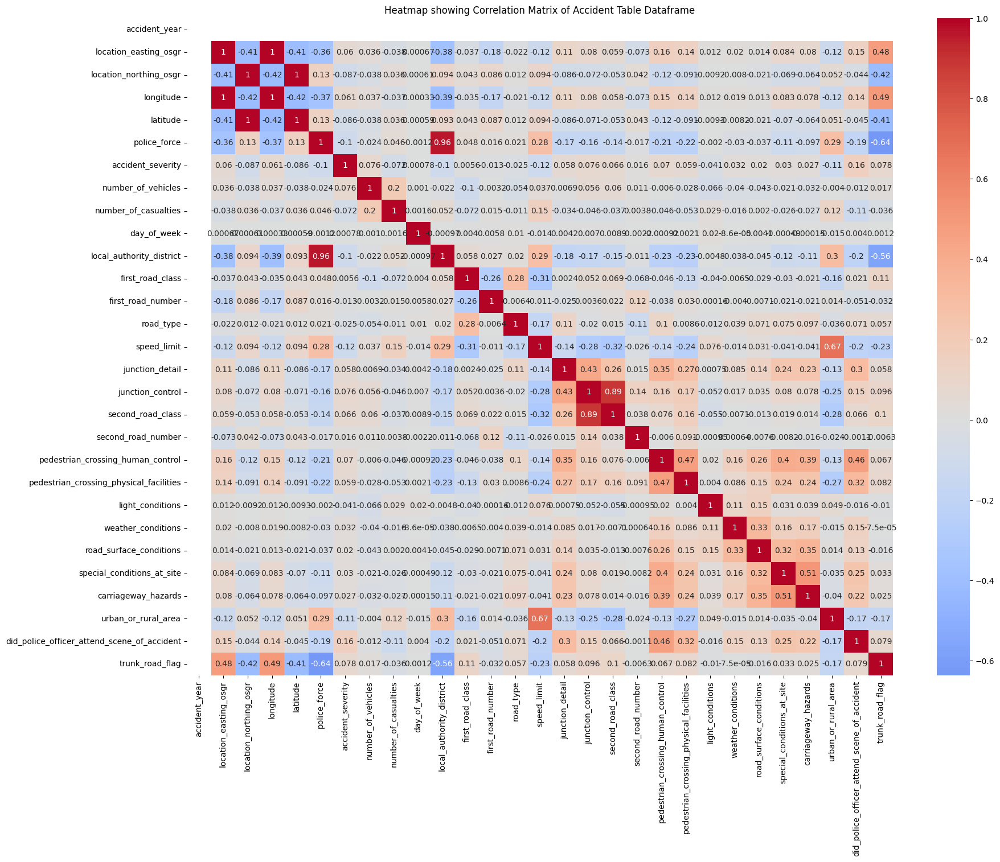

In [16]:
accident_correlation = accident_table .corr()

# Visualise the correlation matrix using seaborn to create heatmap
plt.figure(figsize=(20,15))
sns.heatmap(accident_correlation, annot=True, cmap='coolwarm', center=0)
plt.title('Heatmap showing Correlation Matrix of Accident Table Dataframe')
#show the plot
plt.show()


## Exploring Casualty Table

In [17]:
casualty_table = pd.read_sql_query("SELECT * FROM casualty WHERE accident_year = 2020", con)
casualty_table

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,484748,2020010219808,2020,010219808,1,1,3,1,31,6,3,9,5,0,0,0,0,1,4
1,484749,2020010220496,2020,010220496,1,1,3,2,2,1,3,1,1,0,0,0,0,1,2
2,484750,2020010220496,2020,010220496,1,2,3,2,4,1,3,1,1,0,0,0,0,1,2
3,484751,2020010228005,2020,010228005,1,1,3,1,23,5,3,5,9,0,0,0,0,1,3
4,484752,2020010228006,2020,010228006,1,1,3,1,47,8,2,4,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115579,600327,2020991027064,2020,991027064,2,1,1,1,11,3,2,0,0,0,0,0,1,1,2
115580,600328,2020991029573,2020,991029573,1,1,3,2,63,9,3,10,1,0,0,0,0,1,10
115581,600329,2020991030297,2020,991030297,2,1,1,1,38,7,2,0,0,0,0,0,5,2,9
115582,600330,2020991030900,2020,991030900,2,1,1,1,76,11,3,0,0,0,0,0,1,1,9


In [18]:
# Check the column of the Casualty Table

casualty_table.columns

Index(['casualty_index', 'accident_index', 'accident_year',
       'accident_reference', 'vehicle_reference', 'casualty_reference',
       'casualty_class', 'sex_of_casualty', 'age_of_casualty',
       'age_band_of_casualty', 'casualty_severity', 'pedestrian_location',
       'pedestrian_movement', 'car_passenger', 'bus_or_coach_passenger',
       'pedestrian_road_maintenance_worker', 'casualty_type',
       'casualty_home_area_type', 'casualty_imd_decile'],
      dtype='object')

In [19]:
# Check the dataframe structure of the casualty table
casualty_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115584 entries, 0 to 115583
Data columns (total 19 columns):
 #   Column                              Non-Null Count   Dtype 
---  ------                              --------------   ----- 
 0   casualty_index                      115584 non-null  int64 
 1   accident_index                      115584 non-null  object
 2   accident_year                       115584 non-null  int64 
 3   accident_reference                  115584 non-null  object
 4   vehicle_reference                   115584 non-null  int64 
 5   casualty_reference                  115584 non-null  int64 
 6   casualty_class                      115584 non-null  int64 
 7   sex_of_casualty                     115584 non-null  int64 
 8   age_of_casualty                     115584 non-null  int64 
 9   age_band_of_casualty                115584 non-null  int64 
 10  casualty_severity                   115584 non-null  int64 
 11  pedestrian_location                 115

In [20]:
casualty_table.describe()

,casualty_index,accident_year,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
count,115584.000000,115584.0,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.000000,115584.00000
mean,542539.500000,2020.0,1.460557,1.347790,1.441272,1.354859,36.489748,6.292610,2.800820,0.696861,0.561592,0.223093,0.038950,0.012709,7.388367,1.078177,4.36114
std,33366.371094,0.0,2.991765,4.036721,0.708365,0.520195,18.985022,2.392856,0.429851,2.059930,1.879680,0.603991,0.381528,0.164516,9.914714,0.904791,3.17141
min,484748.000000,2020.0,1.000000,1.000000,1.000000,-1.000000,-1.000000,-1.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000,-1.000000,-1.00000
25%,513643.750000,2020.0,1.000000,1.000000,1.000000,1.000000,23.000000,5.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,2.00000
50%,542539.500000,2020.0,1.000000,1.000000,1.000000,1.000000,33.000000,6.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,1.000000,4.00000
75%,571435.250000,2020.0,2.000000,1.000000,2.000000,2.000000,50.000000,8.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,1.000000,7.00000
max,600331.000000,2020.0,999.000000,992.000000,3.000000,9.000000,99.000000,11.000000,3.000000,10.000000,9.000000,9.000000,9.000000,2.000000,98.000000,3.000000,10.00000


In [21]:
# Check the shape and dimension of the Dataframe
casualty_table.shape

(115584, 19)

In [22]:
# Check the sum of the missing values in the DataFrame

casualty_table.isnull().sum()

casualty_index                        0
accident_index                        0
accident_year                         0
accident_reference                    0
vehicle_reference                     0
casualty_reference                    0
casualty_class                        0
sex_of_casualty                       0
age_of_casualty                       0
age_band_of_casualty                  0
casualty_severity                     0
pedestrian_location                   0
pedestrian_movement                   0
car_passenger                         0
bus_or_coach_passenger                0
pedestrian_road_maintenance_worker    0
casualty_type                         0
casualty_home_area_type               0
casualty_imd_decile                   0
dtype: int64

There are no missing values in the casualty table dataframe

In [23]:
# checking for duplicated rows in the casualty table dataframe

casualty_table.duplicated()

0         False
1         False
2         False
3         False
4         False
          ...  
115579    False
115580    False
115581    False
115582    False
115583    False
Length: 115584, dtype: bool

In [24]:
# Check the unique value in each columns and iterates through each column
for column in casualty_table.columns:
    unique_values = casualty_table[column].unique()
    print(f"Unique values in column '{column}': {unique_values}")


Unique values in column 'casualty_index': [484748 484749 484750 ... 600329 600330 600331]
Unique values in column 'accident_index': ['2020010219808' '2020010220496' '2020010228005' ... '2020991030297'
 '2020991030900' '2020991032575']
Unique values in column 'accident_year': [2020]
Unique values in column 'accident_reference': ['010219808' '010220496' '010228005' ... '991030297' '991030900'
 '991032575']
Unique values in column 'vehicle_reference': [  1   2   3   4   5   8   6   9  10 999   7  11]
Unique values in column 'casualty_reference': [  1   2   3   4   5   6   7   8   9  10  11  40  12  13  14  15  16  17
  33  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  34  35
  36  37  38  39  41 902 992]
Unique values in column 'casualty_class': [3 1 2]
Unique values in column 'sex_of_casualty': [ 1  2 -1  9]
Unique values in column 'age_of_casualty': [31  2  4 23 47 32 33 25 41 50 62 37 -1 20 42 30 18 26 29 38 39 80 19 21
 48  7 79 45 27 44 51 83 52 43 22 59 60 77 12 54 10 

# Correlation Analysis of Casualty Dataframe

C:\Users\local_749458\Temp\ipykernel_29460\839444751.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  casualty_correlation = casualty_table .corr()


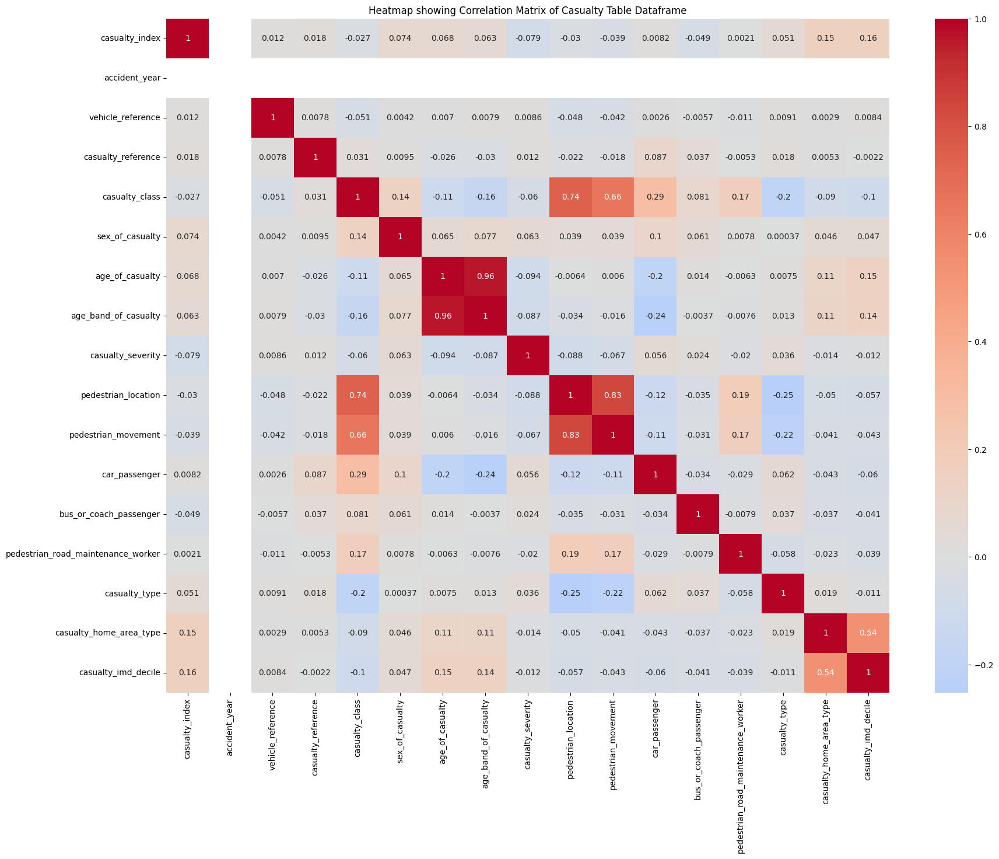

In [25]:
casualty_correlation = casualty_table .corr()

# Visualise the correlation matrix using seaborn to create heatmap
plt.figure(figsize=(20,15))
sns.heatmap(casualty_correlation, annot=True, cmap='coolwarm', center=0)
plt.title('Heatmap showing Correlation Matrix of Casualty Table Dataframe')
#show the plot
plt.show()


# Exploring the Vehicle table

In [26]:
vehicle_table = pd.read_sql_query("SELECT * FROM vehicle WHERE accident_year = 2020", con)
vehicle_table

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,681716,2020010219808,2020,010219808,1,9,9,5,1,5,...,6,2,32,6,1968,2,6,AUDI Q5,4,1
1,681717,2020010220496,2020,010220496,1,9,0,4,2,6,...,2,1,45,7,1395,1,2,AUDI A1,7,1
2,681718,2020010228005,2020,010228005,1,9,0,18,-1,-1,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
3,681719,2020010228006,2020,010228006,1,8,0,18,1,5,...,1,1,44,7,1798,8,8,TOYOTA PRIUS,2,1
4,681720,2020010228011,2020,010228011,1,9,0,18,3,7,...,6,1,20,4,2993,2,4,BMW 4 SERIES,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167370,849086,2020991030297,2020,991030297,1,9,0,7,8,2,...,1,1,57,9,1968,2,2,AUDI A5,7,1
167371,849087,2020991030297,2020,991030297,2,5,0,16,6,2,...,5,1,38,7,1301,1,2,KTM 1290 SUPERDUKE,9,2
167372,849088,2020991030900,2020,991030900,1,9,0,7,8,2,...,6,2,68,10,1995,2,1,BMW X3,5,1
167373,849089,2020991030900,2020,991030900,2,1,0,18,6,2,...,6,1,76,11,-1,-1,-1,-1,9,1


In [27]:
# check the column of the vehicle table dataframe

vehicle_table.columns

Index(['vehicle_index', 'accident_index', 'accident_year',
       'accident_reference', 'vehicle_reference', 'vehicle_type',
       'towing_and_articulation', 'vehicle_manoeuvre',
       'vehicle_direction_from', 'vehicle_direction_to',
       'vehicle_location_restricted_lane', 'junction_location',
       'skidding_and_overturning', 'hit_object_in_carriageway',
       'vehicle_leaving_carriageway', 'hit_object_off_carriageway',
       'first_point_of_impact', 'vehicle_left_hand_drive',
       'journey_purpose_of_driver', 'sex_of_driver', 'age_of_driver',
       'age_band_of_driver', 'engine_capacity_cc', 'propulsion_code',
       'age_of_vehicle', 'generic_make_model', 'driver_imd_decile',
       'driver_home_area_type'],
      dtype='object')

In [28]:
# check the structure of the vehicle table dataframe

vehicle_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167375 entries, 0 to 167374
Data columns (total 28 columns):
 #   Column                            Non-Null Count   Dtype 
---  ------                            --------------   ----- 
 0   vehicle_index                     167375 non-null  int64 
 1   accident_index                    167375 non-null  object
 2   accident_year                     167375 non-null  int64 
 3   accident_reference                167375 non-null  object
 4   vehicle_reference                 167375 non-null  int64 
 5   vehicle_type                      167375 non-null  int64 
 6   towing_and_articulation           167375 non-null  int64 
 7   vehicle_manoeuvre                 167375 non-null  int64 
 8   vehicle_direction_from            167375 non-null  int64 
 9   vehicle_direction_to              167375 non-null  int64 
 10  vehicle_location_restricted_lane  167375 non-null  int64 
 11  junction_location                 167375 non-null  int64 
 12  sk

In [29]:
# Check the statistical summary of the vehicle table dataframe 
vehicle_table.describe()

,vehicle_index,accident_year,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,vehicle_location_restricted_lane,junction_location,...,vehicle_left_hand_drive,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,driver_imd_decile,driver_home_area_type
count,167375.00000,167375.0,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,...,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000,167375.000000
mean,765403.00000,2020.0,1.549198,10.051310,0.221664,19.538987,4.406387,4.455068,7.537870,2.598303,...,1.448962,4.717066,1.480347,34.509658,5.780272,1332.294554,0.970121,5.820600,3.904143,0.871253
std,48317.14499,0.0,2.538196,11.692412,1.344230,23.661274,2.718826,2.696937,25.898393,3.285627,...,1.854349,1.914971,0.693344,20.797517,3.185713,1543.509942,1.585310,6.331929,3.445329,1.072733
min,681716.00000,2020.0,1.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,723559.50000,2020.0,1.000000,9.000000,0.000000,9.000000,2.000000,2.000000,0.000000,0.000000,...,1.000000,4.000000,1.000000,22.000000,5.000000,-1.000000,-1.000000,-1.000000,1.000000,1.000000
50%,765403.00000,2020.0,1.000000,9.000000,0.000000,18.000000,5.000000,5.000000,0.000000,1.000000,...,1.000000,6.000000,1.000000,34.000000,6.000000,1368.000000,1.000000,5.000000,4.000000,1.000000
75%,807246.50000,2020.0,2.000000,9.000000,0.000000,18.000000,7.000000,7.000000,0.000000,6.000000,...,1.000000,6.000000,2.000000,49.000000,8.000000,1910.000000,2.000000,11.000000,7.000000,1.000000
max,849090.00000,2020.0,999.000000,98.000000,9.000000,99.000000,9.000000,9.000000,99.000000,9.000000,...,9.000000,6.000000,3.000000,100.000000,11.000000,17696.000000,12.000000,96.000000,10.000000,3.000000


In [30]:
# Check the shape and dimension of the vehicle dataframe
vehicle_table.shape

(167375, 28)

In [31]:
# check the misssing values of the vehicle table dataframe 
vehicle_table.isnull().sum()

vehicle_index                       0
accident_index                      0
accident_year                       0
accident_reference                  0
vehicle_reference                   0
vehicle_type                        0
towing_and_articulation             0
vehicle_manoeuvre                   0
vehicle_direction_from              0
vehicle_direction_to                0
vehicle_location_restricted_lane    0
junction_location                   0
skidding_and_overturning            0
hit_object_in_carriageway           0
vehicle_leaving_carriageway         0
hit_object_off_carriageway          0
first_point_of_impact               0
vehicle_left_hand_drive             0
journey_purpose_of_driver           0
sex_of_driver                       0
age_of_driver                       0
age_band_of_driver                  0
engine_capacity_cc                  0
propulsion_code                     0
age_of_vehicle                      0
generic_make_model                  0
driver_imd_d

There are no missing values in the vehicle table  dataframe

In [32]:
# Check the unique value in each columns and iterates through each column
for column in vehicle_table.columns:
    unique_values = vehicle_table[column].unique()
    print(f"Unique values in column '{column}': {unique_values}")


Unique values in column 'vehicle_index': [681716 681717 681718 ... 849088 849089 849090]
Unique values in column 'accident_index': ['2020010219808' '2020010220496' '2020010228005' ... '2020991030297'
 '2020991030900' '2020991032575']
Unique values in column 'accident_year': [2020]
Unique values in column 'accident_reference': ['010219808' '010220496' '010228005' ... '991030297' '991030900'
 '991032575']
Unique values in column 'vehicle_reference': [  1   2   3   4   5   6   7   8   9  10  11 999  12  13]
Unique values in column 'vehicle_type': [ 9  8  3  2 11  1 90 19  4  5 21 97 20 98 10 17 23 22 18 16]
Unique values in column 'towing_and_articulation': [ 9  0  3  1  5  4 -1  2]
Unique values in column 'vehicle_manoeuvre': [ 5  4 18  3  2 99 11  1 17  9 14 13  7 15  6 16 10  8 12 -1]
Unique values in column 'vehicle_direction_from': [ 1  2 -1  3  5  0  7  9  8  6  4]
Unique values in column 'vehicle_direction_to': [ 5  6 -1  7  1  0  3  9  4  2  8]
Unique values in column 'vehicle_loc

# Correlation Matrix of Vehicle Table

C:\Users\local_749458\Temp\ipykernel_29460\3740537748.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  vehicle_correlation = vehicle_table .corr()


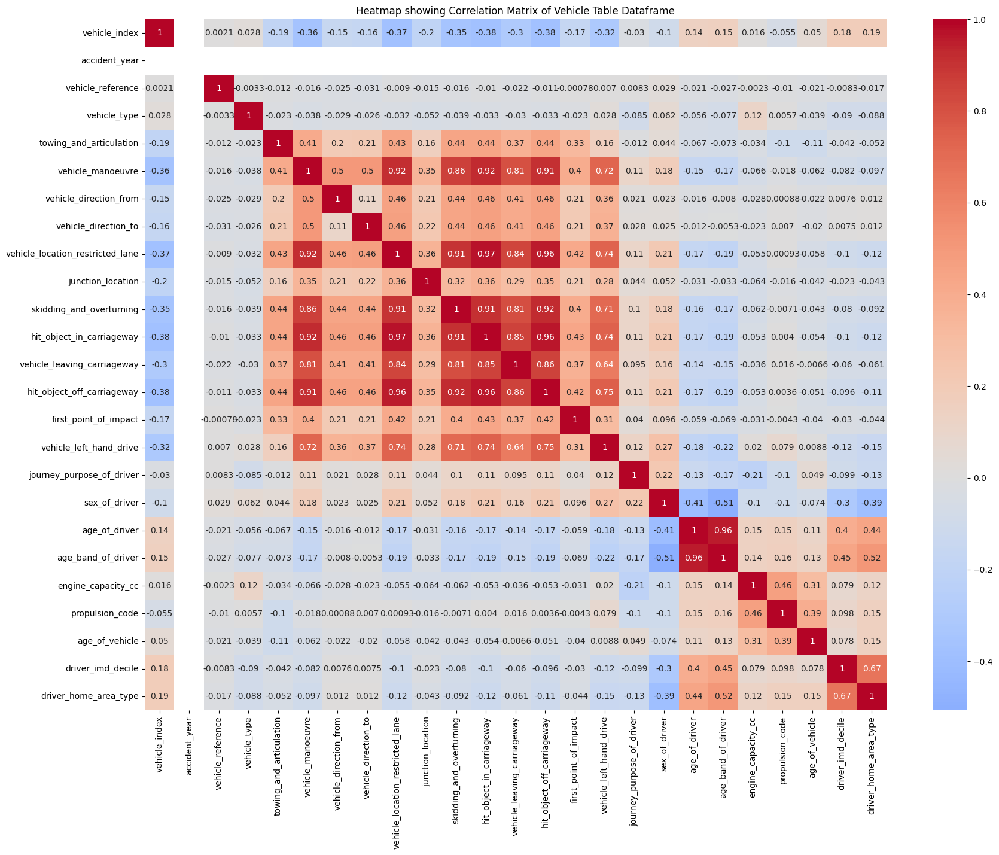

In [33]:
vehicle_correlation = vehicle_table .corr()

# Visualise the correlation matrix using seaborn to create heatmap
plt.figure(figsize=(20,15))
sns.heatmap(vehicle_correlation, annot=True, cmap='coolwarm', center=0)
plt.title('Heatmap showing Correlation Matrix of Vehicle Table Dataframe')
#show the plot
plt.show()

# LSOA TABLE

In [34]:
lsoa_table = pd.read_sql_query("SELECT * FROM lsoa ", con)
lsoa_table

,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,1,E01000001,City of London 001A,City of London 001A,1.298652e+05,2635.772001,68cc6127-1008-4fbe-a16c-78fb089a7c43
1,2,E01000002,City of London 001B,City of London 001B,2.284189e+05,2707.986202,937edbc3-c1bf-4d35-b274-b0a1480a7c09
2,3,E01000003,City of London 001C,City of London 001C,5.905477e+04,1224.774479,2686dcaf-10b9-4736-92af-4788d4feaa69
3,4,E01000004,City of London 001D,City of London 001D,2.544551e+06,10718.466240,3c493140-0b3f-4b9a-b358-22011dc5fb89
4,5,E01000005,City of London 001E,City of London 001E,1.895782e+05,2275.809358,b569093d-788d-41be-816c-d6d7658b2311
...,...,...,...,...,...,...,...
34373,34374,W01001892,Cardiff 020D,Caerdydd 020D,2.699088e+05,2537.220060,1a25aa1e-5db5-4d32-8355-473409dbd69f
34374,34375,W01001893,Cardiff 010B,Caerdydd 010B,4.288488e+06,9807.284401,b6af5e24-eb2a-404a-98a6-a282037b3e10
34375,34376,W01001894,Cardiff 010C,Caerdydd 010C,3.337511e+05,2929.546177,72d16f53-115d-4926-936d-2f1b1d659d46
34376,34377,W01001895,Cardiff 010D,Caerdydd 010D,1.360174e+06,8141.281226,8e105eb9-f68e-4cdb-bca6-b49f6592cb71


# Exploring the lsoa table

In [35]:
# Check the structure of the dataframe

lsoa_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34378 entries, 0 to 34377
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   objectid       34378 non-null  int64  
 1   lsoa01cd       34378 non-null  object 
 2   lsoa01nm       34378 non-null  object 
 3   lsoa01nmw      34378 non-null  object 
 4   shape__area    34378 non-null  float64
 5   shape__length  34378 non-null  float64
 6   globalid       34378 non-null  object 
dtypes: float64(2), int64(1), object(4)
memory usage: 1.8+ MB


In [36]:
# check the stistical summary of the dataframe

lsoa_table.describe()

,objectid,shape__area,shape__length
count,34378.000000,3.437800e+04,34378.000000
mean,17189.500000,4.484756e+06,8672.586392
std,9924.218114,1.497949e+07,11186.682402
min,1.000000,1.836184e+04,794.752314
25%,8595.250000,2.804555e+05,3329.866718
50%,17189.500000,4.843540e+05,4605.231856
75%,25783.750000,1.509910e+06,7947.973477
max,34378.000000,6.837464e+08,176560.397355


In [37]:
# check the missing values
lsoa_table.isnull().sum()

objectid         0
lsoa01cd         0
lsoa01nm         0
lsoa01nmw        0
shape__area      0
shape__length    0
globalid         0
dtype: int64

In [38]:
# check the shape and dimensions of the dataframe

lsoa_table.shape

(34378, 7)

The dataframe has 34378 rows and 7 columns

In [39]:
# check the dataframe for duplicate rows

In [40]:
lsoa_table.duplicated()

0        False
1        False
2        False
3        False
4        False
         ...  
34373    False
34374    False
34375    False
34376    False
34377    False
Length: 34378, dtype: bool

There are no duplicated rows in the dataframe

# Correlation Matrix of LSOA Dataframe using Heatmap

C:\Users\local_749458\Temp\ipykernel_29460\4133483510.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  lsoa_correlation = lsoa_table .corr()


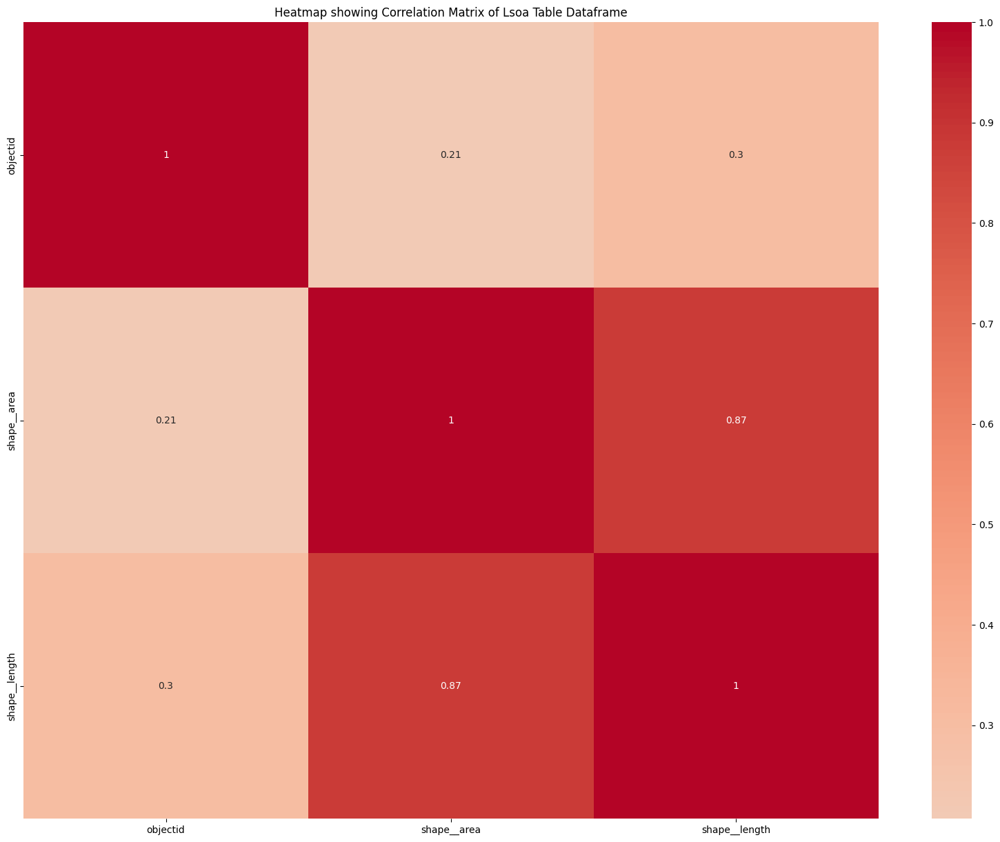

In [41]:
lsoa_correlation = lsoa_table .corr()

# Visualise the correlation matrix using seaborn to create heatmap
plt.figure(figsize=(20,15))
sns.heatmap(lsoa_correlation, annot=True, cmap='coolwarm', center=0)
plt.title('Heatmap showing Correlation Matrix of Lsoa Table Dataframe')
#show the plot
plt.show()

# Checking Correlations Between Some Columns

In [42]:
# Calculate the correlation matrice between location_easting_osgr and longitude
correlation_longitude = accident_table.loc[accident_table["location_easting_osgr"].notnull(),["location_easting_osgr", "longitude"]].corr()
correlation_longitude

,location_easting_osgr,longitude
location_easting_osgr,1.000000,0.999464
longitude,0.999464,1.000000


From the above information, correlation of 0.999464 indicates a strong positive relationship between location_easting_osgr and longitude.

In [43]:
correlation_latitude = accident_table.loc[accident_table["location_northing_osgr"].notnull(),["location_northing_osgr", "latitude"]].corr()
correlation_latitude

,location_northing_osgr,latitude
location_northing_osgr,1.000000,0.999969
latitude,0.999969,1.000000


From the above information, correlation of 0.999464 indicates a strong positive relationship between location_northing_osgr and latitude.

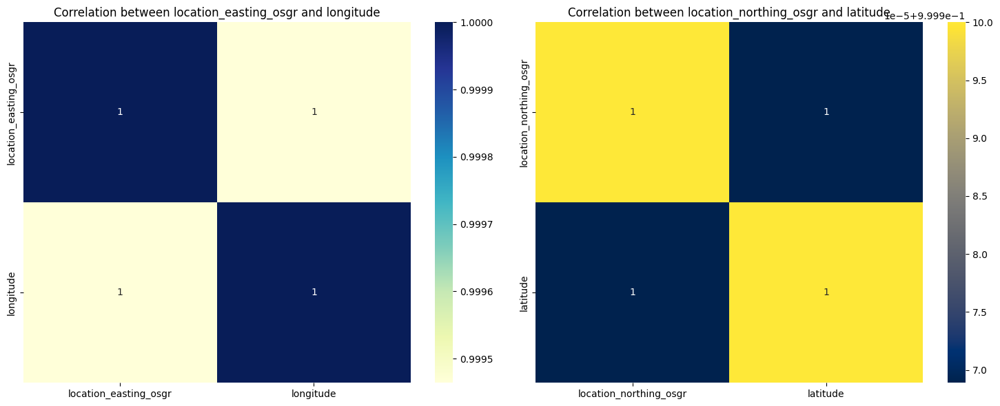

In [44]:
# Visualization of the correlations using heatmap
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
# for location_easting_osgr and longitude
sns.heatmap(correlation_longitude, annot=True, cmap="YlGnBu")
# add plot title
plt.title("Correlation between location_easting_osgr and longitude")

# Visualization for location_northing_osgr and latitude
plt.subplot(1, 2, 2)
sns.heatmap(correlation_latitude, annot=True, cmap="cividis")
# plot title
plt.title("Correlation between location_northing_osgr and latitude")

plt.tight_layout()
# show the plot
plt.show()

# DROPPING THE UNNECESSARY COLUMNS

In [45]:
#  Let's drop the unnecessary columns

columns_unnecessary = ["lsoa_of_accident_location", "location_easting_osgr", "location_northing_osgr", "first_road_number", "second_road_number"]
accident_table = accident_table.drop(columns=columns_unnecessary)

In [46]:
# Sanity check on accident_table column 

accident_table

,accident_index,accident_year,accident_reference,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag
0,2020010219808,2020,010219808,-0.254001,51.462262,1,3,1,1,04/02/2020,...,9,9,1,9,9,0,0,1,3,2
1,2020010220496,2020,010220496,-0.139253,51.470327,1,3,1,2,27/04/2020,...,0,4,1,1,1,0,0,1,1,2
2,2020010228005,2020,010228005,-0.178719,51.529614,1,3,1,1,01/01/2020,...,0,0,4,1,2,0,0,1,1,2
3,2020010228006,2020,010228006,-0.001683,51.541210,1,2,1,1,01/01/2020,...,0,4,4,1,1,0,0,1,1,2
4,2020010228011,2020,010228011,-0.137592,51.515704,1,3,1,2,01/01/2020,...,0,0,4,1,1,0,0,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020991027064,2020,991027064,-2.926320,56.473539,99,2,2,1,12/08/2020,...,0,0,1,1,1,0,0,1,1,-1
91195,2020991029573,2020,991029573,-4.267565,55.802353,99,3,1,1,13/11/2020,...,0,0,1,1,1,0,0,1,2,-1
91196,2020991030297,2020,991030297,-2.271903,57.186317,99,2,2,1,15/04/2020,...,0,0,1,1,1,0,0,2,1,-1
91197,2020991030900,2020,991030900,-3.968753,55.950940,99,3,2,1,15/12/2020,...,0,0,1,1,1,0,0,1,2,-1


# DATA CLEANING

## Cleaning the sex of driver column

In [47]:
# The sex of driver column in the dataframe

vehicle_table['sex_of_driver']

0         2
1         1
2         3
3         1
4         1
         ..
167370    1
167371    1
167372    2
167373    1
167374    1
Name: sex_of_driver, Length: 167375, dtype: int64

In [48]:
# Rows where sex of driver is denoted as -1 (Negative)
sex_rows = vehicle_table[vehicle_table['sex_of_driver'] == -1]
sex_rows

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
28,681744,2020010228045,2020,010228045,2,9,0,99,9,9,...,-1,-1,-1,-1,1797,8,10,TOYOTA PRIUS,-1,-1
445,682161,2020010228856,2020,010228856,2,9,0,99,9,9,...,-1,-1,-1,-1,1349,1,12,MAZDA 2,2,1
587,682303,2020010229084,2020,010229084,2,9,0,99,9,9,...,-1,-1,-1,-1,2188,2,13,-1,4,1
1098,682814,2020010230168,2020,010230168,2,9,0,99,9,9,...,-1,-1,-1,-1,1339,1,15,HONDA JAZZ,2,1
1830,683546,2020010231483,2020,010231483,2,9,0,99,9,9,...,-1,-1,-1,-1,1997,2,6,FORD KUGA,-1,-1
2263,683979,2020010232252,2020,010232252,2,9,0,99,9,9,...,-1,-1,-1,-1,1998,2,12,MAZDA 6,4,1
3825,685541,2020010234862,2020,010234862,2,11,9,99,9,9,...,-1,-1,-1,-1,6370,2,11,MERCEDES MODEL MISSING,-1,-1
5020,686736,2020010236894,2020,010236894,2,9,0,99,9,9,...,-1,-1,-1,-1,2993,2,16,BMW 7 SERIES,6,1
5061,686777,2020010236965,2020,010236965,1,9,9,99,9,9,...,-1,-1,-1,-1,1797,8,10,TOYOTA PRIUS,-1,-1
5145,686861,2020010237117,2020,010237117,2,9,0,99,9,9,...,-1,-1,-1,-1,-1,-1,-1,-1,-1,-1


In [49]:
# Checking the unique value in sex of the driver column
print(vehicle_table['sex_of_driver'].unique())

[ 2  1  3 -1]


In [50]:
# Replace all -1 with nan in the 'sex_of_driver' column

vehicle_table['sex_of_driver'] = vehicle_table['sex_of_driver'].replace(-1, np.nan)

In [51]:
vehicle_table['sex_of_driver'].isnull().sum()

13

In [52]:
# Sanity check for -1

vehicle_table[vehicle_table['sex_of_driver'] == -1]

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type


In [53]:
# Replace all nan values with 3 as it is stipulated as unknown
vehicle_table['sex_of_driver'].fillna(3, inplace = True)

From the vehicle record stats 19 form, sex of driver is filled as male = 1 Female = 2 unknown = 3. Therefore, since there is a column for unknown, we are going to change all -1 in sex of driver column in unknown_sex_rows to 3 meaning unknown_sex_rows



In [54]:
vehicle_table['sex_of_driver'].isnull().sum()

0

In [55]:
# Sanity check
print(vehicle_table['sex_of_driver'].unique())

[2. 1. 3.]


## Data Cleaning of Age of driver Column

In [56]:
# Check the unique value of age of the driver column
print(vehicle_table['age_of_driver'].unique())

[ 32  45  -1  44  20  25  41  19  26  62  37  40  33  51  30  18  29  24
  38  77  48  50  79  42  52  22  31  28  57  81  59  67  34  23  54  53
  27  39  56  43  88  35  46  16  49  21  80  66  55  47  60  36  58  70
  71  17  85  69  61  87  73  64  65  63  83  78  72  68  14  82  74  75
  11  76  15  86  90   9  10  91  84  13   8  89  93  94  92   6  12   5
   4   7  97  95   3  98 100  99  96]


In [57]:
# Let's convert the age of driver column to numeric

vehicle_table['age_of_driver'] = pd.to_numeric(vehicle_table['age_of_driver'], errors = 'coerce')
vehicle_table['age_of_driver']

0         32
1         45
2         -1
3         44
4         20
          ..
167370    57
167371    38
167372    68
167373    76
167374    39
Name: age_of_driver, Length: 167375, dtype: int64

In [58]:
# Let's calculate the mean of the 'age_of_driver' column
age_mean = int(vehicle_table['age_of_driver'].mean())
age_mean

34

In [59]:
# Let's replace -1 values with the mean (34) of age of driver 
vehicle_table['age_of_driver']= vehicle_table['age_of_driver'].replace(-1,age_mean)
vehicle_table['age_of_driver']

0         32
1         45
2         34
3         44
4         20
          ..
167370    57
167371    38
167372    68
167373    76
167374    39
Name: age_of_driver, Length: 167375, dtype: int64

In [60]:
#Sanity check for age of the driver column 
vehicle_table['age_of_driver'].unique()

array([ 32,  45,  34,  44,  20,  25,  41,  19,  26,  62,  37,  40,  33,
        51,  30,  18,  29,  24,  38,  77,  48,  50,  79,  42,  52,  22,
        31,  28,  57,  81,  59,  67,  23,  54,  53,  27,  39,  56,  43,
        88,  35,  46,  16,  49,  21,  80,  66,  55,  47,  60,  36,  58,
        70,  71,  17,  85,  69,  61,  87,  73,  64,  65,  63,  83,  78,
        72,  68,  14,  82,  74,  75,  11,  76,  15,  86,  90,   9,  10,
        91,  84,  13,   8,  89,  93,  94,  92,   6,  12,   5,   4,   7,
        97,  95,   3,  98, 100,  99,  96], dtype=int64)

## Data Cleaning Age of Vehicle

In [61]:
# checking the values in age of vehicle column

print(vehicle_table['age_of_vehicle'].unique())

[ 6  2 -1  8  4  5  0  1 14  9 16 20 12 10 13 18  7  3 19 22 15 11 17 28
 21 32 24 25 23 27 30 26 29 31 34 37 44 39 57 38 51 54 33 62 46 43 41 48
 45 36 58 60 64 86 50 61 53 35 55 49 92 88 42 67 84 40 52 66 56 78 47 96
 68 63 93]


In [62]:
# Check the row in age of vehicle column with -1 value
rows_minus1 = vehicle_table[vehicle_table["age_of_vehicle"] == -1]
rows_minus1

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
2,681718,2020010228005,2020,010228005,1,9,0,18,-1,-1,...,6,3.0,34,-1,-1,-1,-1,-1,-1,-1
10,681726,2020010228018,2020,010228018,1,9,0,18,1,5,...,6,1.0,62,9,-1,-1,-1,-1,6,1
14,681730,2020010228022,2020,010228022,1,9,0,18,7,3,...,6,1.0,34,-1,-1,-1,-1,-1,-1,-1
32,681748,2020010228077,2020,010228077,2,2,0,18,8,4,...,6,1.0,19,4,-1,-1,-1,-1,5,1
33,681749,2020010228086,2020,010228086,1,3,0,18,7,3,...,6,3.0,34,-1,-1,-1,-1,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167362,849078,2020991024039,2020,991024039,1,9,0,1,2,6,...,6,1.0,35,6,-1,-1,-1,-1,2,1
167366,849082,2020991024526,2020,991024526,1,98,0,18,6,2,...,1,1.0,43,7,-1,-1,-1,-1,3,1
167367,849083,2020991027064,2020,991027064,1,9,0,16,3,7,...,1,1.0,27,6,-1,-1,-1,-1,2,1
167368,849084,2020991027064,2020,991027064,2,1,0,5,1,5,...,5,1.0,11,3,-1,-1,-1,-1,2,1


In [63]:
# Find the mean of age of vehicle
mean_vehicleage = int(vehicle_table['age_of_vehicle'].mean())
mean_vehicleage

5

In [64]:
# Let's use the mean (5) to replace the -1 since its a categorical data
vehicle_table['age_of_vehicle']=  vehicle_table['age_of_vehicle'].replace(-1,mean_vehicleage)
vehicle_table['age_of_vehicle']

0         6
1         2
2         5
3         8
4         4
         ..
167370    2
167371    2
167372    1
167373    5
167374    2
Name: age_of_vehicle, Length: 167375, dtype: int64

In [65]:
# Sanity check
vehicle_table['age_of_vehicle'].unique()

array([ 6,  2,  5,  8,  4,  0,  1, 14,  9, 16, 20, 12, 10, 13, 18,  7,  3,
       19, 22, 15, 11, 17, 28, 21, 32, 24, 25, 23, 27, 30, 26, 29, 31, 34,
       37, 44, 39, 57, 38, 51, 54, 33, 62, 46, 43, 41, 48, 45, 36, 58, 60,
       64, 86, 50, 61, 53, 35, 55, 49, 92, 88, 42, 67, 84, 40, 52, 66, 56,
       78, 47, 96, 68, 63, 93], dtype=int64)

## Data Cleaning of Journey purpose of driver column

In [66]:
# Check out the enteries in the column

vehicle_table['journey_purpose_of_driver'].unique()

array([ 6,  2,  1, -1,  3,  4,  5], dtype=int64)

The entry contains -1. Recall, according to the Stats20-2011 form attached to this project, the codes used in filling this column are 1. Journey as part of work 2. Commuting to/from work 3. Taking pupil to/from school 4. Pupil riding to/from school 5. Other 6. Not known.

Hence, since we are not guessing for this project, all -1 will be replaced with 6 representing not known. As the driver or rider is not available to be asked

In [67]:
# check  the row in journey_purpose_of_driver column that has -1
vehicle_table[vehicle_table['journey_purpose_of_driver'] == -1]

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
28,681744,2020010228045,2020,010228045,2,9,0,99,9,9,...,-1,3.0,34,-1,1797,8,10,TOYOTA PRIUS,-1,-1
445,682161,2020010228856,2020,010228856,2,9,0,99,9,9,...,-1,3.0,34,-1,1349,1,12,MAZDA 2,2,1
587,682303,2020010229084,2020,010229084,2,9,0,99,9,9,...,-1,3.0,34,-1,2188,2,13,-1,4,1
606,682322,2020010229180,2020,010229180,2,3,0,18,5,1,...,-1,3.0,34,-1,125,1,4,YAMAHA GPD 125,-1,-1
624,682340,2020010229249,2020,010229249,2,9,9,99,9,9,...,-1,3.0,34,-1,-1,-1,5,-1,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24711,706427,2020010266626,2020,010266626,2,9,9,7,5,7,...,-1,3.0,34,-1,1598,1,10,RENAULT CLIO,-1,-1
25087,706803,2020010267176,2020,010267176,2,9,9,18,3,7,...,-1,3.0,34,-1,-1,-1,5,-1,-1,-1
25709,707425,2020010268066,2020,010268066,1,9,-1,7,3,5,...,-1,3.0,34,-1,-1,-1,5,-1,-1,-1
46003,727719,2020052001639,2020,052001639,2,1,0,18,4,8,...,-1,1.0,30,6,-1,-1,5,-1,-1,-1


In [68]:
# Let's replace all -1 entries with 6 in the journey purpose of driver column
vehicle_table['journey_purpose_of_driver'] = vehicle_table['journey_purpose_of_driver'].replace(-1, 6)

In [69]:
vehicle_table['journey_purpose_of_driver']

0         6
1         2
2         6
3         1
4         6
         ..
167370    1
167371    5
167372    6
167373    6
167374    6
Name: journey_purpose_of_driver, Length: 167375, dtype: int64

In [70]:
# Sanity check
vehicle_table['journey_purpose_of_driver'].unique()

array([6, 2, 1, 3, 4, 5], dtype=int64)

## Data Cleaning of Accident Table Dataframe

In [71]:
# Check for missing values in the dataframe.
accident_table.isnull().sum()

accident_index                                  0
accident_year                                   0
accident_reference                              0
longitude                                      14
latitude                                       14
police_force                                    0
accident_severity                               0
number_of_vehicles                              0
number_of_casualties                            0
date                                            0
day_of_week                                     0
time                                            0
local_authority_district                        0
local_authority_ons_district                    0
local_authority_highway                         0
first_road_class                                0
road_type                                       0
speed_limit                                     0
junction_detail                                 0
junction_control                                0


In [72]:
accident_table['latitude']

0        51.462262
1        51.470327
2        51.529614
3        51.541210
4        51.515704
           ...    
91194    56.473539
91195    55.802353
91196    57.186317
91197    55.950940
91198    56.003843
Name: latitude, Length: 91199, dtype: float64

In [73]:
accident_table['longitude']

0       -0.254001
1       -0.139253
2       -0.178719
3       -0.001683
4       -0.137592
           ...   
91194   -2.926320
91195   -4.267565
91196   -2.271903
91197   -3.968753
91198   -4.561040
Name: longitude, Length: 91199, dtype: float64

In [74]:
# Let's find the mean of the values
# Fill in the missing values in those columns with their mean.
longitude_mean = accident_table['longitude'].mean()
latitude_mean = accident_table['latitude'].mean()

In [75]:
# Let's replace NaN values with the mean
accident_table['longitude'].fillna(longitude_mean, inplace=True)
accident_table['latitude'].fillna(latitude_mean, inplace=True)

In [76]:
accident_table['latitude']

0        51.462262
1        51.470327
2        51.529614
3        51.541210
4        51.515704
           ...    
91194    56.473539
91195    55.802353
91196    57.186317
91197    55.950940
91198    56.003843
Name: latitude, Length: 91199, dtype: float64

In [77]:
# Let's do a sanity check
accident_table.isnull().sum()

accident_index                                 0
accident_year                                  0
accident_reference                             0
longitude                                      0
latitude                                       0
police_force                                   0
accident_severity                              0
number_of_vehicles                             0
number_of_casualties                           0
date                                           0
day_of_week                                    0
time                                           0
local_authority_district                       0
local_authority_ons_district                   0
local_authority_highway                        0
first_road_class                               0
road_type                                      0
speed_limit                                    0
junction_detail                                0
junction_control                               0
second_road_class   

## Cleaning of Weather Condition Column

In [78]:
accident_table['weather_conditions']

0        9
1        1
2        1
3        1
4        1
        ..
91194    1
91195    1
91196    1
91197    1
91198    1
Name: weather_conditions, Length: 91199, dtype: int64

In [79]:
# Check the unique value weather condition column
accident_table['weather_conditions'].unique()

array([ 9,  1,  8,  7,  2,  4,  5,  3,  6, -1], dtype=int64)

In [80]:
# Check the row with -1 value

accident_table[accident_table['weather_conditions'] == -1]

,accident_index,accident_year,accident_reference,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag
79777,2020520002488,2020,520002488,-2.809007,51.288686,52,1,1,1,24/06/2020,...,-1,-1,-1,-1,-1,-1,-1,2,-1,2


In [81]:
# Replace all -1 entries with 9 in the weather conditions column as 9 means unknown
accident_table['weather_conditions'] = accident_table['weather_conditions'].replace(-1, 9)

In [82]:
# Sanity check
accident_table['weather_conditions'].unique()

array([9, 1, 8, 7, 2, 4, 5, 3, 6], dtype=int64)

## Cleaning Speed Limit Column

In [83]:
accident_table['speed_limit']

0        20
1        20
2        30
3        30
4        30
         ..
91194    30
91195    30
91196    60
91197    30
91198    30
Name: speed_limit, Length: 91199, dtype: int64

In [84]:
# check the unique value of the speed limit column
accident_table['speed_limit'].unique()

array([20, 30, 40, 50, 60, 70, -1], dtype=int64)

In [85]:
# According to the road safety open dataset
specified_speedlimits = [10, 20, 30, 40, 50, 60, 70] 

In [86]:
# Lets check the rows where the speedlimit is not in the specified values as specified in the open dataset
filtered_speedlimits = accident_table.loc[~accident_table['speed_limit'].isin(specified_speedlimits), 'speed_limit']
filtered_speedlimits

1993    -1
5381    -1
16520   -1
18039   -1
18264   -1
18487   -1
20496   -1
31115   -1
47041   -1
53894   -1
55920   -1
68361   -1
Name: speed_limit, dtype: int64

Speed limit has -1 values which might affect our analysis later. since its a numerical variable and to prevent the influence of outliers -1,  the median will be used  to replace the -1



In [87]:
# Lets calculate the median 

median_speed = accident_table['speed_limit'].median()
median_speed

30.0

In [88]:
# Lets replace NaN values with the median
accident_table['speed_limit'].fillna(median_speed, inplace=True)

In [89]:
# Replace -1 entries in speed_limit column, with median value
accident_table['speed_limit'] = accident_table['speed_limit'].replace(-1,median_speed)
accident_table['speed_limit']

0        20
1        20
2        30
3        30
4        30
         ..
91194    30
91195    30
91196    60
91197    30
91198    30
Name: speed_limit, Length: 91199, dtype: int64

In [90]:
# Sanity check
accident_table['speed_limit'].unique()

array([20, 30, 40, 50, 60, 70], dtype=int64)

## Cleaning of Junction Control


In [91]:
accident_table['junction_control'].unique

<bound method Series.unique of 0       -1
1        2
2        1
3       -1
4        4
        ..
91194    4
91195    4
91196   -1
91197    4
91198   -1
Name: junction_control, Length: 91199, dtype: int64>

Junction Control column has -1 values which might affect our analysis later. In order to avoid biasedness which would later affect the analysis, I would be replacing -1 with nan. As this wont affect the clustering and further analysis compared to the effect when it is left as -1

In [92]:
# Replace -1 entries in junction_control column, with median value
accident_table['junction_control'].replace(-1,np.nan)

0        NaN
1        2.0
2        1.0
3        NaN
4        4.0
        ... 
91194    4.0
91195    4.0
91196    NaN
91197    4.0
91198    NaN
Name: junction_control, Length: 91199, dtype: float64

In [93]:
# Checking for missing values
accident_table['junction_control'].isnull().sum()

0

In [94]:
# Lets check rows where 'Junction Detail' is coded 00
accident_table[accident_table['junction_detail'] == '00']

,accident_index,accident_year,accident_reference,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag


## Accident Distribution

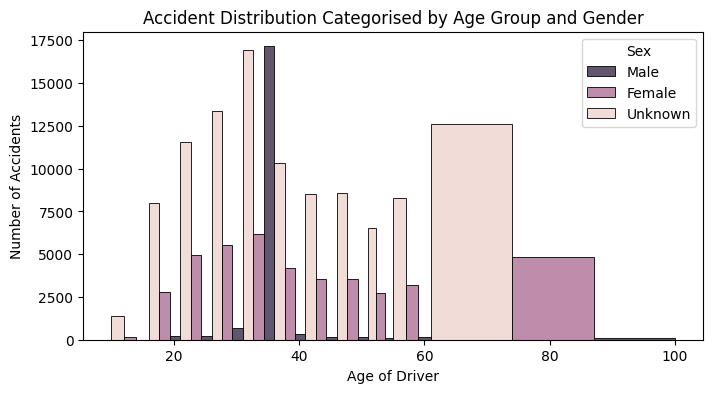

In [95]:
# Define age groups
built_agebins = [10, 16, 21, 26, 31, 36, 41, 46, 51, 55, 61, 100]
age_groups= ['10-15','16-20', '21-25', '26-30', '31-35', '36-40', '41-45', '46-50', '51-55', '55-60', 'Over 60']

# create a new column for age groups column
vehicle_table['Age_Group'] = pd.cut(vehicle_table['age_of_driver'], bins=built_agebins, labels=age_groups)

# using seaborn to visualise
plt.figure(figsize=(8, 4))
sns.histplot(data=vehicle_table, x='age_of_driver', hue='sex_of_driver', multiple='dodge', bins=built_agebins)

# label the plot
plt.xlabel('Age of Driver')
plt.ylabel('Number of Accidents')
plt.title('Accident Distribution Categorised by Age Group and Gender')
plt.legend(title='Sex', labels=['Male', 'Female', 'Unknown'])

# show the plot
plt.show()
 

C:\Users\local_749458\Temp\ipykernel_29460\135375042.py:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(accident_table.corr(), annot = True, cmap = plt.cm.CMRmap_r)


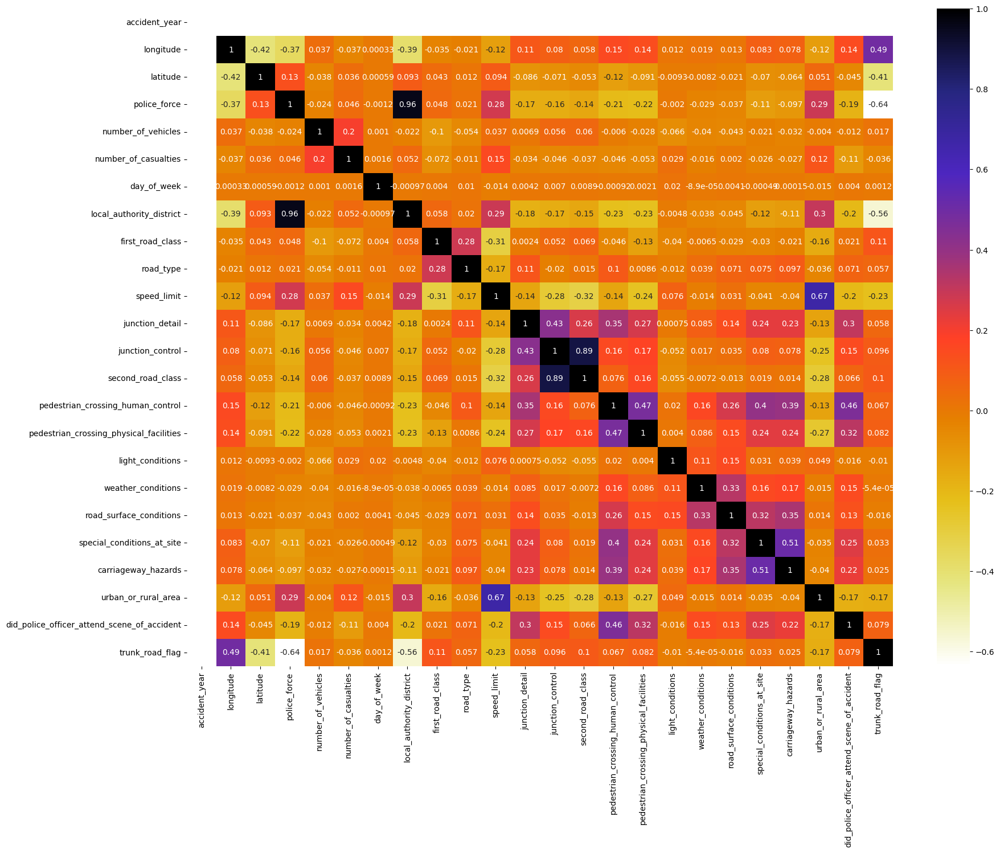

In [96]:
# Plot a heatmap showing the corrrelations
def correlation_heatmap(accident_table):
    plt.figure(figsize = (20, 15))
    sns.heatmap(accident_table.corr(), annot = True, cmap = plt.cm.CMRmap_r)
# plot the heatmap
heatmaps = accident_table.drop('accident_severity', axis = 1)
correlation_heatmap(heatmaps)

## Accident Severity Column


In [97]:
# Checking the unique values in accident severity column
accident_table['accident_severity'].unique()

array([3, 2, 1], dtype=int64)

In [98]:
# Value counts to check accident severity
accident_table['accident_severity'].value_counts()

3    71453
2    18355
1     1391
Name: accident_severity, dtype: int64

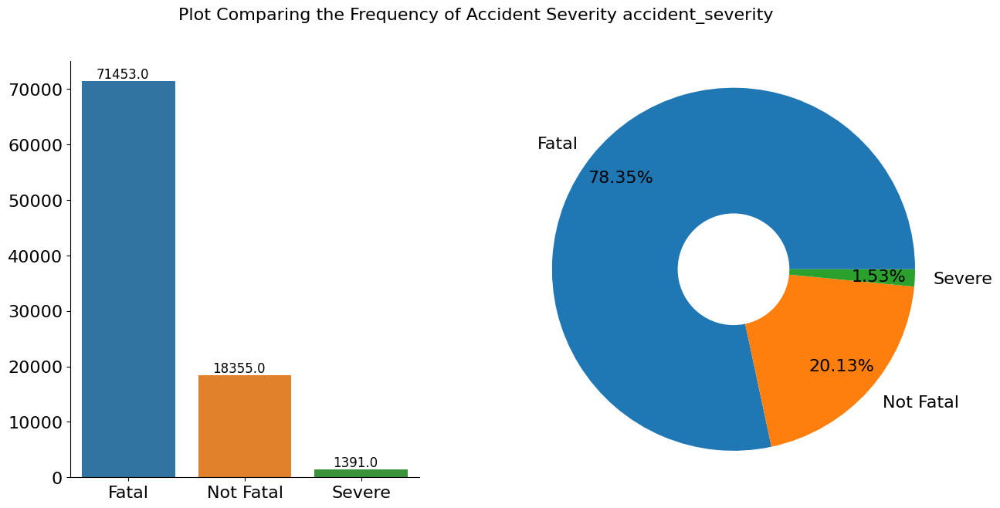

In [99]:
# Lets define a mapping for determining accident severity levels
severity_mapping = {1: 'Severe', 2: 'Not Fatal', 3: 'Fatal'}

# Let's include annotations
def first_function(plot):
    for annotaion in plot.patches:
        frequency = annotaion.get_height()
        x = annotaion.get_x() + annotaion.get_width() / 2 - 0.05
        y = annotaion.get_y() + annotaion.get_height()
        plot.annotate(f'{frequency}', (x, y), size=12, ha='center', va='bottom')

# Visualization
def donut_plot(accident_table, col):
    plt.figure(figsize=(14, 7))

    # mapping numerical values to meaningful labels
    accident_table[col] = accident_table[col].map(severity_mapping)

    # using countplot for plot 1
    plot1 = plt.subplot(1, 2, 1)
    count = sns.countplot(x=accident_table[col])
    plot1.set_xlabel('')
    plot1.set_ylabel('')
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    sns.despine(top=True, right=True)
    first_function(plot1)

    #using donutplot for plot 2
    plot2 = plt.subplot(1, 2, 2)
    plt.pie(accident_table[col].value_counts(),
            labels=accident_table[col].unique().tolist(),
            autopct='%1.2f%%',
            pctdistance=0.8,
            shadow=False,
            radius=1.3,
            textprops={'fontsize': 16}
            )
    circle = plt.Circle((0, 0), 0.4, fc='white')
    fig = plt.gcf()
    fig.gca().add_artist(circle)
    plot2.set_xlabel('')

    plt.suptitle("Plot Comparing the Frequency of Accident Severity {}".format(col), fontsize=16)
    plt.subplots_adjust(wspace=0.4)
    #show the plot
    plt.show()

donut_plot(accident_table, 'accident_severity')


## 1. Are there significant hours of the day, and days of the week, on which accidents occur?

In [100]:
plot_time = accident_table['time']
plot_time

0        09:00
1        13:55
2        01:25
3        01:50
4        02:25
         ...  
91194    14:30
91195    15:05
91196    12:42
91197    14:00
91198    13:50
Name: time, Length: 91199, dtype: object

In [101]:
significant_hours = accident_table.groupby('time')['accident_index'].count().sort_values(ascending=False)
significant_hours

time
17:00    862
16:00    785
15:00    774
17:30    746
18:00    739
        ... 
04:39      1
04:58      1
04:31      1
03:36      1
04:33      1
Name: accident_index, Length: 1438, dtype: int64

From the above information it shows that most accident occurs at 17:00 hour

In [102]:
## Convert the date in which accidents occur to datetime with the correct format
accident_table['date'] = pd.to_datetime(accident_table['date'], format='%d/%m/%Y')
accident_table['date']


0       2020-02-04
1       2020-04-27
2       2020-01-01
3       2020-01-01
4       2020-01-01
           ...    
91194   2020-08-12
91195   2020-11-13
91196   2020-04-15
91197   2020-12-15
91198   2020-08-25
Name: date, Length: 91199, dtype: datetime64[ns]

In [103]:
# Convert 'time' column to datetime format
accident_table['time'] = pd.to_datetime(accident_table['time'],format='%H:%M').dt.time

accident_table['time']

0        09:00:00
1        13:55:00
2        01:25:00
3        01:50:00
4        02:25:00
           ...   
91194    14:30:00
91195    15:05:00
91196    12:42:00
91197    14:00:00
91198    13:50:00
Name: time, Length: 91199, dtype: object

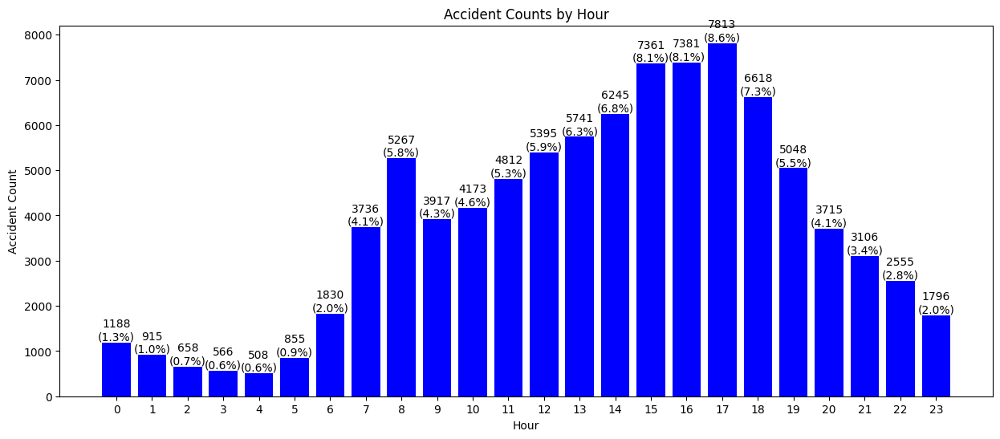

In [104]:
# Extract the hour from the 'time' column
accident_table['hour'] = accident_table['time'].apply(lambda x: x.hour)

# Calculate the counts of accidents for each hour
hourly_counts = accident_table['hour'].value_counts().sort_index()

# Total number of accidents
total_accidents = hourly_counts.sum()

# Create a bar plot of accident counts by hour
plt.figure(figsize=(15, 6))
MOVE = plt.bar(hourly_counts.index, hourly_counts.values, color='blue')

# Add counts and percentage on top of each bar
for COUNTING in MOVE:
    height = COUNTING.get_height()
    plt.annotate(f'{height}\n({height / total_accidents:.1%})', (COUNTING.get_x() + COUNTING.get_width() / 2., height), ha='center', va='bottom')
plt.title('Accident Counts by Hour')
plt.xlabel('Hour')
plt.ylabel('Accident Count')
plt.xticks(hourly_counts.index)
plt.show()


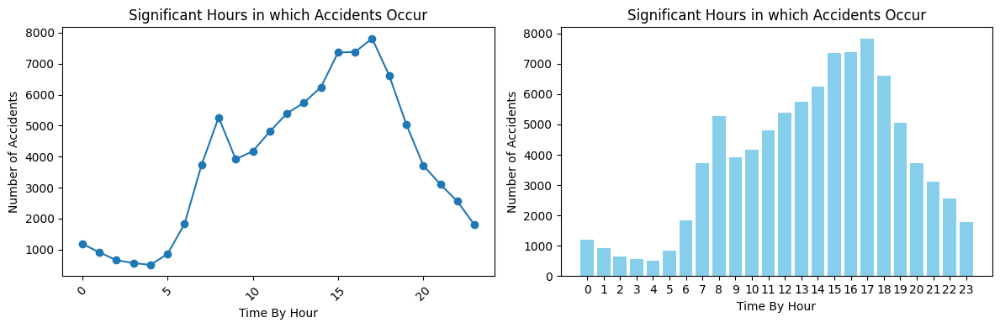

In [105]:
# Change the 'time' column to datetime format and store in a variable for plotting
time_datetime = pd.to_datetime(accident_table['time'], format='%H:%M:%S')

# Count of accidents per hour
counts_acci = time_datetime.dt.hour.value_counts().sort_index()

# Sort the accident counts by time
sort_count = counts_acci.sort_index()
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

# Plot 1 - Sorted Counts by Time
ax1 = axes[0]
ax1.plot(sort_count.index, sort_count.values, marker='o')
# Label the plot
ax1.set_title('Significant Hours in which Accidents Occur')
ax1.set_xlabel('Time By Hour')
ax1.set_ylabel('Number of Accidents')
ax1.tick_params(axis='x', rotation=45)

# Plot 2 - Hourly Distribution of Accidents

ax2 = axes[1]
ax2.bar(hourly_counts.index, hourly_counts.values, color='skyblue')

# Label the plots
ax2.set_title('Significant Hours in which Accidents Occur')
ax2.set_xlabel('Time By Hour')
ax2.set_ylabel('Number of Accidents')
ax2.set_xticks(hourly_counts.index)

plt.tight_layout()
# Show the plot
plt.show()


# Significant Days In Which Accident Occurs

In [106]:
# Mapping the numerical values for name of the week to actual day names
day_names = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
accident_table['day_names'] = accident_table['day_of_week'].replace(dict(enumerate(day_names)))

# Display the new column for day_name
accident_table[['day_of_week', 'day_names']]

,day_of_week,day_names
0,3,Wednesday
1,2,Tuesday
2,4,Thursday
3,4,Thursday
4,4,Thursday
...,...,...
91194,4,Thursday
91195,6,Saturday
91196,4,Thursday
91197,3,Wednesday


In [107]:
# Mapping the numerical values for name of the week to actual day names

day_names = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']
accident_table['day_names'] = accident_table['day_of_week'].replace(dict(enumerate(day_names)))

# Display the new dataframe showing the added column for day_names
accident_table

,accident_index,accident_year,accident_reference,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,hour,day_names
0,2020010219808,2020,010219808,-0.254001,51.462262,1,Fatal,1,1,2020-02-04,...,1,9,9,0,0,1,3,2,9,Wednesday
1,2020010220496,2020,010220496,-0.139253,51.470327,1,Fatal,1,2,2020-04-27,...,1,1,1,0,0,1,1,2,13,Tuesday
2,2020010228005,2020,010228005,-0.178719,51.529614,1,Fatal,1,1,2020-01-01,...,4,1,2,0,0,1,1,2,1,Thursday
3,2020010228006,2020,010228006,-0.001683,51.541210,1,Not Fatal,1,1,2020-01-01,...,4,1,1,0,0,1,1,2,1,Thursday
4,2020010228011,2020,010228011,-0.137592,51.515704,1,Fatal,1,2,2020-01-01,...,4,1,1,0,0,1,1,2,2,Thursday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020991027064,2020,991027064,-2.926320,56.473539,99,Not Fatal,2,1,2020-08-12,...,1,1,1,0,0,1,1,-1,14,Thursday
91195,2020991029573,2020,991029573,-4.267565,55.802353,99,Fatal,1,1,2020-11-13,...,1,1,1,0,0,1,2,-1,15,Saturday
91196,2020991030297,2020,991030297,-2.271903,57.186317,99,Not Fatal,2,1,2020-04-15,...,1,1,1,0,0,2,1,-1,12,Thursday
91197,2020991030900,2020,991030900,-3.968753,55.950940,99,Fatal,2,1,2020-12-15,...,1,1,1,0,0,1,2,-1,14,Wednesday


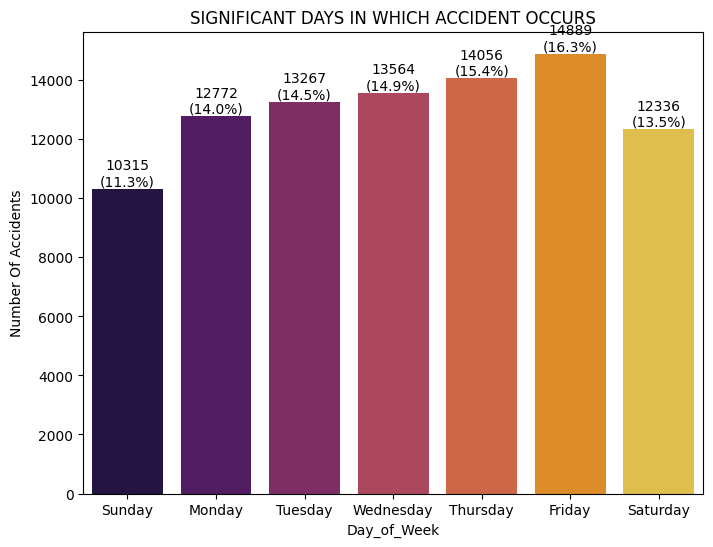

In [108]:
# Significant Days In Which Accidents Occur
Amounts = accident_table['day_of_week'].value_counts().sort_index()

# Total number of accidents
total_accidents_days = Amounts.sum()

# Use seaborn to visualize
plt.figure(figsize=(8, 6))
ax = sns.countplot(x=accident_table['day_of_week'], order=Amounts.index, palette='inferno')

# Add the value counts and percentage to the top of each bar
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f"{int(height)}\n({height / total_accidents_days:.1%})", (p.get_x() + p.get_width() / 2., height), ha='center', va='bottom', fontsize=10)

plt.title('SIGNIFICANT DAYS IN WHICH ACCIDENT OCCURS')
plt.xlabel('Day_of_Week')
plt.ylabel('Number Of Accidents')
plt.xticks(ticks=range(len(day_names)), labels=day_names, rotation=0)
# Display the plot
plt.show()


In [109]:
# Count the occurrence of each of the unique value representing each day of the week in the "day_of_week" column 
accident_table[['day_of_week']].value_counts()

day_of_week
6              14889
5              14056
4              13564
3              13267
2              12772
7              12336
1              10315
dtype: int64

# 2. For motorbikes, are there significant hours of the day, and days of the week, on which accidents occur? We suggest a focus on: Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc.

In [110]:
# Filter through the vehicle dataframe where vehicle_type is 2 or 3
motorbikes_125cc = vehicle_table[vehicle_table['vehicle_type'].isin([2, 3])]

motorbikes_125cc

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type,Age_Group
12,681728,2020010228020,2020,010228020,1,3,0,3,7,3,...,1.0,37,7,114,1,5,YAMAHA XC115,8,1,36-40
32,681748,2020010228077,2020,010228077,2,2,0,18,8,4,...,1.0,19,4,-1,-1,5,-1,5,1,16-20
33,681749,2020010228086,2020,010228086,1,3,0,18,7,3,...,3.0,34,-1,-1,-1,5,-1,-1,-1,31-35
36,681752,2020010228097,2020,010228097,2,3,0,18,1,5,...,1.0,20,4,125,1,4,PEUGEOT TWEET 125,6,1,16-20
58,681774,2020010228148,2020,010228148,1,3,0,14,5,1,...,1.0,20,4,125,1,0,HONDA GLR 125,2,1,16-20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167091,848807,2020991008618,2020,991008618,1,3,0,18,5,1,...,1.0,18,4,-1,-1,5,-1,2,2,16-20
167149,848865,2020991009778,2020,991009778,2,3,0,18,5,1,...,1.0,17,4,125,1,2,KEEWAY RK 125,3,1,16-20
167195,848911,2020991010130,2020,991010130,2,3,0,14,7,3,...,1.0,47,8,124,1,17,-1,5,1,46-50
167292,849008,2020991011809,2020,991011809,2,3,0,5,7,3,...,1.0,61,9,124,1,4,-1,3,1,55-60


In [111]:
motorbikes_125cc.head(5)

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type,Age_Group
12,681728,2020010228020,2020,010228020,1,3,0,3,7,3,...,1.0,37,7,114,1,5,YAMAHA XC115,8,1,36-40
32,681748,2020010228077,2020,010228077,2,2,0,18,8,4,...,1.0,19,4,-1,-1,5,-1,5,1,16-20
33,681749,2020010228086,2020,010228086,1,3,0,18,7,3,...,3.0,34,-1,-1,-1,5,-1,-1,-1,31-35
36,681752,2020010228097,2020,010228097,2,3,0,18,1,5,...,1.0,20,4,125,1,4,PEUGEOT TWEET 125,6,1,16-20
58,681774,2020010228148,2020,010228148,1,3,0,14,5,1,...,1.0,20,4,125,1,0,HONDA GLR 125,2,1,16-20


 Merge accident index on vehicle table already filtered and the accident table so we can see where accident occur when vehicle type is either 2 or 3

In [112]:
# Check the object type of accident index to ensure its in correct format before merging
motorbikes_125cc['accident_index'].dtype

accident_table['accident_index'].dtype

dtype('O')

In [113]:
# Use the accident index column to merge the two dataframes
motorbike_accident = pd.merge(motorbikes_125cc, accident_table, on = 'accident_index')
motorbike_accident

,vehicle_index,accident_index,accident_year_x,accident_reference_x,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,hour,day_names
0,681728,2020010228020,2020,010228020,1,3,0,3,7,3,...,4,1,1,0,0,1,1,2,3,Thursday
1,681748,2020010228077,2020,010228077,2,2,0,18,8,4,...,1,1,1,0,0,1,1,2,8,Thursday
2,681749,2020010228086,2020,010228086,1,3,0,18,7,3,...,1,1,1,0,0,1,1,2,14,Thursday
3,681752,2020010228097,2020,010228097,2,3,0,18,1,5,...,1,1,1,0,0,1,1,2,14,Thursday
4,681774,2020010228148,2020,010228148,1,3,0,14,5,1,...,4,1,1,0,0,1,1,2,19,Thursday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8646,848807,2020991008618,2020,991008618,1,3,0,18,5,1,...,6,1,1,0,0,2,1,-1,7,Monday
8647,848865,2020991009778,2020,991009778,2,3,0,18,5,1,...,4,2,2,0,0,2,1,-1,20,Friday
8648,848911,2020991010130,2020,991010130,2,3,0,14,7,3,...,4,1,1,0,0,1,2,-1,16,Friday
8649,849008,2020991011809,2020,991011809,2,3,0,5,7,3,...,4,8,2,0,0,1,2,-1,17,Thursday


In [114]:
# Exploring the new dataframe for motorbikes_125cc
motorbike_accident.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8651 entries, 0 to 8650
Data columns (total 61 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   vehicle_index                                8651 non-null   int64         
 1   accident_index                               8651 non-null   object        
 2   accident_year_x                              8651 non-null   int64         
 3   accident_reference_x                         8651 non-null   object        
 4   vehicle_reference                            8651 non-null   int64         
 5   vehicle_type                                 8651 non-null   int64         
 6   towing_and_articulation                      8651 non-null   int64         
 7   vehicle_manoeuvre                            8651 non-null   int64         
 8   vehicle_direction_from                       8651 non-null   int64         
 9

In [115]:
# Convert to datetime format with hours, minutes, and seconds
motorbike_accident['time'] = pd.to_datetime(motorbike_accident['time'], format='%H:%M:%S')
motorbike_accident['time']


0      1900-01-01 03:25:00
1      1900-01-01 08:00:00
2      1900-01-01 14:00:00
3      1900-01-01 14:37:00
4      1900-01-01 19:05:00
               ...        
8646   1900-01-01 07:20:00
8647   1900-01-01 20:50:00
8648   1900-01-01 16:30:00
8649   1900-01-01 17:30:00
8650   1900-01-01 17:55:00
Name: time, Length: 8651, dtype: datetime64[ns]

In [116]:
# Extract the hours from the time column
motorbike_accident['hour'] = motorbike_accident['time'].dt.hour
motorbike_accident['hour']

0        3
1        8
2       14
3       14
4       19
        ..
8646     7
8647    20
8648    16
8649    17
8650    17
Name: hour, Length: 8651, dtype: int64

In [117]:
# Determine the motorbike under 1255cc accident counts per hour
accident_counts  = motorbike_accident.groupby(motorbike_accident['hour']).size()
accident_counts 

hour
0      73
1      60
2      37
3      30
4      30
5      59
6     133
7     293
8     304
9     245
10    289
11    364
12    485
13    591
14    605
15    647
16    706
17    805
18    806
19    669
20    534
21    424
22    291
23    171
dtype: int64

In [118]:
# Group the motorbike_accident hour by hour, count occurrences, and sort by count in descending order
motorbike_accident_hour = motorbike_accident['time'].dt.time.value_counts().sort_values(ascending=False)
print(motorbike_accident_hour)

17:00:00    90
17:30:00    81
19:00:00    80
15:30:00    79
18:30:00    77
            ..
07:13:00     1
05:15:00     1
22:14:00     1
13:03:00     1
11:32:00     1
Name: time, Length: 1166, dtype: int64


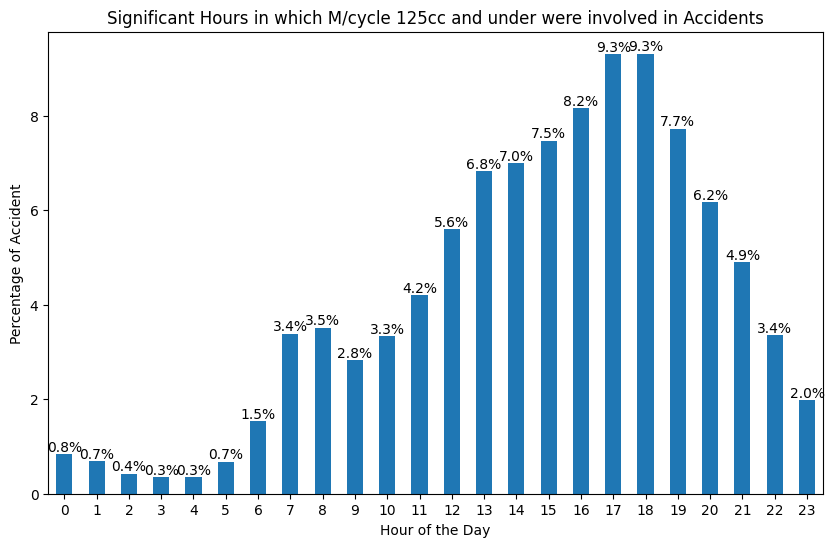

In [119]:
# Calculate the total count of accidents
total_accidents = accident_counts.sum()

# Calculate the percentages
percentages = (accident_counts / total_accidents) * 100

# Visualization
plt.figure(figsize=(10, 6))
ax = percentages.plot(kind='bar')

# Add the percentage labels on top of each the bars
for p in ax.patches:
    ax.annotate('{:.1f}%'.format(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 5), textcoords='offset points')

# Remove grid lines
ax.grid(False)

# Label the plots
plt.title('Significant Hours in which M/cycle 125cc and under were involved in Accidents')
plt.xlabel('Hour of the Day')
plt.ylabel('Percentage of Accident')
plt.xticks(rotation=0)

# Display the plots
plt.show()


# Significant Day Of The Week in Which Motorcycle 125cc and under Are Involved In Accident

In [120]:
motorbike_accident['day_of_week']

0       4
1       4
2       4
3       4
4       4
       ..
8646    1
8647    5
8648    5
8649    4
8650    2
Name: day_of_week, Length: 8651, dtype: int64

In [121]:
day_of_week_counts = motorbike_accident['day_of_week'].value_counts()
print(day_of_week_counts)

6    1474
5    1389
4    1249
7    1216
3    1202
2    1173
1     948
Name: day_of_week, dtype: int64


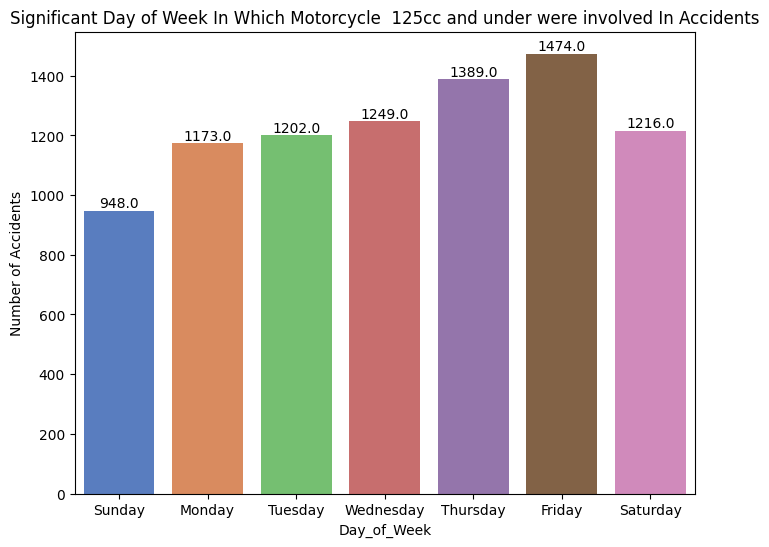

In [122]:
# SIGNIFICANT DAYS IN WHICH ACCIDENT OCCURS
motorbike_accident_Amounts = motorbike_accident['day_of_week'].value_counts().sort_index()

# Use seaborn to visualize
plt.figure(figsize=(8, 6))
sue = sns.countplot(x=motorbike_accident['day_of_week'], order=motorbike_accident_Amounts.index, palette='muted')

# Include the count at the top of each bar
for new_numbers in sue.patches:
    sue.annotate(f'{new_numbers.get_height()}', (new_numbers.get_x() +new_numbers.get_width() / 2., new_numbers.get_height()),ha='center', va='center', xytext=(0, 5), textcoords='offset points')
# Label the plot
plt.title('Significant Day of Week In Which Motorcycle  125cc and under were involved In Accidents')
plt.xlabel('Day_of_Week')
plt.ylabel('Number of Accidents')
plt.xticks(ticks=range(len(day_names)), labels=day_names, rotation=0)
#display the plot
plt.show()

##  Motorcycle over 125cc and up to 500cc

Recall, according to the accident form, vehicle type codes 4 denotes  Motorcycle over 125cc and up to 500cc

In [123]:
motorbikes_over_125cc = vehicle_table[vehicle_table['vehicle_type']==4]
motorbikes_over_125cc

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type,Age_Group
92,681808,2020010228247,2020,010228247,1,4,0,13,5,1,...,1.0,39,7,125,1,7,HONDA SH125,1,1,36-40
106,681822,2020010228265,2020,010228265,1,4,0,13,4,8,...,1.0,33,6,125,1,3,HONDA WW125EX2,5,1,31-35
618,682334,2020010229213,2020,010229213,1,4,0,99,9,9,...,1.0,44,7,395,1,10,-1,5,1,41-45
722,682438,2020010229461,2020,010229461,2,4,0,4,1,5,...,1.0,26,6,499,1,16,-1,3,1,21-25
750,682466,2020010229496,2020,010229496,1,4,0,15,3,7,...,1.0,18,4,-1,-1,5,PIAGGIO MP3,3,1,16-20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166361,848077,2020990997907,2020,990997907,1,4,0,18,8,4,...,1.0,21,5,-1,-1,5,-1,4,1,16-20
166744,848460,2020991003397,2020,991003397,3,4,0,17,4,8,...,1.0,29,6,249,1,16,-1,3,1,26-30
166837,848553,2020991004865,2020,991004865,2,4,0,17,8,5,...,2.0,27,6,125,1,1,-1,7,1,26-30
167039,848755,2020991008057,2020,991008057,2,4,0,18,7,2,...,1.0,38,7,249,1,9,-1,7,1,36-40


In [124]:
# Use the accident index column to merge the two dataframes (motorbikes_over_125cc, accident_table)
motorbike_overaccident = pd.merge(motorbikes_over_125cc, accident_table, on = 'accident_index')
motorbike_overaccident

,vehicle_index,accident_index,accident_year_x,accident_reference_x,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,hour,day_names
0,681808,2020010228247,2020,010228247,1,4,0,13,5,1,...,1,1,1,0,0,1,1,2,14,Friday
1,681822,2020010228265,2020,010228265,1,4,0,13,4,8,...,4,1,1,0,2,1,1,2,17,Friday
2,682334,2020010229213,2020,010229213,1,4,0,99,9,9,...,4,1,1,0,0,1,3,2,16,Wednesday
3,682438,2020010229461,2020,010229461,2,4,0,4,1,5,...,4,1,2,0,0,1,1,2,18,Friday
4,682466,2020010229496,2020,010229496,1,4,0,15,3,7,...,4,1,2,0,0,1,1,2,20,Friday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1686,848077,2020990997907,2020,990997907,1,4,0,18,8,4,...,4,1,2,0,0,1,1,-1,18,7
1687,848460,2020991003397,2020,991003397,3,4,0,17,4,8,...,6,1,1,0,0,2,1,-1,16,Wednesday
1688,848553,2020991004865,2020,991004865,2,4,0,17,8,5,...,1,1,2,0,0,1,2,-1,9,Monday
1689,848755,2020991008057,2020,991008057,2,4,0,18,7,2,...,4,1,1,0,0,1,1,-1,17,Saturday


In [125]:
# Exploring the new dataframe 
motorbike_overaccident.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1691 entries, 0 to 1690
Data columns (total 61 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   vehicle_index                                1691 non-null   int64         
 1   accident_index                               1691 non-null   object        
 2   accident_year_x                              1691 non-null   int64         
 3   accident_reference_x                         1691 non-null   object        
 4   vehicle_reference                            1691 non-null   int64         
 5   vehicle_type                                 1691 non-null   int64         
 6   towing_and_articulation                      1691 non-null   int64         
 7   vehicle_manoeuvre                            1691 non-null   int64         
 8   vehicle_direction_from                       1691 non-null   int64         
 9

## Significant Hrs Of the Day in Which Motorcycle over 125cc and up to 500cc Are Involved In Accidents


In [126]:
# Convert to date time format
motorbike_overaccident['time'] = pd.to_datetime(motorbike_overaccident['time'], format='%H:%M:%S')
motorbike_overaccident['time']

0      1900-01-01 14:17:00
1      1900-01-01 17:35:00
2      1900-01-01 16:33:00
3      1900-01-01 18:40:00
4      1900-01-01 20:31:00
               ...        
1686   1900-01-01 18:45:00
1687   1900-01-01 16:23:00
1688   1900-01-01 09:40:00
1689   1900-01-01 17:55:00
1690   1900-01-01 15:45:00
Name: time, Length: 1691, dtype: datetime64[ns]

In [127]:
# Check the most significant hour
motorbike_overaccident['hour'] = motorbike_overaccident['time'].dt.hour
motorbike_overaccident['hour']

0       14
1       17
2       16
3       18
4       20
        ..
1686    18
1687    16
1688     9
1689    17
1690    15
Name: hour, Length: 1691, dtype: int64

In [128]:
# Group the motorbike_overaccident by hour, count occurrences, and sort by count in descending order
motorbike_overaccident_hour = motorbike_overaccident['time'].dt.time.value_counts().sort_values(ascending=False)

# Display
print(motorbike_overaccident_hour)

17:00:00    23
16:00:00    18
15:30:00    17
16:30:00    17
15:00:00    16
            ..
09:14:00     1
12:39:00     1
05:12:00     1
08:56:00     1
09:40:00     1
Name: time, Length: 685, dtype: int64


In [129]:
 # Group the motorbike_overaccident by hour, count occurrences, and sort by count in descending order
motorbike_overaccident_hour = motorbike_overaccident['hour'].value_counts().sort_values(ascending=False)

print(motorbike_overaccident_hour) 

17    175
16    157
15    151
14    131
18    128
13    122
12     93
19     93
20     82
7      77
11     70
10     67
8      62
21     56
9      54
22     38
6      35
23     34
1      18
0      17
5      13
4       9
3       5
2       4
Name: hour, dtype: int64


## Visualise the significant hours of the day in which Motorcycle over 125cc and up to 500cc are involved in accidents

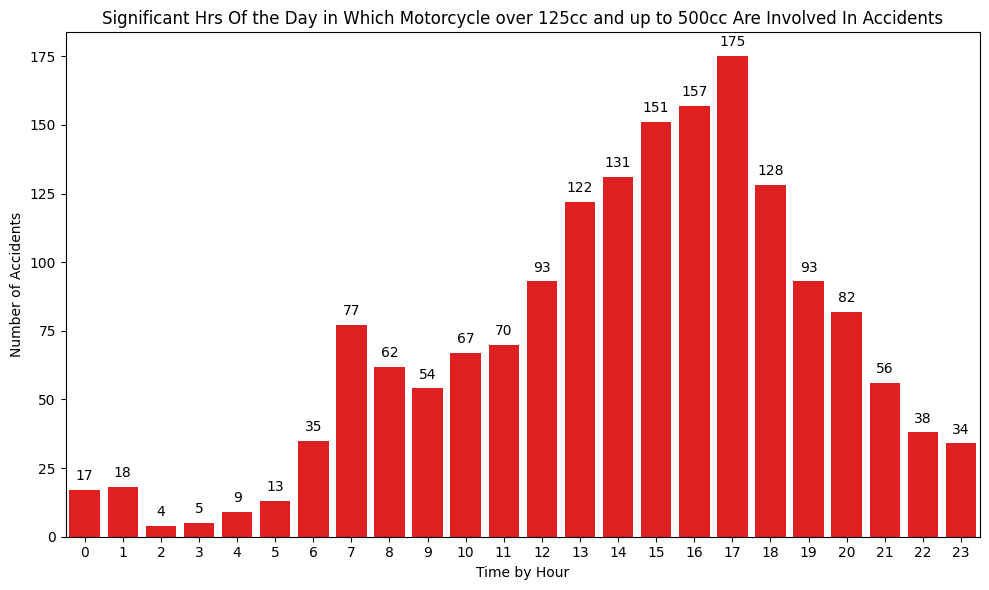

In [130]:
# Extract the hour from the timestamp
motorbike_overaccident['hour'] = motorbike_overaccident['time'].dt.hour

# Calculate the counts of pedestrian accidents for each hour
hourly_counts = motorbike_overaccident['hour'].value_counts().sort_index()

# Create a bar plot
plt.figure(figsize=(10,6))
over125 = sns.barplot(x=hourly_counts.index, y=hourly_counts.values, color='red')

# Add the count at the top of the bars
for synchronise, label in zip(over125.patches, hourly_counts.values):
    over125.annotate(str(label), (synchronise.get_x() + synchronise.get_width() / 2., synchronise.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

# Remove grid lines
ax.grid(False) 

# Label the plot
plt.title('Significant Hrs Of the Day in Which Motorcycle over 125cc and up to 500cc Are Involved In Accidents')
plt.xlabel('Time by Hour')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=0)
plt.tight_layout()
#display the plot
plt.show()


## Significant Day Of The Week in Which Motorcycle over 125cc and up to 500cc Are Involved In Accidents

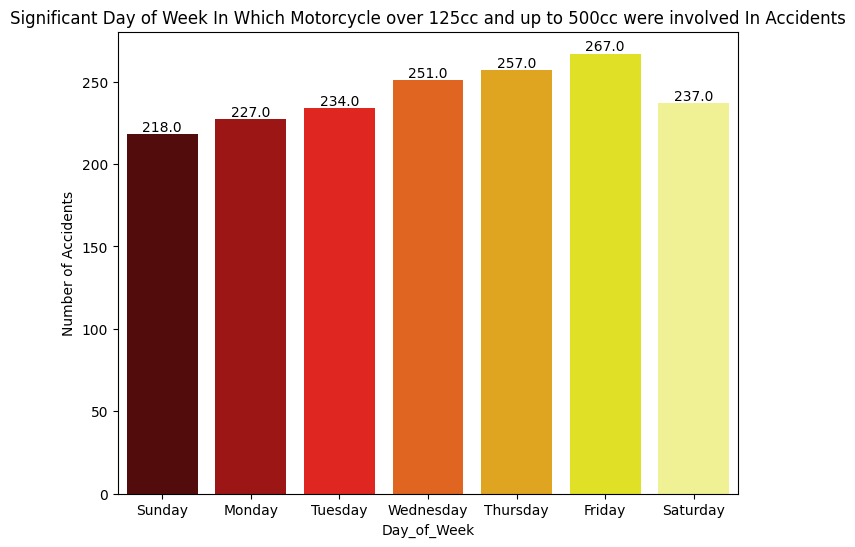

In [131]:
# Significant days in which accident occurs 
motorbike_overaccident_Amounts = motorbike_overaccident['day_of_week'].value_counts().sort_index()

# Visualize using seaborn
plt.figure(figsize=(8, 6))
sue = sns.countplot(x=motorbike_overaccident['day_of_week'], order=motorbike_overaccident_Amounts.index, palette='hot')

# Include the count at the top of each bar
for numbers in sue.patches:
    sue.annotate(f'{numbers.get_height()}', (numbers.get_x() +numbers.get_width() / 2., numbers.get_height()),ha='center', va='center', xytext=(0, 5), textcoords='offset points')
# Label the plot
plt.title('Significant Day of Week In Which Motorcycle over 125cc and up to 500cc were involved In Accidents')
plt.xlabel('Day_of_Week')
plt.ylabel('Number of Accidents')
plt.xticks(ticks=range(len(day_names)), labels=day_names, rotation=0)
#display the plot
plt.show()

##  Motorcycle over 500cc.

Recall, that according to the accident form, vehicle type codes 5 denotes Motorcycle over 500cc.

In [132]:
Motorcycle_over_500cc = vehicle_table[vehicle_table['vehicle_type']==5]
Motorcycle_over_500cc

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type,Age_Group
119,681835,2020010228283,2020,010228283,2,5,0,18,1,5,...,1.0,35,6,600,1,8,YAMAHA XJ6,2,1,31-35
334,682050,2020010228659,2020,010228659,2,5,0,18,5,1,...,1.0,48,8,1200,1,17,HARLEY-DAVIDSON MODEL MISSING,2,1,46-50
381,682097,2020010228738,2020,010228738,3,5,0,18,7,3,...,1.0,40,7,647,1,2,-1,6,1,36-40
402,682118,2020010228796,2020,010228796,2,5,5,15,1,5,...,1.0,31,6,865,1,15,TRIUMPH BONNEVILLE,4,1,26-30
450,682166,2020010228865,2020,010228865,2,5,0,18,1,5,...,1.0,18,4,847,1,3,YAMAHA MT09,1,1,16-20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
166742,848458,2020991003397,2020,991003397,1,5,0,13,8,3,...,1.0,30,6,599,1,19,-1,6,2,26-30
166754,848470,2020991003505,2020,991003505,1,5,0,17,8,4,...,1.0,53,8,649,1,3,KAWASAKI KLE650,7,1,51-55
166835,848551,2020991004857,2020,991004857,2,5,0,18,7,3,...,1.0,50,8,600,1,20,KAWASAKI MODEL MISSING,1,1,46-50
167128,848844,2020991009395,2020,991009395,1,5,0,18,8,4,...,1.0,48,8,649,1,18,-1,8,1,46-50


In [133]:
# Use the accident index column to merge the two dataframes (Motorcycle_over_500cc, accident_table)
motorbike_500cc_accident = pd.merge(Motorcycle_over_500cc, accident_table, on = 'accident_index')
motorbike_500cc_accident

,vehicle_index,accident_index,accident_year_x,accident_reference_x,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,hour,day_names
0,681835,2020010228283,2020,010228283,2,5,0,18,1,5,...,1,1,1,0,0,1,1,2,15,Friday
1,682050,2020010228659,2020,010228659,2,5,0,18,5,1,...,1,1,1,0,0,1,1,2,16,Monday
2,682097,2020010228738,2020,010228738,3,5,0,18,7,3,...,1,1,1,0,0,1,1,2,8,Tuesday
3,682118,2020010228796,2020,010228796,2,5,5,15,1,5,...,4,1,2,0,0,1,1,2,17,Tuesday
4,682166,2020010228865,2020,010228865,2,5,0,18,1,5,...,4,1,2,0,0,1,1,2,0,Wednesday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3779,848458,2020991003397,2020,991003397,1,5,0,13,8,3,...,6,1,1,0,0,2,1,-1,16,Wednesday
3780,848470,2020991003505,2020,991003505,1,5,0,17,8,4,...,1,8,2,0,0,2,1,-1,12,Friday
3781,848551,2020991004857,2020,991004857,2,5,0,18,7,3,...,4,2,2,0,0,1,1,-1,16,Tuesday
3782,848844,2020991009395,2020,991009395,1,5,0,18,8,4,...,1,1,2,0,0,1,2,-1,13,Wednesday


In [134]:
# Convert to date time format
motorbike_500cc_accident['time'] = pd.to_datetime(motorbike_500cc_accident['time'], format='%H:%M:%S')
motorbike_500cc_accident['time']

0      1900-01-01 15:24:00
1      1900-01-01 16:35:00
2      1900-01-01 08:34:00
3      1900-01-01 17:40:00
4      1900-01-01 00:50:00
               ...        
3779   1900-01-01 16:23:00
3780   1900-01-01 12:50:00
3781   1900-01-01 16:18:00
3782   1900-01-01 13:15:00
3783   1900-01-01 12:42:00
Name: time, Length: 3784, dtype: datetime64[ns]

In [135]:
# Check the most significant hour
motorbike_500cc_accident['hour'] = motorbike_500cc_accident['time'].dt.hour
motorbike_500cc_accident['hour']

0       15
1       16
2        8
3       17
4        0
        ..
3779    16
3780    12
3781    16
3782    13
3783    12
Name: hour, Length: 3784, dtype: int64

In [136]:
# Group the motorbike_500cc_accident by hour, count occurrences, and sort by count in descending order
motorbike_500cc_accident_hour = motorbike_500cc_accident['time'].dt.time.value_counts().sort_values(ascending=False)
print(motorbike_500cc_accident_hour)

17:30:00    43
17:00:00    35
14:00:00    34
16:00:00    31
15:00:00    31
            ..
04:51:00     1
07:27:00     1
19:43:00     1
21:28:00     1
12:19:00     1
Name: time, Length: 913, dtype: int64


In [137]:
# Group the motorbike_500cc_accident by hour, count occurrences, and sort by count in descending order
motorbike_500cc_accident_hour = motorbike_500cc_accident['hour'].value_counts().sort_values(ascending=False)

print(motorbike_500cc_accident_hour)

17    421
16    366
15    336
13    323
14    323
12    275
11    258
18    242
7     180
10    175
19    163
8     133
9     123
20    112
6      91
21     83
22     56
5      44
23     33
1      17
0      11
2       8
3       7
4       4
Name: hour, dtype: int64


## Visualise the significant hours of the day in which Motorcycle over 500cc are involved in accidents

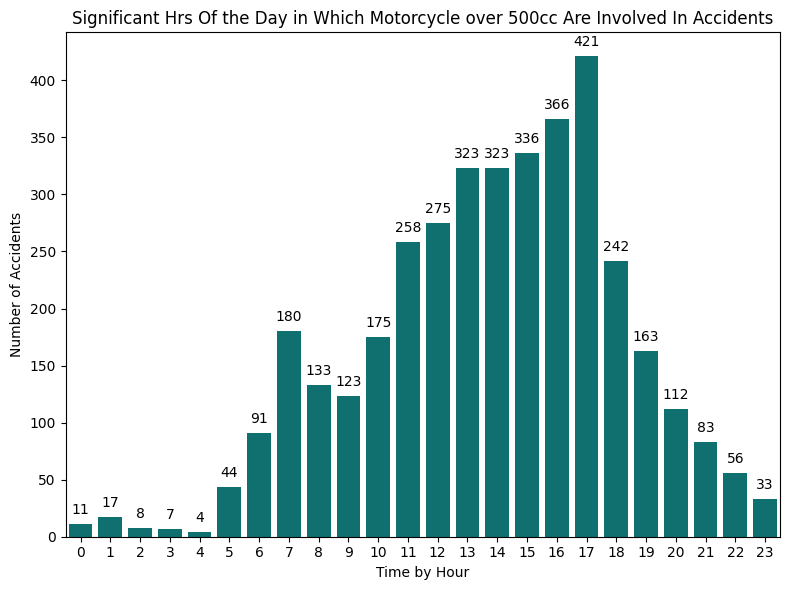

In [138]:
# Extract the hour from the timestamp
motorbike_500cc_accident['hour'] = motorbike_500cc_accident['time'].dt.hour

# Calculate the counts of pedestrian accidents for each hour
hourly_counts = motorbike_500cc_accident['hour'].value_counts().sort_index()

# Create a bar plot
plt.figure(figsize=(8,6))
over500 = sns.barplot(x=hourly_counts.index, y=hourly_counts.values, color='teal')

# Add the count at the top of the bars
for synchronisere, label in zip(over500.patches, hourly_counts.values):
    over500.annotate(str(label), (synchronisere.get_x() + synchronisere.get_width() / 2., synchronisere.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')
# Label the plot
plt.title('Significant Hrs Of the Day in Which Motorcycle over 500cc Are Involved In Accidents')
plt.xlabel('Time by Hour')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=0)
plt.tight_layout()
#display the plot
plt.show()

##  Significant Day Of The Week in Which Motorcycle over 500cc Are Involved In Accidents

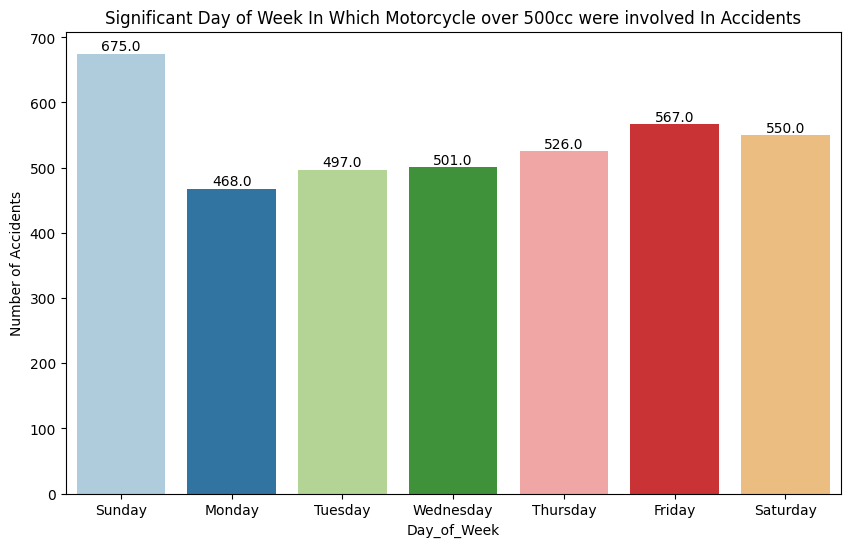

In [139]:
# Significant days in which accident occurs 
motorbike_500cc_accident_Amounts = motorbike_500cc_accident['day_of_week'].value_counts().sort_index()

# Visualize using seaborn
plt.figure(figsize=(10, 6))
sue = sns.countplot(x=motorbike_500cc_accident['day_of_week'], order=motorbike_500cc_accident_Amounts.index, palette='Paired')

# Add the count at the top of each bar
for numbering in sue.patches:
    sue.annotate(f'{numbering.get_height()}', (numbering.get_x() +numbering.get_width() / 2., numbering.get_height()),ha='center', va='center', xytext=(0, 5), textcoords='offset points')
# Label the plot
plt.title('Significant Day of Week In Which Motorcycle over 500cc were involved In Accidents')
plt.xlabel('Day_of_Week')
plt.ylabel('Number of Accidents')
plt.xticks(ticks=range(len(day_names)), labels=day_names, rotation=0)
# Show the plot
plt.show()

## 3. For pedestrians involved in accidents, are there significant hours of the day, and days of the week, on which they are more likely to be involved?

In [140]:
# We will first go through the casualty dataframe and filter pedestrians from the casualty class
# Recall,  that according to page 69 of the accident filling form, pedestrian are denoted with code "3" in the casualty class

ped_hours = casualty_table[casualty_table['casualty_class']==3]
ped_hours

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,484748,2020010219808,2020,010219808,1,1,3,1,31,6,3,9,5,0,0,0,0,1,4
1,484749,2020010220496,2020,010220496,1,1,3,2,2,1,3,1,1,0,0,0,0,1,2
2,484750,2020010220496,2020,010220496,1,2,3,2,4,1,3,1,1,0,0,0,0,1,2
3,484751,2020010228005,2020,010228005,1,1,3,1,23,5,3,5,9,0,0,0,0,1,3
4,484752,2020010228006,2020,010228006,1,1,3,1,47,8,2,4,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115573,600321,2020991023621,2020,991023621,1,2,3,2,54,8,2,8,1,0,0,0,0,1,4
115574,600322,2020991023880,2020,991023880,1,1,3,2,58,9,3,5,1,0,0,0,0,1,4
115578,600326,2020991024526,2020,991024526,1,1,3,1,69,10,3,6,9,0,0,0,0,3,7
115580,600328,2020991029573,2020,991029573,1,1,3,2,63,9,3,10,1,0,0,0,0,1,10


In [141]:
ped_hours.head(5)

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,484748,2020010219808,2020,010219808,1,1,3,1,31,6,3,9,5,0,0,0,0,1,4
1,484749,2020010220496,2020,010220496,1,1,3,2,2,1,3,1,1,0,0,0,0,1,2
2,484750,2020010220496,2020,010220496,1,2,3,2,4,1,3,1,1,0,0,0,0,1,2
3,484751,2020010228005,2020,010228005,1,1,3,1,23,5,3,5,9,0,0,0,0,1,3
4,484752,2020010228006,2020,010228006,1,1,3,1,47,8,2,4,1,0,0,0,0,1,3


We are going to merge the casualty table that is already filtered and the accident table so we can see where accident occur when casualty class is 3. Since accident index is a key in both tables, lets merge the two dataframe using accident index base on the common values in the accident_index column.

In [142]:
# Merge casualty table filtered  with the accident table
ped_accident = pd.merge(ped_hours, accident_table, on = 'accident_index')
ped_accident

,casualty_index,accident_index,accident_year_x,accident_reference_x,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,...,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,hour,day_names
0,484748,2020010219808,2020,010219808,1,1,3,1,31,6,...,1,9,9,0,0,1,3,2,9,Wednesday
1,484749,2020010220496,2020,010220496,1,1,3,2,2,1,...,1,1,1,0,0,1,1,2,13,Tuesday
2,484750,2020010220496,2020,010220496,1,2,3,2,4,1,...,1,1,1,0,0,1,1,2,13,Tuesday
3,484751,2020010228005,2020,010228005,1,1,3,1,23,5,...,4,1,2,0,0,1,1,2,1,Thursday
4,484752,2020010228006,2020,010228006,1,1,3,1,47,8,...,4,1,1,0,0,1,1,2,1,Thursday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14745,600321,2020991023621,2020,991023621,1,2,3,2,54,8,...,1,9,2,0,0,1,2,-1,10,Wednesday
14746,600322,2020991023880,2020,991023880,1,1,3,2,58,9,...,4,1,2,0,0,1,2,-1,17,Tuesday
14747,600326,2020991024526,2020,991024526,1,1,3,1,69,10,...,1,2,2,0,7,2,2,-1,12,Wednesday
14748,600328,2020991029573,2020,991029573,1,1,3,2,63,9,...,1,1,1,0,0,1,2,-1,15,Saturday


In [143]:
ped_accident.head()

,casualty_index,accident_index,accident_year_x,accident_reference_x,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,...,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,hour,day_names
0,484748,2020010219808,2020,010219808,1,1,3,1,31,6,...,1,9,9,0,0,1,3,2,9,Wednesday
1,484749,2020010220496,2020,010220496,1,1,3,2,2,1,...,1,1,1,0,0,1,1,2,13,Tuesday
2,484750,2020010220496,2020,010220496,1,2,3,2,4,1,...,1,1,1,0,0,1,1,2,13,Tuesday
3,484751,2020010228005,2020,010228005,1,1,3,1,23,5,...,4,1,2,0,0,1,1,2,1,Thursday
4,484752,2020010228006,2020,010228006,1,1,3,1,47,8,...,4,1,1,0,0,1,1,2,1,Thursday


In [144]:
# Convert to date time format
ped_accident['time'] = pd.to_datetime(ped_accident['time'], format='%H:%M:%S')
ped_accident['time']

0       1900-01-01 09:00:00
1       1900-01-01 13:55:00
2       1900-01-01 13:55:00
3       1900-01-01 01:25:00
4       1900-01-01 01:50:00
                ...        
14745   1900-01-01 10:30:00
14746   1900-01-01 17:00:00
14747   1900-01-01 12:00:00
14748   1900-01-01 15:05:00
14749   1900-01-01 13:50:00
Name: time, Length: 14750, dtype: datetime64[ns]

In [145]:
# check the most significant hour
ped_accident['hour'] = ped_accident['time'].dt.hour
ped_accident['hour']

0         9
1        13
2        13
3         1
4         1
         ..
14745    10
14746    17
14747    12
14748    15
14749    13
Name: hour, Length: 14750, dtype: int64

In [146]:
# Convert the hour in which pedestrian accidents occur to datetime
ped_accident['hour'] = pd.to_datetime(ped_accident['time'], format='%H:%M').dt.time
ped_accident['hour']

0        09:00:00
1        13:55:00
2        13:55:00
3        01:25:00
4        01:50:00
           ...   
14745    10:30:00
14746    17:00:00
14747    12:00:00
14748    15:05:00
14749    13:50:00
Name: hour, Length: 14750, dtype: object

In [147]:
# Group the accident dataframe by hour, count occurrences, and sort by count in descending order
hour = ped_accident['time'].dt.time.value_counts().sort_values(ascending=False)

# Display
print(hour)

15:30:00    188
15:00:00    164
16:00:00    153
18:00:00    152
17:00:00    150
           ... 
21:56:00      1
23:01:00      1
09:28:00      1
02:41:00      1
06:09:00      1
Name: time, Length: 1264, dtype: int64


## Visualise the significant hours of the day in which pedestrians are involved in accidents

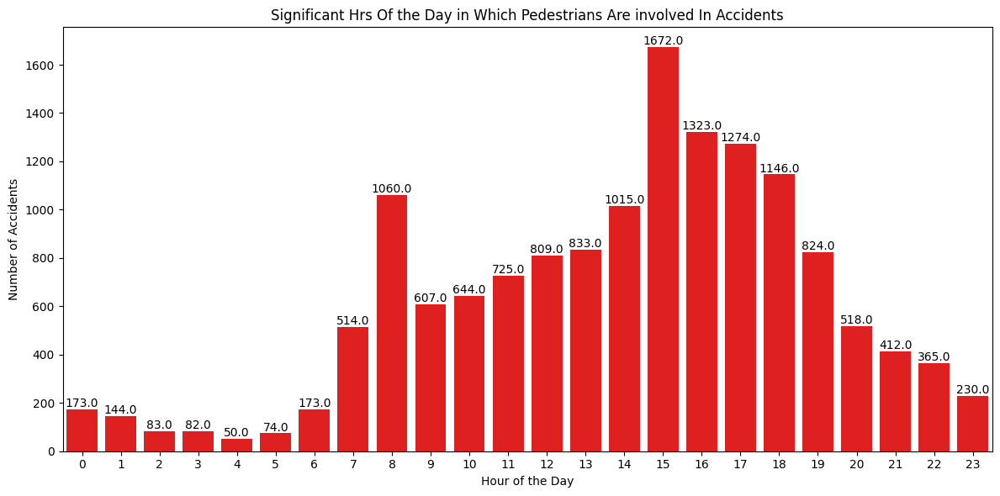

In [148]:
# Extract the hour from the timestamp
ped_accident['hour'] = ped_accident['time'].dt.hour

# Calculate the counts of pedestrian accidents for each hour
hourly_counts = ped_accident['hour'].value_counts().sort_index()

#Create a bar plot
plt.figure(figsize=(12,6))
sue= sns.barplot(x=hourly_counts.index, y=hourly_counts.values, color='red')

# Add the count at the top of each bar
for numbering in sue.patches:
    sue.annotate(f'{numbering.get_height()}', (numbering.get_x() +numbering.get_width() / 2., numbering.get_height()),ha='center', va='center', xytext=(0, 5), textcoords='offset points')
# Label the plot
plt.title('Significant Hrs Of the Day in Which Pedestrians Are involved In Accidents')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.xticks(rotation=0)
plt.tight_layout()
# Show the plot
plt.show()

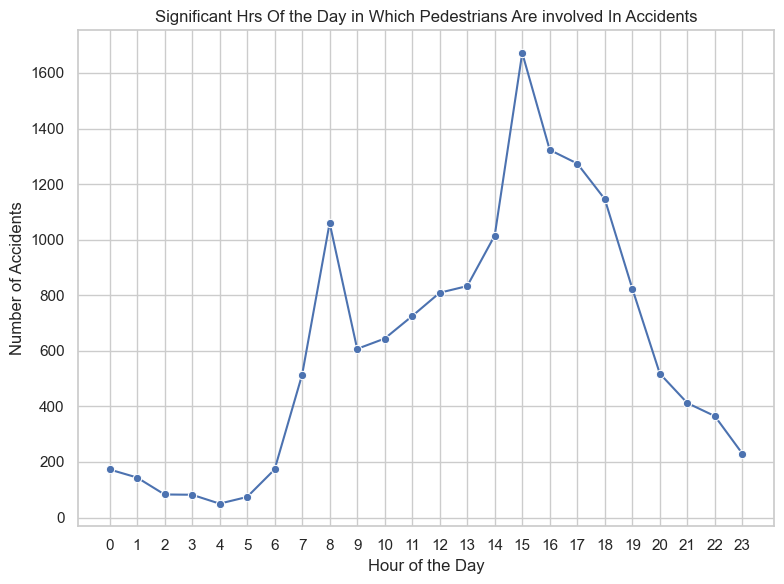

In [149]:
# Determine the style of seaborn to ensure well interpreted visualization
sns.set(style="whitegrid")

# Use seaborn (line plot) to visualise a line plot
plt.figure(figsize=(8, 6))
sns.lineplot(data=ped_accident['hour'].value_counts().sort_index(), marker='o') # add marker for easy interpretation

# Label the plot
plt.title('Significant Hrs Of the Day in Which Pedestrians Are involved In Accidents')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Accidents')
plt.xticks(range(0, 24))
plt.tight_layout()

# Show the plot
plt.show() 

## Significant Days Of the Week in Which Pedestrians Are involved In Accidents



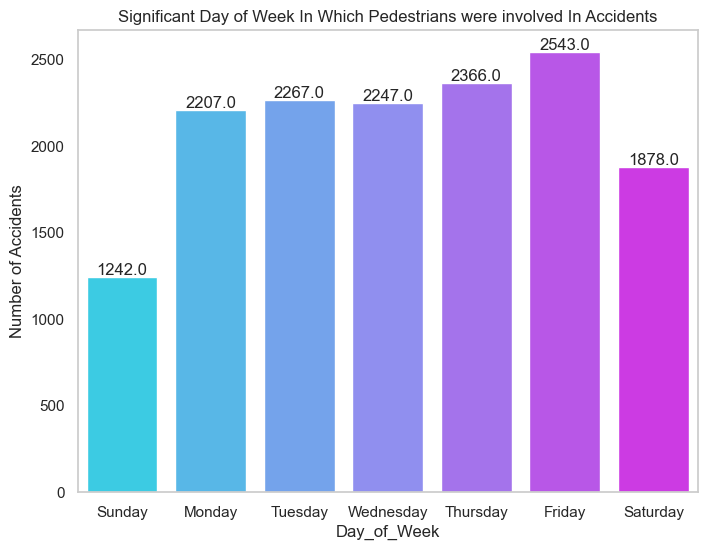

In [150]:
# Significant  days of the week pedestrians are involved in accident 
ped_Amounts = ped_accident['day_of_week'].value_counts().sort_index()

# Visualize using seaborn
plt.figure(figsize=(8, 6))
sue = sns.countplot(x=ped_accident['day_of_week'], order=ped_Amounts.index, palette='cool')

# Add the count at the top of each bar
for numbers in sue.patches:
    sue.annotate(f'{numbers.get_height()}', (numbers.get_x() +numbers.get_width() / 2., numbers.get_height()),ha='center', va='center', xytext=(0, 5), textcoords='offset points')
#label the plot
plt.title('Significant Day of Week In Which Pedestrians were involved In Accidents')
plt.xlabel('Day_of_Week')
plt.ylabel('Number of Accidents')
plt.xticks(ticks=range(len(day_names)), labels=day_names, rotation=0)
plt.grid(False)
# Show the plot
plt.show()

# Examination of the number of casualities determined by speed limit

In [151]:
accident_table.groupby('speed_limit')['number_of_casualties'].mean()

speed_limit
20    1.124743
30    1.216674
40    1.363544
50    1.439714
60    1.427332
70    1.483465
Name: number_of_casualties, dtype: float64

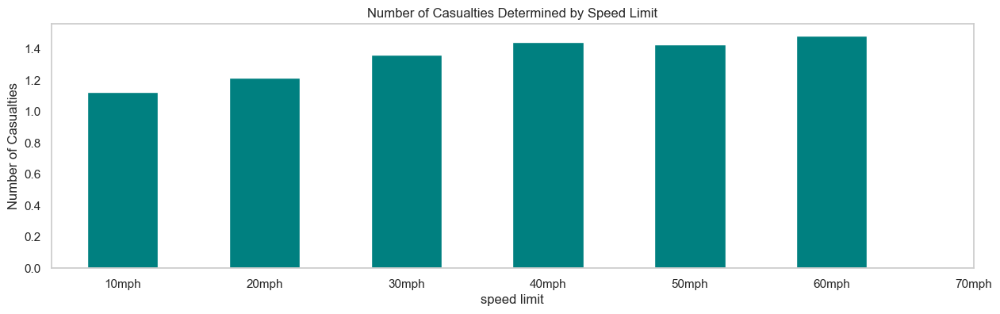

In [152]:
accident_table.groupby('speed_limit')['number_of_casualties'].mean().plot(kind='bar', color='teal', 
                                                              figsize=(15,4), grid=False)
plt.xticks(np.arange(7), 
           ['10mph', '20mph', '30mph', '40mph', '50mph', '60mph', '70mph'], 
           rotation='horizontal')

plt.xlabel('speed limit'),
plt.ylabel('Number of Casualties')
plt.title('Number of Casualties Determined by Speed Limit')
plt.show()

## Examination of the Purpose of the Driver when the accidents Occur

In [153]:
vehicle_table['journey_purpose_of_driver'].unique()

array([6, 2, 1, 3, 4, 5], dtype=int64)

In [154]:
# Count the occurrences of each journey purpose of driver
journey_occur = vehicle_table['journey_purpose_of_driver'].value_counts()
journey_occur

6    99335
5    26104
1    22408
2    17309
3     1625
4      594
Name: journey_purpose_of_driver, dtype: int64

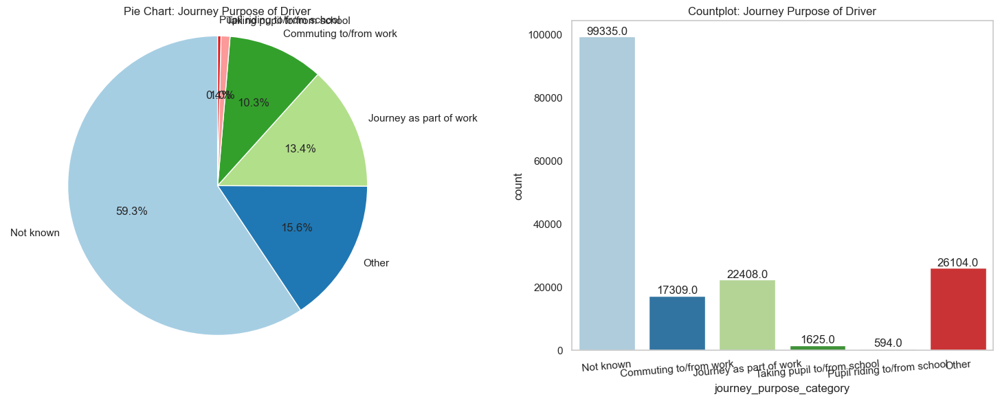

In [155]:
journey_purpose_mapping = {
    1: 'Journey as part of work',
    2: 'Commuting to/from work',
    3: 'Taking pupil to/from school',
    4: 'Pupil riding to/from school',
    5: 'Other',
    6: 'Not known'
}

# Replace numeric values with categories using the mapping
vehicle_table['journey_purpose_category'] = vehicle_table['journey_purpose_of_driver'].map(journey_purpose_mapping)

#Create a subplot with two plots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Create a pie chart
journey_occur = vehicle_table['journey_purpose_category'].value_counts()
ax1.pie(journey_occur, labels=journey_occur.index, autopct='%1.1f%%', startangle=90,
        colors=plt.cm.Paired.colors)
ax1.axis('equal')
ax1.set_title('Pie Chart: Journey Purpose of Driver')

# Create a countplot with counts at the top of the bars
sns.countplot(data=vehicle_table, x='journey_purpose_category', ax=ax2, palette='Paired')
ax2.set_title('Countplot: Journey Purpose of Driver')

#display counts at the top of the bars
for p in ax2.patches:
    ax2.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.xticks(rotation=5)  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.grid(False)
#show the plot
plt.show()

## Reasons for Accident

Based on the given information of the stats form,the greatest cause of accident is 18 which is going ahead of other.

Recall, that it was filled as following 
"Reversing": 1, "Parked": 2, "Waiting to go ahead but held up": 3, "Slowing or stopping": 4, "Moving off": 5, "U turn": 6, "Turning left": 7, "Waiting to turn left" :8, "Turning right": 9, " Waiting to turn right": 10, "Changing lane to left" :11, "Changing lane to right": 12, "O’taking moving veh on its offside": 13, "O’taking stationary veh on its offside": 14, "Overtaking on nearside" :15, "Going ahead left hand bend":16, "Going ahead right hand bend": 17, "Going ahead other": 18

In [156]:
vehicle_table["vehicle_manoeuvre"].unique()

array([ 5,  4, 18,  3,  2, 99, 11,  1, 17,  9, 14, 13,  7, 15,  6, 16, 10,
        8, 12, -1], dtype=int64)

In [157]:
vehicle_table["vehicle_manoeuvre"].value_counts()

 18    78191
 9     14799
 99    12845
 4      9040
 5      7467
 2      7422
 3      6872
 7      5568
 17     5459
 16     4740
 13     3097
 10     2194
 1      2091
 14     1409
 12     1262
 6      1199
 11     1165
 15     1140
 8       736
-1       679
Name: vehicle_manoeuvre, dtype: int64

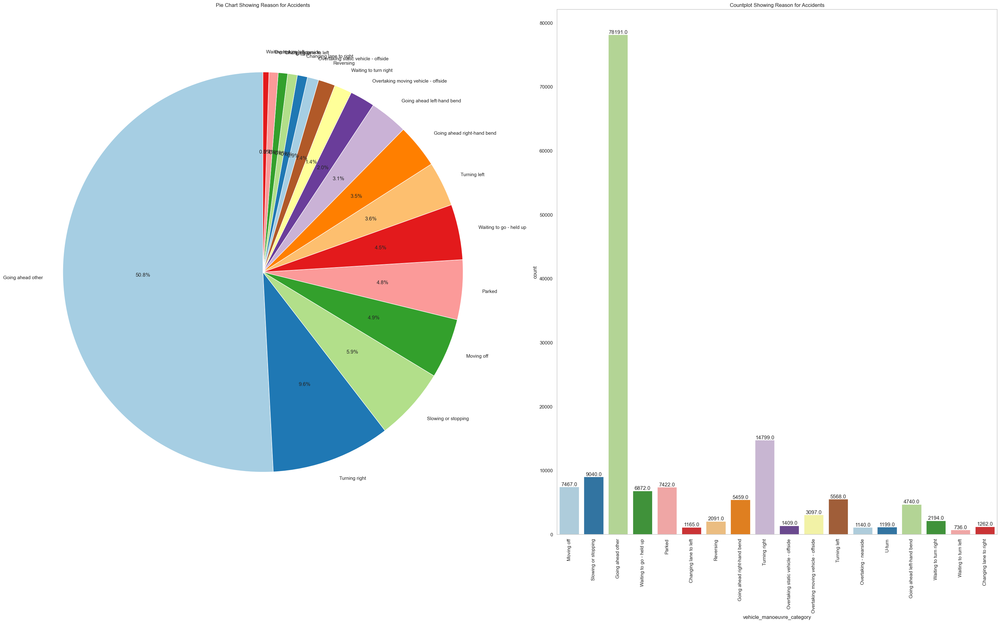

In [158]:
# Mapping of numeric values to categories for vehicle manoeuvres
vehicle_manoeuvre_mapping = {
    1: 'Reversing',
    2: 'Parked',
    3: 'Waiting to go - held up',
    4: 'Slowing or stopping',
    5: 'Moving off',
    6: 'U-turn',
    7: 'Turning left',
    8: 'Waiting to turn left',
    9: 'Turning right',
    10: 'Waiting to turn right',
    11: 'Changing lane to left',
    12: 'Changing lane to right',
    13: 'Overtaking moving vehicle - offside',
    14: 'Overtaking static vehicle - offside',
    15: 'Overtaking - nearside',
    16: 'Going ahead left-hand bend',
    17: 'Going ahead right-hand bend',
    18: 'Going ahead other',
    19: 'Changing lane other',
    20: 'Data missing or out of range',
    21: 'Reversing of Overtaking',
}

# Replace numeric values with categories using the mapping
vehicle_table['vehicle_manoeuvre_category'] = vehicle_table['vehicle_manoeuvre'].map(vehicle_manoeuvre_mapping)

# Create a subplot with two plots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(32, 20))

# Piechart
manoeuvre_occur = vehicle_table['vehicle_manoeuvre_category'].value_counts()
ax1.pie(manoeuvre_occur, labels=manoeuvre_occur.index, autopct='%1.1f%%', startangle=90,
        colors=plt.cm.Paired.colors)
ax1.axis('equal')
ax1.set_title('Pie Chart Showing Reason for Accidents')

#  Countplot using seaborn 
sns.countplot(data=vehicle_table, x='vehicle_manoeuvre_category', ax=ax2, palette='Paired')
ax2.set_title('Countplot Showing Reason for Accidents')

# Show the counts at the top of each bar
for p in ax2.patches:
    ax2.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.xticks(rotation=90)  #rotate x-axis labels for better readability
plt.tight_layout()
plt.grid(False)
#show the plot
plt.show()


In [159]:
vehicle_table['vehicle_manoeuvre_category'].value_counts()

Going ahead other                      78191
Turning right                          14799
Slowing or stopping                     9040
Moving off                              7467
Parked                                  7422
Waiting to go - held up                 6872
Turning left                            5568
Going ahead right-hand bend             5459
Going ahead left-hand bend              4740
Overtaking moving vehicle - offside     3097
Waiting to turn right                   2194
Reversing                               2091
Overtaking static vehicle - offside     1409
Changing lane to right                  1262
U-turn                                  1199
Changing lane to left                   1165
Overtaking - nearside                   1140
Waiting to turn left                     736
Name: vehicle_manoeuvre_category, dtype: int64

## Weather conditions

In [160]:
accident_table['weather_conditions'].value_counts()

1    70729
2    11583
8     2629
9     2424
5     1665
4     1401
7      510
3      185
6       73
Name: weather_conditions, dtype: int64

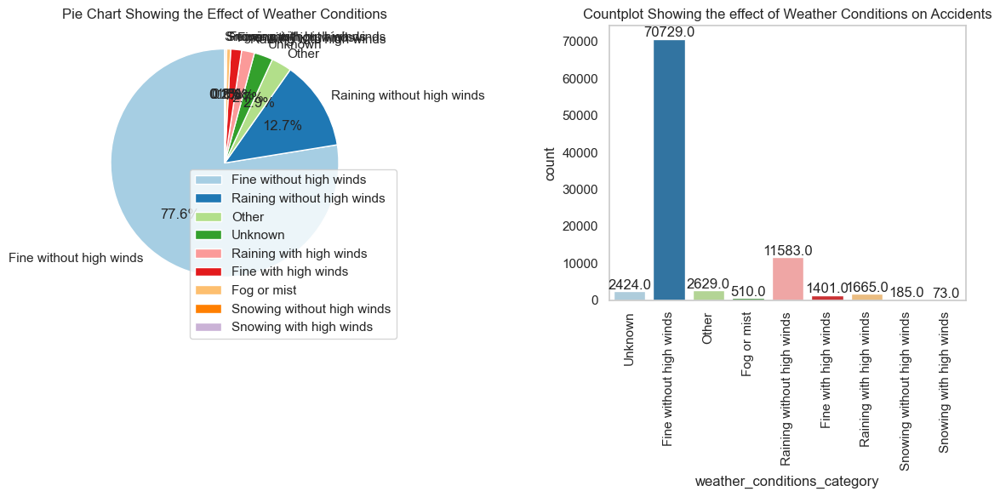

In [161]:
# Mapping of numeric values
weather_conditions_mapping = {
    1: 'Fine without high winds',
    2: 'Raining without high winds',
    3: 'Snowing without high winds',
    4: 'Fine with high winds',
    5: 'Raining with high winds',
    6: 'Snowing with high winds',
    7: 'Fog or mist',
    8: 'Other',
    9: 'Unknown'
}

# Replace numeric values with categories using the mapping
accident_table['weather_conditions_category'] = accident_table['weather_conditions'].map(weather_conditions_mapping)

# Create a subplot with two plots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

# Create a pie chart
weather_occur = accident_table['weather_conditions_category'].value_counts()
ax1.pie(weather_occur, labels=weather_occur.index, autopct='%1.1f%%', startangle=90,
        colors=plt.cm.Paired.colors)
ax1.axis('equal')
ax1.set_title('Pie Chart Showing the Effect of Weather Conditions')
ax1.legend(loc='upper right', bbox_to_anchor=(1, .5))

# Create a countplot with counts at the top of the bars
sns.countplot(data=accident_table, x='weather_conditions_category', ax=ax2, palette='Paired')
ax2.set_title('Countplot Showing the effect of Weather Conditions on Accidents')

# Display counts at the top of the bars
for p in ax2.patches:
    ax2.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.xticks(rotation=90)  #rotate x-axis labels for better readability
plt.tight_layout()
plt.grid(False)
#show the plot
plt.show()


## Road Type

CODES 1. Roundabout 2. One way street 3. Dual carriageway 6. Single carriageway 7. Slip Road 9. Unknown

Code 9 'Unknown' should only be used in exceptional circumstances where no information on road type is available, or where the other Road Type codes are inappropriate. J. If 1.15 (Speed Limit) is coded 70, 1.14 must not be coded 2 or 6. 22

In [162]:
accident_table["road_type"].unique() 

array([6, 2, 3, 7, 1, 9], dtype=int64)

In [163]:
#check where speed limit is coded 70 and road type column is coded 2 or 6.22
accident_table[(accident_table["speed_limit"] == 70) & ((accident_table["road_type"] == 2) | (accident_table["road_type"] == 6))]

,accident_index,accident_year,accident_reference,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,hour,day_names,weather_conditions_category


In [164]:
accident_table["road_type"].value_counts() 

6    66929
3    13206
1     5580
9     2006
2     1966
7     1512
Name: road_type, dtype: int64

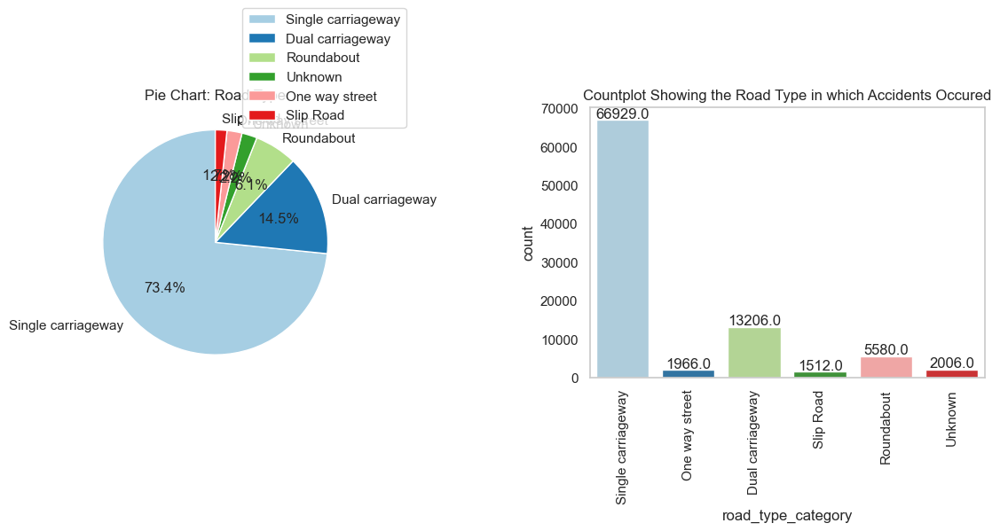

In [165]:
road_type_mapping = {
    1: 'Roundabout',
    2: 'One way street',
    3: 'Dual carriageway',
    6: 'Single carriageway',
    7: 'Slip Road',
    9: 'Unknown'
}

# Use mapping to replace numeric values with categories
accident_table['road_type_category'] = accident_table['road_type'].map(road_type_mapping)

# Create a subplot with two plots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
# Plot 1: pie chart
road_type_occur = accident_table['road_type_category'].value_counts()
ax1.pie(road_type_occur, labels=road_type_occur.index, autopct='%1.1f%%', startangle=90,
        colors=plt.cm.Paired.colors)
ax1.axis('equal')
ax1.set_title('Pie Chart: Road Type')
ax1.legend(loc='lower right', bbox_to_anchor=(1, 0.9))  # Adjust the legend position

# Plot 2:countplot
sns.countplot(data=accident_table, x='road_type_category', ax=ax2, palette='Paired')
ax2.set_title('Countplot Showing the Road Type in which Accidents Occured')

# Display the counts at the top of each bars
for p in ax2.patches:
    ax2.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.xticks(rotation=90)
plt.tight_layout()
plt.grid(False)
#display the plot
plt.show()


## Road Surface Condition

This refers to the road surface condition at the time of the accident. CODES

1. Frost/Ice

2. Snow

3. Dry

4. Flood (surface water over 3cm deep

5. Wet/Damp

In [166]:
 accident_table["road_surface_conditions"].unique() 

array([ 9,  1,  2,  5,  4,  3, -1], dtype=int64)

In [167]:
accident_table["road_surface_conditions"].value_counts() 

 1    62698
 2    26240
 9      847
 4      764
-1      316
 5      184
 3      150
Name: road_surface_conditions, dtype: int64

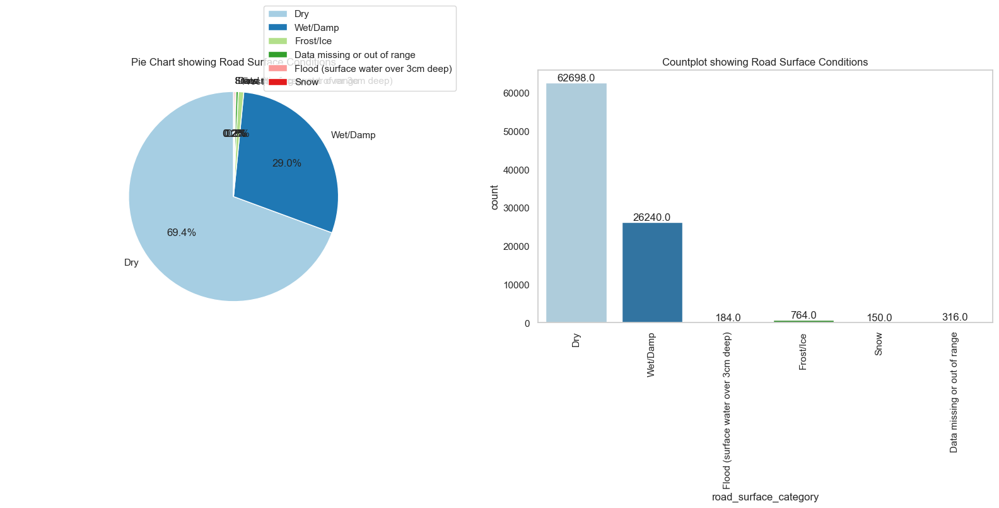

In [168]:
road_surface_mapping = {
    1: 'Dry',
    2: 'Wet/Damp',
    3: 'Snow',
    4: 'Frost/Ice',
    5: 'Flood (surface water over 3cm deep)',
    -1: 'Data missing or out of range'
}

# Use mapping to replace numeric values with categories
accident_table['road_surface_category'] = accident_table['road_surface_conditions'].map(road_surface_mapping)

# Create a subplot with two plots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

# Plot 1:pie chart
road_surface_occur = accident_table['road_surface_category'].value_counts()

ax1.pie(road_surface_occur, labels=road_surface_occur.index, autopct='%1.1f%%', startangle=90, colors=plt.cm.Paired.colors)
ax1.axis('equal')
ax1.set_title('Pie Chart showing Road Surface Conditions')
# Adjust the position of the legend
ax1.legend(loc='lower right', bbox_to_anchor=(1, 0.9))

# Plot 2:countplot
sns.countplot(data=accident_table, x='road_surface_category', ax=ax2, palette='Paired')
ax2.set_title('Countplot showing Road Surface Conditions')

# Display the counts at the top of the bars
for p in ax2.patches:
    ax2.annotate(f'{p.get_height()}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

plt.xticks(rotation=90)  
plt.tight_layout()
plt.grid(False)
#show the plot
plt.show()


## 4. Using the apriori algorithm, explore the impact of selected variables on accident severity

 We are going to merge some of the tables that has columns which can impact accident severity.



In [169]:
# Merge accident and vehicle table
merge_table = pd.merge(accident_table, vehicle_table, on='accident_index')

In [170]:
merge_table

,accident_index,accident_year_x,accident_reference_x,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type,Age_Group,journey_purpose_category,vehicle_manoeuvre_category
0,2020010219808,2020,010219808,-0.254001,51.462262,1,Fatal,1,1,2020-02-04,...,6,1968,2,6,AUDI Q5,4,1,31-35,Not known,Moving off
1,2020010220496,2020,010220496,-0.139253,51.470327,1,Fatal,1,2,2020-04-27,...,7,1395,1,2,AUDI A1,7,1,41-45,Commuting to/from work,Slowing or stopping
2,2020010228005,2020,010228005,-0.178719,51.529614,1,Fatal,1,1,2020-01-01,...,-1,-1,-1,5,-1,-1,-1,31-35,Not known,Going ahead other
3,2020010228006,2020,010228006,-0.001683,51.541210,1,Not Fatal,1,1,2020-01-01,...,7,1798,8,8,TOYOTA PRIUS,2,1,41-45,Journey as part of work,Going ahead other
4,2020010228011,2020,010228011,-0.137592,51.515704,1,Fatal,1,2,2020-01-01,...,4,2993,2,4,BMW 4 SERIES,-1,-1,16-20,Not known,Going ahead other
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167370,2020991030297,2020,991030297,-2.271903,57.186317,99,Not Fatal,2,1,2020-04-15,...,9,1968,2,2,AUDI A5,7,1,55-60,Journey as part of work,Turning left
167371,2020991030297,2020,991030297,-2.271903,57.186317,99,Not Fatal,2,1,2020-04-15,...,7,1301,1,2,KTM 1290 SUPERDUKE,9,2,36-40,Other,Going ahead left-hand bend
167372,2020991030900,2020,991030900,-3.968753,55.950940,99,Fatal,2,1,2020-12-15,...,10,1995,2,1,BMW X3,5,1,Over 60,Not known,Turning left
167373,2020991030900,2020,991030900,-3.968753,55.950940,99,Fatal,2,1,2020-12-15,...,11,-1,-1,5,-1,9,1,Over 60,Not known,Going ahead other


In [171]:
# lets merge the merged accident and vehicle dataframe with casualty DataFrame
merged_table = pd.merge(merge_table, casualty_table, on='accident_index')

In [172]:
merged_table

,accident_index,accident_year_x,accident_reference_x,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,date,...,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,2020010219808,2020,010219808,-0.254001,51.462262,1,Fatal,1,1,2020-02-04,...,6,3,9,5,0,0,0,0,1,4
1,2020010220496,2020,010220496,-0.139253,51.470327,1,Fatal,1,2,2020-04-27,...,1,3,1,1,0,0,0,0,1,2
2,2020010220496,2020,010220496,-0.139253,51.470327,1,Fatal,1,2,2020-04-27,...,1,3,1,1,0,0,0,0,1,2
3,2020010228005,2020,010228005,-0.178719,51.529614,1,Fatal,1,1,2020-01-01,...,5,3,5,9,0,0,0,0,1,3
4,2020010228006,2020,010228006,-0.001683,51.541210,1,Not Fatal,1,1,2020-01-01,...,8,2,4,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220430,2020991030297,2020,991030297,-2.271903,57.186317,99,Not Fatal,2,1,2020-04-15,...,7,2,0,0,0,0,0,5,2,9
220431,2020991030297,2020,991030297,-2.271903,57.186317,99,Not Fatal,2,1,2020-04-15,...,7,2,0,0,0,0,0,5,2,9
220432,2020991030900,2020,991030900,-3.968753,55.950940,99,Fatal,2,1,2020-12-15,...,11,3,0,0,0,0,0,1,1,9
220433,2020991030900,2020,991030900,-3.968753,55.950940,99,Fatal,2,1,2020-12-15,...,11,3,0,0,0,0,0,1,1,9


In [173]:
merged_table.describe()

,accident_year_x,longitude,latitude,police_force,number_of_vehicles,number_of_casualties,day_of_week,local_authority_district,first_road_class,road_type,...,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
count,220435.0,220435.000000,220435.000000,220435.000000,220435.000000,220435.000000,220435.000000,220435.000000,220435.000000,220435.000000,...,220435.000000,220435.000000,220435.000000,220435.000000,220435.000000,220435.000000,220435.000000,220435.000000,220435.000000,220435.000000
mean,2020.0,-1.204227,52.364891,27.989779,2.191127,1.739583,4.122884,317.840515,4.093116,5.209599,...,6.343834,2.816418,0.406079,0.331390,0.235657,0.031265,0.007277,7.877914,1.078903,4.387389
std,0.0,1.367757,1.319483,24.182384,0.919870,1.330668,1.944851,249.561589,1.462728,1.665439,...,2.343499,0.416149,1.623870,1.481179,0.609665,0.345653,0.124528,9.835718,0.900809,3.172119
min,2020.0,-7.497375,49.970479,1.000000,1.000000,1.000000,1.000000,-1.000000,1.000000,1.000000,...,-1.000000,1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.000000,-1.000000,-1.000000
25%,2020.0,-2.120397,51.457792,5.000000,2.000000,1.000000,2.000000,79.000000,3.000000,6.000000,...,5.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,1.000000,2.000000
50%,2020.0,-1.095489,51.851200,23.000000,2.000000,1.000000,4.000000,302.000000,3.000000,6.000000,...,6.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,1.000000,4.000000
75%,2020.0,-0.127165,53.330744,45.000000,2.000000,2.000000,6.000000,505.000000,6.000000,6.000000,...,8.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,1.000000,7.000000
max,2020.0,1.756257,60.541144,99.000000,13.000000,41.000000,7.000000,941.000000,6.000000,9.000000,...,11.000000,3.000000,10.000000,9.000000,9.000000,9.000000,2.000000,98.000000,3.000000,10.000000


In [174]:
# Let's drop the columns that will not impact accident severity such as longitude and latitude
new_tables_merged =merged_table.drop(columns=['longitude', 'latitude', 'police_force'])
new_tables_merged

,accident_index,accident_year_x,accident_reference_x,accident_severity,number_of_vehicles,number_of_casualties,date,day_of_week,time,local_authority_district,...,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,2020010219808,2020,010219808,Fatal,1,1,2020-02-04,3,09:00:00,10,...,6,3,9,5,0,0,0,0,1,4
1,2020010220496,2020,010220496,Fatal,1,2,2020-04-27,2,13:55:00,9,...,1,3,1,1,0,0,0,0,1,2
2,2020010220496,2020,010220496,Fatal,1,2,2020-04-27,2,13:55:00,9,...,1,3,1,1,0,0,0,0,1,2
3,2020010228005,2020,010228005,Fatal,1,1,2020-01-01,4,01:25:00,1,...,5,3,5,9,0,0,0,0,1,3
4,2020010228006,2020,010228006,Not Fatal,1,1,2020-01-01,4,01:50:00,17,...,8,2,4,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220430,2020991030297,2020,991030297,Not Fatal,2,1,2020-04-15,4,12:42:00,910,...,7,2,0,0,0,0,0,5,2,9
220431,2020991030297,2020,991030297,Not Fatal,2,1,2020-04-15,4,12:42:00,910,...,7,2,0,0,0,0,0,5,2,9
220432,2020991030900,2020,991030900,Fatal,2,1,2020-12-15,3,14:00:00,932,...,11,3,0,0,0,0,0,1,1,9
220433,2020991030900,2020,991030900,Fatal,2,1,2020-12-15,3,14:00:00,932,...,11,3,0,0,0,0,0,1,1,9


## Transformation of Data using One Hot Encoding

We are goint to use one hot encoding to alter the categorical column to a new set of binary columns. Each new column, represents a selected variable and each row indicates an accident. This binary matrix, marks it has '1' if the variable is applicable to an accident otherwise, it is marked as '0'.

In [175]:
accident_severity = pd.get_dummies(accident_table.accident_severity, prefix = 'severity')
accident_severity

,severity_Fatal,severity_Not Fatal,severity_Severe
0,1,0,0
1,1,0,0
2,1,0,0
3,0,1,0
4,1,0,0
...,...,...,...
91194,0,1,0
91195,1,0,0
91196,0,1,0
91197,1,0,0


In [176]:
accident_severity.head(5)

,severity_Fatal,severity_Not Fatal,severity_Severe
0,1,0,0
1,1,0,0
2,1,0,0
3,0,1,0
4,1,0,0


In [177]:
accident_severity.shape

(91199, 3)

## 1. Speed Limit

In [178]:
accident_speed_limit = pd.get_dummies(accident_table.speed_limit, prefix = 'speed_limit')
accident_speed_limit

,speed_limit_20,speed_limit_30,speed_limit_40,speed_limit_50,speed_limit_60,speed_limit_70
0,1,0,0,0,0,0
1,1,0,0,0,0,0
2,0,1,0,0,0,0
3,0,1,0,0,0,0
4,0,1,0,0,0,0
...,...,...,...,...,...,...
91194,0,1,0,0,0,0
91195,0,1,0,0,0,0
91196,0,0,0,0,1,0
91197,0,1,0,0,0,0


## 2. Road Type

In [179]:
accident_road_type = pd.get_dummies(accident_table.road_type, prefix = 'accident_road_type')
accident_road_type

,accident_road_type_1,accident_road_type_2,accident_road_type_3,accident_road_type_6,accident_road_type_7,accident_road_type_9
0,0,0,0,1,0,0
1,0,0,0,1,0,0
2,0,0,0,1,0,0
3,0,0,0,1,0,0
4,0,0,0,1,0,0
...,...,...,...,...,...,...
91194,0,0,0,1,0,0
91195,0,0,0,0,0,1
91196,0,0,0,1,0,0
91197,0,0,0,1,0,0


## 3. Junction Details

In [180]:

accident_junction_details = pd.get_dummies(accident_table.junction_detail, prefix = 'junction_detail')
accident_junction_details

,junction_detail_-1,junction_detail_0,junction_detail_1,junction_detail_2,junction_detail_3,junction_detail_5,junction_detail_6,junction_detail_7,junction_detail_8,junction_detail_9,junction_detail_99
0,0,1,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,1,0
2,0,0,0,0,1,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
91194,0,0,1,0,0,0,0,0,0,0,0
91195,0,0,0,0,1,0,0,0,0,0,0
91196,0,0,0,0,0,0,0,0,1,0,0
91197,0,0,0,0,1,0,0,0,0,0,0


## 4. Light Conditions

In [181]:
accident_light_conditions = pd.get_dummies(accident_table.light_conditions, prefix = 'light_conditions')
accident_light_conditions

,light_conditions_-1,light_conditions_1,light_conditions_4,light_conditions_5,light_conditions_6,light_conditions_7
0,0,1,0,0,0,0
1,0,1,0,0,0,0
2,0,0,1,0,0,0
3,0,0,1,0,0,0
4,0,0,1,0,0,0
...,...,...,...,...,...,...
91194,0,1,0,0,0,0
91195,0,1,0,0,0,0
91196,0,1,0,0,0,0
91197,0,1,0,0,0,0


## 5.Road Surface Conditions

In [182]:
accident_road_surface = pd.get_dummies(accident_table.road_surface_conditions, prefix = 'road_surface_conditions')
accident_road_surface

,road_surface_conditions_-1,road_surface_conditions_1,road_surface_conditions_2,road_surface_conditions_3,road_surface_conditions_4,road_surface_conditions_5,road_surface_conditions_9
0,0,0,0,0,0,0,1
1,0,1,0,0,0,0,0
2,0,0,1,0,0,0,0
3,0,1,0,0,0,0,0
4,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...
91194,0,1,0,0,0,0,0
91195,0,1,0,0,0,0,0
91196,0,1,0,0,0,0,0
91197,0,1,0,0,0,0,0


## 6.  Weather Conditions

In [183]:

accident_weather = pd.get_dummies(accident_table.weather_conditions, prefix = 'weather')
accident_weather

,weather_1,weather_2,weather_3,weather_4,weather_5,weather_6,weather_7,weather_8,weather_9
0,0,0,0,0,0,0,0,0,1
1,1,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
91194,1,0,0,0,0,0,0,0,0
91195,1,0,0,0,0,0,0,0,0
91196,1,0,0,0,0,0,0,0,0
91197,1,0,0,0,0,0,0,0,0


## 7. Pedestrian Crossing Physical Facilities

In [184]:
accident_ped_physical = pd.get_dummies(accident_table.pedestrian_crossing_physical_facilities, prefix = 'pedestrian_crossing_physical_facilities')
accident_ped_physical

,pedestrian_crossing_physical_facilities_-1,pedestrian_crossing_physical_facilities_0,pedestrian_crossing_physical_facilities_1,pedestrian_crossing_physical_facilities_4,pedestrian_crossing_physical_facilities_5,pedestrian_crossing_physical_facilities_7,pedestrian_crossing_physical_facilities_8,pedestrian_crossing_physical_facilities_9
0,0,0,0,0,0,0,0,1
1,0,0,0,1,0,0,0,0
2,0,1,0,0,0,0,0,0
3,0,0,0,1,0,0,0,0
4,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...
91194,0,1,0,0,0,0,0,0
91195,0,1,0,0,0,0,0,0
91196,0,1,0,0,0,0,0,0
91197,0,1,0,0,0,0,0,0


## 8. Pedestrian Crossing human control

In [185]:

accident_ped_human = pd.get_dummies(accident_table.pedestrian_crossing_human_control, prefix = 'pedestrian_crossing_human_control')
accident_ped_human

,pedestrian_crossing_human_control_-1,pedestrian_crossing_human_control_0,pedestrian_crossing_human_control_1,pedestrian_crossing_human_control_2,pedestrian_crossing_human_control_9
0,0,0,0,0,1
1,0,1,0,0,0
2,0,1,0,0,0
3,0,1,0,0,0
4,0,1,0,0,0
...,...,...,...,...,...
91194,0,1,0,0,0
91195,0,1,0,0,0
91196,0,1,0,0,0
91197,0,1,0,0,0


## 9. Urban or rural area

In [186]:
accident_urban_rural = pd.get_dummies(accident_table.urban_or_rural_area, prefix = 'urban_or_rural_area')
accident_urban_rural

,urban_or_rural_area_1,urban_or_rural_area_2,urban_or_rural_area_3
0,1,0,0
1,1,0,0
2,1,0,0
3,1,0,0
4,1,0,0
...,...,...,...
91194,1,0,0
91195,1,0,0
91196,0,1,0
91197,1,0,0


## CONCATENATING THE DATAFRAMES

In [187]:
accident_encoding = pd.concat([accident_severity, accident_speed_limit,accident_road_type,accident_junction_details,accident_light_conditions,accident_road_surface,accident_weather, accident_ped_physical, accident_ped_human, accident_urban_rural], axis=1)
accident_encoding

,severity_Fatal,severity_Not Fatal,severity_Severe,speed_limit_20,speed_limit_30,speed_limit_40,speed_limit_50,speed_limit_60,speed_limit_70,accident_road_type_1,...,pedestrian_crossing_physical_facilities_8,pedestrian_crossing_physical_facilities_9,pedestrian_crossing_human_control_-1,pedestrian_crossing_human_control_0,pedestrian_crossing_human_control_1,pedestrian_crossing_human_control_2,pedestrian_crossing_human_control_9,urban_or_rural_area_1,urban_or_rural_area_2,urban_or_rural_area_3
0,1,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,1,1,0,0
1,1,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
2,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
3,0,1,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
4,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,0,1,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
91195,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
91196,0,1,0,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,1,0
91197,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0


## Setting Parameters and Aplying Apriori

In [188]:
!pip install mlxtend


Defaulting to user installation because normal site-packages is not writeable


In [189]:
from mlxtend.frequent_patterns import apriori


data_apriori = apriori(accident_encoding, min_support = 0.2, use_colnames = True)
data_apriori

C:\Users\749458\AppData\Roaming\Python\Python311\site-packages\mlxtend\frequent_patterns\fpcommon.py:109: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,support,itemsets
0,0.783484,(severity_Fatal)
1,0.201263,(severity_Not Fatal)
2,0.573164,(speed_limit_30)
3,0.733879,(accident_road_type_6)
4,0.416430,(junction_detail_0)
...,...,...
523,0.210222,"(urban_or_rural_area_1, pedestrian_crossing_hu..."
524,0.239454,"(urban_or_rural_area_1, pedestrian_crossing_hu..."
525,0.234696,"(urban_or_rural_area_1, pedestrian_crossing_hu..."
526,0.201406,"(urban_or_rural_area_1, pedestrian_crossing_hu..."


## Assciation Rules 

In [190]:

from mlxtend.frequent_patterns import association_rules

apriori = association_rules(data_apriori, metric='lift', min_threshold=0.5)
apriori

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(severity_Fatal),(speed_limit_30),0.783484,0.573164,0.460082,0.587225,1.024532,0.011017,1.034065,0.110592
1,(speed_limit_30),(severity_Fatal),0.573164,0.783484,0.460082,0.802705,1.024532,0.011017,1.097421,0.056098
2,(accident_road_type_6),(severity_Fatal),0.733879,0.783484,0.564831,0.769651,0.982344,-0.010152,0.939947,-0.063265
3,(severity_Fatal),(accident_road_type_6),0.783484,0.733879,0.564831,0.720921,0.982344,-0.010152,0.953571,-0.076648
4,(junction_detail_0),(severity_Fatal),0.416430,0.783484,0.311999,0.749223,0.956271,-0.014267,0.863380,-0.072667
...,...,...,...,...,...,...,...,...,...,...
10033,(pedestrian_crossing_physical_facilities_0),"(pedestrian_crossing_human_control_0, weather_...",0.759537,0.280321,0.227031,0.298907,1.066303,0.014117,1.026510,0.258585
10034,(severity_Fatal),"(pedestrian_crossing_human_control_0, weather_...",0.783484,0.298863,0.227031,0.289771,0.969578,-0.007123,0.987198,-0.126574
10035,(light_conditions_1),"(pedestrian_crossing_human_control_0, weather_...",0.706784,0.283391,0.227031,0.321217,1.133475,0.026735,1.055726,0.401606
10036,(accident_road_type_6),"(pedestrian_crossing_human_control_0, weather_...",0.733879,0.296100,0.227031,0.309358,1.044775,0.009730,1.019197,0.161041


In [191]:
apriori.sample(100)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
2367,"(accident_road_type_6, light_conditions_1, ped...",(road_surface_conditions_1),0.505543,0.687486,0.384588,0.760742,1.106557,0.037034,1.306180,0.194750
3519,"(weather_1, severity_Fatal, speed_limit_30)","(light_conditions_1, pedestrian_crossing_human...",0.359763,0.669207,0.259202,0.720482,1.076620,0.018447,1.183439,0.111158
7392,"(urban_or_rural_area_1, pedestrian_crossing_hu...","(weather_1, light_conditions_1, severity_Fatal)",0.462110,0.453810,0.219037,0.473994,1.044477,0.009327,1.038372,0.079167
8423,"(urban_or_rural_area_1, pedestrian_crossing_hu...",(severity_Fatal),0.324620,0.783484,0.263084,0.810437,1.034401,0.008749,1.142185,0.049242
6636,"(pedestrian_crossing_physical_facilities_0, ur...","(weather_1, pedestrian_crossing_human_control_0)",0.318490,0.741061,0.263490,0.827308,1.116384,0.027469,1.499432,0.152971
...,...,...,...,...,...,...,...,...,...,...
6916,"(urban_or_rural_area_1, road_surface_condition...","(weather_1, accident_road_type_6, severity_Fat...",0.482067,0.289323,0.210090,0.435811,1.506312,0.070617,1.259643,0.648977
6581,"(urban_or_rural_area_1, pedestrian_crossing_hu...","(weather_1, road_surface_conditions_1, light_c...",0.626224,0.504600,0.324620,0.518376,1.027302,0.008627,1.028605,0.071103
8761,"(accident_road_type_6, urban_or_rural_area_1, ...","(weather_1, road_surface_conditions_1, light_c...",0.391627,0.504600,0.205090,0.523687,1.037826,0.007475,1.040072,0.059910
5836,"(light_conditions_1, pedestrian_crossing_human...","(pedestrian_crossing_physical_facilities_0, ur...",0.669207,0.336254,0.237042,0.354213,1.053411,0.012019,1.027811,0.153278


Lift is a metric used in association rule mining to assess the potency and importance of a rule. Lift tells us how much more likely it is that the consequent (the item or set of items on the right side of the rule) will occur when the antecedent (the item or set of items on the left side of the rule) is present., compared to the likelihood of the consequent occuring independently of the antecedent.

In [192]:
apriori.head(80)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(severity_Fatal),(speed_limit_30),0.783484,0.573164,0.460082,0.587225,1.024532,0.011017,1.034065,0.110592
1,(speed_limit_30),(severity_Fatal),0.573164,0.783484,0.460082,0.802705,1.024532,0.011017,1.097421,0.056098
2,(accident_road_type_6),(severity_Fatal),0.733879,0.783484,0.564831,0.769651,0.982344,-0.010152,0.939947,-0.063265
3,(severity_Fatal),(accident_road_type_6),0.783484,0.733879,0.564831,0.720921,0.982344,-0.010152,0.953571,-0.076648
4,(junction_detail_0),(severity_Fatal),0.416430,0.783484,0.311999,0.749223,0.956271,-0.014267,0.863380,-0.072667
...,...,...,...,...,...,...,...,...,...,...
75,(junction_detail_3),(pedestrian_crossing_physical_facilities_0),0.280990,0.759537,0.205276,0.730547,0.961832,-0.008146,0.892413,-0.052303
76,(pedestrian_crossing_human_control_0),(junction_detail_3),0.946918,0.280990,0.265727,0.280623,0.998692,-0.000348,0.999489,-0.024071
77,(junction_detail_3),(pedestrian_crossing_human_control_0),0.280990,0.946918,0.265727,0.945680,0.998692,-0.000348,0.977207,-0.001818
78,(urban_or_rural_area_1),(junction_detail_3),0.676948,0.280990,0.222963,0.329365,1.172159,0.032747,1.072133,0.454644


In [193]:
apriori_2 = association_rules(data_apriori, metric="support", min_threshold=0.5)
apriori_2

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(accident_road_type_6),(severity_Fatal),0.733879,0.783484,0.564831,0.769651,0.982344,-0.010152,0.939947,-0.063265
1,(severity_Fatal),(accident_road_type_6),0.783484,0.733879,0.564831,0.720921,0.982344,-0.010152,0.953571,-0.076648
2,(light_conditions_1),(severity_Fatal),0.706784,0.783484,0.559337,0.791384,1.010082,0.005583,1.037864,0.034041
3,(severity_Fatal),(light_conditions_1),0.783484,0.706784,0.559337,0.713910,1.010082,0.005583,1.024907,0.046100
4,(road_surface_conditions_1),(severity_Fatal),0.687486,0.783484,0.538328,0.783039,0.999432,-0.000306,0.997948,-0.001816
...,...,...,...,...,...,...,...,...,...,...
147,"(pedestrian_crossing_physical_facilities_0, pe...",(weather_1),0.754252,0.775546,0.591136,0.783738,1.010563,0.006179,1.037882,0.042535
148,"(weather_1, pedestrian_crossing_human_control_0)",(pedestrian_crossing_physical_facilities_0),0.741061,0.759537,0.591136,0.797689,1.050231,0.028273,1.188581,0.184708
149,(pedestrian_crossing_physical_facilities_0),"(weather_1, pedestrian_crossing_human_control_0)",0.759537,0.741061,0.591136,0.778285,1.050231,0.028273,1.167891,0.198900
150,(weather_1),"(pedestrian_crossing_physical_facilities_0, pe...",0.775546,0.754252,0.591136,0.762219,1.010563,0.006179,1.033508,0.046571


Support:

This metric helps to indicate the frequency with which the antecedents and consequent of the association rules appears simultanously. The higher the support level, the stronger the association between the selected variables.

In [194]:
apriori_3 = association_rules(data_apriori, metric="confidence", min_threshold=0.5)
apriori_3

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(severity_Fatal),(speed_limit_30),0.783484,0.573164,0.460082,0.587225,1.024532,0.011017,1.034065,0.110592
1,(speed_limit_30),(severity_Fatal),0.573164,0.783484,0.460082,0.802705,1.024532,0.011017,1.097421,0.056098
2,(accident_road_type_6),(severity_Fatal),0.733879,0.783484,0.564831,0.769651,0.982344,-0.010152,0.939947,-0.063265
3,(severity_Fatal),(accident_road_type_6),0.783484,0.733879,0.564831,0.720921,0.982344,-0.010152,0.953571,-0.076648
4,(junction_detail_0),(severity_Fatal),0.416430,0.783484,0.311999,0.749223,0.956271,-0.014267,0.863380,-0.072667
...,...,...,...,...,...,...,...,...,...,...
6162,"(pedestrian_crossing_physical_facilities_0, ac...","(weather_1, light_conditions_1, severity_Fatal...",0.399094,0.430696,0.227031,0.568866,1.320807,0.055143,1.320480,0.404202
6163,"(accident_road_type_6, light_conditions_1, sev...","(weather_1, road_surface_conditions_1, pedestr...",0.408338,0.488492,0.227031,0.555988,1.138172,0.027561,1.152014,0.205182
6164,"(light_conditions_1, road_surface_conditions_1...","(weather_1, accident_road_type_6, pedestrian_c...",0.420827,0.455312,0.227031,0.539488,1.184875,0.035423,1.182787,0.269400
6165,"(accident_road_type_6, road_surface_conditions...","(weather_1, light_conditions_1, pedestrian_cro...",0.391539,0.443448,0.227031,0.579842,1.307577,0.053404,1.324626,0.386593


Confidence:

To measure how often the rule was found to be true. The higher the confidence, the likehood for the antecedants to occur when the consequents occur

​

## 5. Identify accidents in our region: Kingston upon Hull, Humberside, and the East Riding of Yorkshire etc. You can do this by filtering on LSOA, or police region or another method if you can find one. Run clustering on this data. What do these clusters reveal about the distribution of accidents in our region?

First , we are going to filter the dataframe to seperate the longitude and latitude.

For Humberside Region:

In [195]:
# Filtering the longitude and latitude columns from the dataset
filtered_titude = accident_table[accident_table['police_force'] ==16][['longitude', 'latitude']]
filtered_titude

,longitude,latitude
37750,-0.331047,53.747751
37751,-0.393424,53.744936
37752,-0.528743,53.512895
37753,-0.324858,53.791630
37754,-0.095008,53.574501
...,...,...
39454,-0.651104,53.566753
39455,-0.424674,53.839482
39456,-0.308880,53.782750
39457,-0.703181,53.569801


In [196]:
# Check the statistical summary
filtered_titude.describe()

,longitude,latitude
count,1709.000000,1709.000000
mean,-0.381991,53.719078
std,0.219710,0.135850
min,-1.055770,53.456614
25%,-0.477732,53.583015
50%,-0.358555,53.743329
75%,-0.250808,53.773967
max,0.123813,54.143923


In [197]:
# Let's save the longitude and latitude to a csv file
filtered_titude.to_csv('filtered.csv', index=False)

## Visualization of Humberside Region

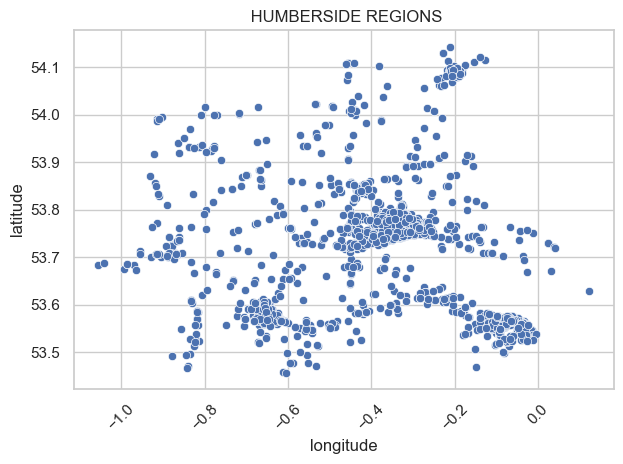

In [198]:
# Let's use scatterplot to visualize 
sns.scatterplot(data=filtered_titude, x='longitude', y ='latitude')
# Label the plot
plt.title(' HUMBERSIDE REGIONS')
plt.xlabel('longitude')
plt.ylabel('latitude')
plt.xticks(rotation=45)
plt.tight_layout()

# Display the plot
plt.show()

## Elbow Diagram


### Determinationa of appropriate number of cluster for K-Means Cluster using elbow method.

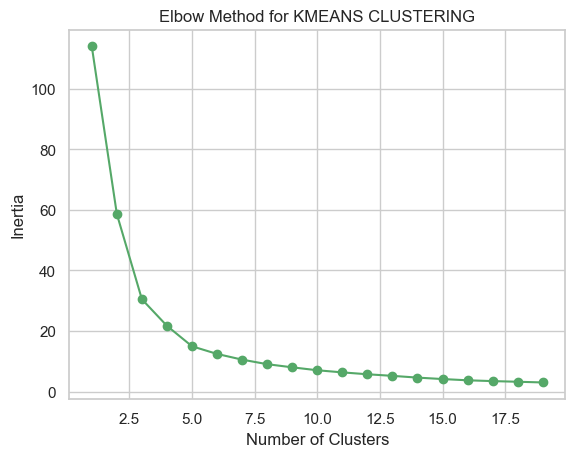

In [199]:
# Let's create an empty list to append KMeans
elbow = []
# Create a range of integers from 1 up to 20(does not include 20) and assign it to a new variable.
cluster = range(1,20)
# Iterate through each value in the cluster(variable) range.
for method in cluster:
    kmeans = KMeans(n_clusters=method, n_init=20)
    kmeans.fit(filtered_titude)
    elbow.append(kmeans.inertia_)

# Show the relationship between the number of clusters and the inertia values    
plt.plot(cluster, elbow, 'go-')
# Label the plot
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method for KMEANS CLUSTERING')
# Display the plot
plt.show()

From the above diagram, 5 is the appropriate number of clusters because it is the point at which inertia start decreasing.

In [200]:
# Apply K-Means clustering with specified number of clusters and visualize the clusters
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans_labels = kmeans.fit_predict(filtered_titude)
centroids = kmeans.cluster_centers_

C:\Program Files\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


### Scatterplot to show Kmeans Clustering for the Humberside Region

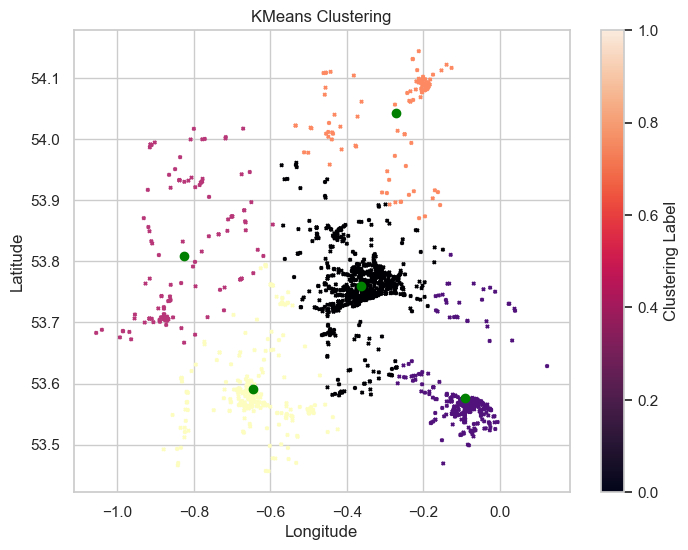

In [201]:
# Create a scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(x=filtered_titude['longitude'], y=filtered_titude['latitude'], c=kmeans_labels, cmap='magma', s=5, marker='x')

# Plot centroids
plt.scatter(centroids[:, 0], centroids[:, 1], color='green')

# Label the plot
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('KMeans Clustering')
colorbar = plt.colorbar()
colorbar.set_label('Clustering Label')

# Display the plot
plt.show()

C:\Program Files\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\local_749458\Temp\ipykernel_29460\352430466.py:12: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(filtered_titude['longitude'], filtered_titude['latitude'], cmap='coolwarm')


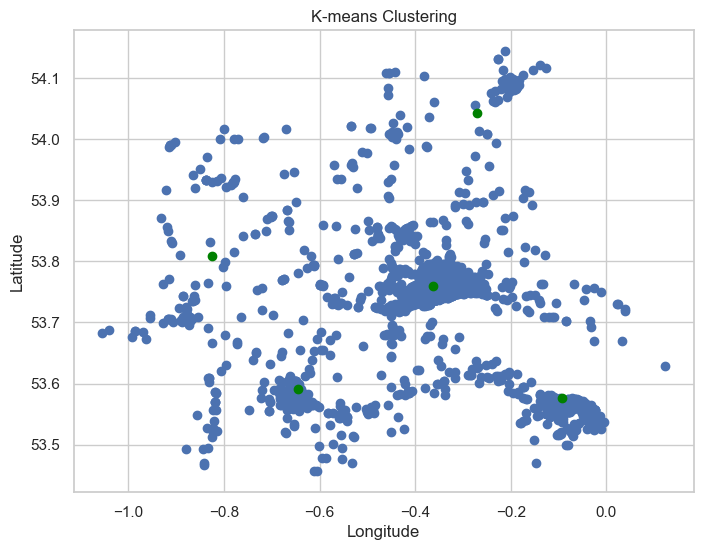

In [202]:
# Apply k-means clustering with specified number of clusters and visualise the clusters
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans.fit_predict(filtered_titude)

# Get centroid for the clusters
centroids = kmeans.cluster_centers_

# Increase the plot size
plt.figure(figsize=(8, 6))

# Plot the clusters
plt.scatter(filtered_titude['longitude'], filtered_titude['latitude'], cmap='coolwarm')
plt.scatter(centroids[:, 0], centroids[:, 1], color='green')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('K-means Clustering')

plt.show()

## KMeans Inertia

In [203]:
kmeans.inertia_

14.96488973762229

## Exploring different numbers of cluster to monitor Inertia value

## Cluster = 3

In [204]:
# Apply k-means clustering with specified number of clusters and visualize the clusters
kmeans_2= KMeans(n_clusters=3,random_state=42)
kmeans_2.fit_predict(filtered_titude)
kmeans_2.inertia_

C:\Program Files\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


30.490936651408155

## Cluster = 7

In [205]:
# Apply k-means clustering with specified number of clusters and visualize the clusters
kmeans_3= KMeans(n_clusters=7,random_state=42)
kmeans_3.fit_predict(filtered_titude)
kmeans_3.inertia_

C:\Program Files\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


10.554456739627417

## Cluster = 14

In [206]:
# Apply k-means clustering with specified number of clusters and visualize the clusters
kmeans_4= KMeans(n_clusters=14,random_state=42)
kmeans_4.fit_predict(filtered_titude)
kmeans_4.inertia_

C:\Program Files\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


4.691447627474633

## KMEANS CLUSTERING OF ACCIDENT DISTRIBUTION IN HUMBERSIDE REGION ON A MAP OF GREAT BRITAIN

In [207]:
print(len(kmeans_labels))
print(len(filtered_titude))

1709
1709


In [208]:
kmeans = KMeans(n_clusters=5, random_state=42)
cluster_labels = kmeans.fit_predict(filtered_titude[['latitude', 'longitude']])


C:\Program Files\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [209]:
unique_clusters = list(set(cluster_labels))

In [210]:
clustered_data = []
for cluster_idx in unique_clusters:
    cluster_data = filtered_titude[cluster_labels == cluster_idx][['latitude', 'longitude']].values.tolist()
    clustered_data.append(cluster_data)


In [211]:
!pip install folium


Defaulting to user installation because normal site-packages is not writeable


In [212]:
import folium

map_center = [filtered_titude['latitude'].mean(), filtered_titude['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=9)

# Define colors for each cluster label
cluster_colors = ['blue', 'green', 'red', 'purple', 'orange']

for cluster_idx, cluster_data in enumerate(clustered_data):
    for lat, lon in cluster_data:
        folium.CircleMarker(
            location=[lat, lon],
            radius=3,
            color='cluster_colors[cluster_idx]',  # Color based on cluster label
            fill=True,
            fill_color='cluster_colors[cluster_idx]',
            fill_opacity=0.4,
            popup=f'Cluster: {cluster_idx}',
            marker='o'  # Use 'o' marker
        ).add_to(m)
m

In [213]:
# Using KMeans clustering
kmeans = KMeans(n_clusters=5, random_state=42)
filtered_titude['cluster'] = kmeans.fit_predict(filtered_titude[['latitude', 'longitude']])
centroids = kmeans.cluster_centers_

# Convert cluster labels and coordinates to lists
cluster_labels = filtered_titude['cluster'].tolist()
latitude_list = filtered_titude['latitude'].tolist()
longitude_list = filtered_titude['longitude'].tolist()

# Create a Folium map instance
map_center = [filtered_titude['latitude'].mean(), filtered_titude['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=9)

# Define markers for different clusters
cluster_markers = ['blue', 'orange', 'green', 'purple', 'pink']

# Add cluster points to the map
for lat, lon, label in zip(latitude_list, longitude_list, cluster_labels):
    folium.CircleMarker(
        location=[lat, lon],
        radius=2,
        color=cluster_markers[label],  # Color based on cluster label
        fill=True,
        fill_color=cluster_markers[label],
        fill_opacity=0.4,
    ).add_to(m)

# Add cluster centers to the map
for centroid, marker_color in zip(centroids, cluster_markers):
    folium.Marker(
        location=[centroid[0], centroid[1]],
        icon=folium.Icon(color=marker_color, icon='info-sign')
    ).add_to(m)

# Show the map
m


C:\Program Files\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


## DBSCAN


In [214]:
dbscan = DBSCAN(eps = 0.2, min_samples=5)
dbscan_labels = dbscan.fit_predict(filtered_titude)

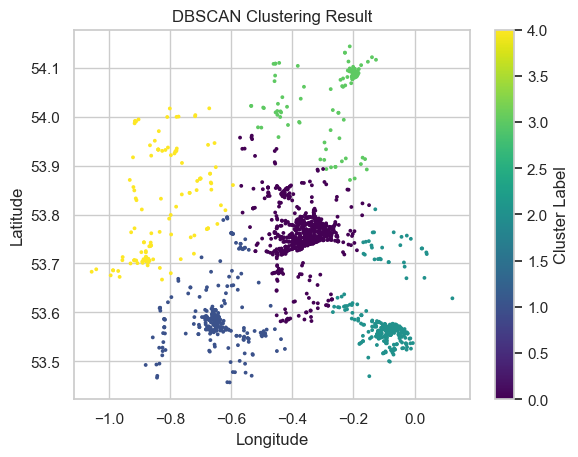

In [215]:
# Plot the DBSCAN clustering
plt.scatter(filtered_titude['longitude'],y=filtered_titude['latitude'],c=dbscan_labels,cmap='viridis',s=3)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('DBSCAN Clustering Result')
#  Show the plot
plt.colorbar(label='Cluster Label')
plt.show()

## Examination of Accident Trends

In [216]:
time_acc_table = accident_table.time

time_acc_table

0        09:00:00
1        13:55:00
2        01:25:00
3        01:50:00
4        02:25:00
           ...   
91194    14:30:00
91195    15:05:00
91196    12:42:00
91197    14:00:00
91198    13:50:00
Name: time, Length: 91199, dtype: object

In [217]:
# Let's extract the hour from the 'time' column
accident_table['hour'] = accident_table['time'].apply(lambda x: x.hour)

# Calculate the counts of accidents for each hour
hourly_acc_counts = accident_table['hour'].value_counts().sort_index(ascending=False)

# Display the accident counts by hour in descending order
print(hourly_acc_counts)

23    1796
22    2555
21    3106
20    3715
19    5048
18    6618
17    7813
16    7381
15    7361
14    6245
13    5741
12    5395
11    4812
10    4173
9     3917
8     5267
7     3736
6     1830
5      855
4      508
3      566
2      658
1      915
0     1188
Name: hour, dtype: int64


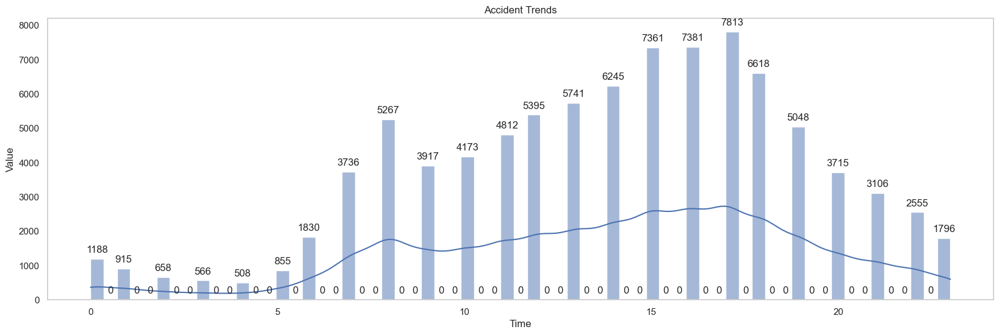

In [218]:
# Visualize using seaborn
plt.figure(figsize=(20, 6))
# sns.histplot(data=accident_table['hour'],kde=True)

# Create a histogram plot using Seaborn
ax = sns.histplot(data=accident_table['hour'], kde=True)

for p in ax.patches:
    ax.annotate(f"{int(p.get_height())}", (p.get_x() + p.get_width() / 2., p.get_height()),ha='center', va='bottom', xytext=(0, 5), textcoords='offset points')
# label the plots
plt.xlabel("Time")
plt.ylabel("Value")
plt.title("Accident Trends")
plt.grid(False)
# Show the plot
plt.show()

## 6.   Using outlier detection methods, identify unusual entries in your data set. Should you keep these entries in your data?

### Multiples of IQR (Interquartile Range)



### Vehicle table

### Age of Driver

In [219]:
# Calculate Q1 and Q3 of the column using the np.percentile function
a = vehicle_table['age_of_driver']
q75, q25 = np.percentile (a, [75, 25])
iqr = q75 - q25
iqr

20.0

In [220]:
q25 - 1.5

27.5

In [221]:
print(q25 - 1.5 * iqr, q75 + 1.5 * iqr)

-1.0 79.0


In [222]:
# Define a function to get Upper and Lower Boundaries

def function_boundaries(data):
    q25, q75 = np.percentile(data, [25, 75])
    iqr = q75 - q25
    lower_boundaries = q25 - 1.5 * iqr
    upper_boundaries = q75 + 1.5 * iqr
    return lower_boundaries, upper_boundaries

In [223]:
# Let's apply the function to the column
function = vehicle_table['age_of_driver']
lower_boundaries, upper_boundaries = function_boundaries(function)


print("lower_boundaries:", lower_boundaries)
print("upper_boundaries:", upper_boundaries)

lower_boundaries: -1.0
upper_boundaries: 79.0


## Age of vehicle

In [224]:
# Calculate Q1 and Q3 of the column using the np.percentile function

b = vehicle_table['age_of_vehicle']
q75, q25 = np.percentile (b, [75, 25])
iqr = q75 - q25
iqr

6.0

In [225]:
q25 - 1.5

3.5

In [226]:
print(q25 - 1.5 * iqr, q75 + 1.5 * iqr)

-4.0 20.0


In [227]:
#Defining a Function to Get Upper and Lower Boundaries

def function2_boundaries(data2):
    q25, q75 = np.percentile(data2, [25, 75])
    iqr = q75 - q25
    lower_boundaries = q25 - 1.5 * iqr
    upper_boundaries = q75 + 1.5 * iqr
    return lower_boundaries, upper_boundaries

In [228]:
# Applying the function to the Columns

function2 = vehicle_table['age_of_vehicle']
lower_boundaries, upper_boundaries = function2_boundaries(function2)

print("lower_boundaries:", lower_boundaries)
print("upper_boundaries:", upper_boundaries)


lower_boundaries: -4.0
upper_boundaries: 20.0


## Engine Capacity

In [229]:
# Calculate Q1 and Q3 of the column using the np.percentile function

C = vehicle_table['engine_capacity_cc']
q75, q25 = np.percentile (C, [75, 25])
iqr = q75 - q25
iqr

1911.0

In [230]:
q25 - 1.5

-2.5

In [231]:
print(q25 - 1.5 * iqr, q75 + 1.5 * iqr)

-2867.5 4776.5


In [232]:
# Define a function to get Upper and Lower Boundaries

def function3_boundaries(data3):
    q25, q75 = np.percentile(data3, [25, 75])
    iqr = q75 - q25
    lower_boundaries = q25 - 1.5 * iqr
    upper_boundaries = q75 + 1.5 * iqr
    return lower_boundaries, upper_boundaries

In [233]:
# Let's apply the function to the column
function3 = vehicle_table['engine_capacity_cc']
lower_boundaries, upper_boundaries = function3_boundaries(function3)


print("lower_boundaries:", lower_boundaries)
print("upper_boundaries:", upper_boundaries)

lower_boundaries: -2867.5
upper_boundaries: 4776.5


## Driver Imd Decile

In [234]:
# Calculate Q1 and Q3 of the column using the np.percentile function

D = vehicle_table['driver_imd_decile']
q75, q25 = np.percentile (D, [75, 25])
iqr = q75 - q25
iqr

6.0

In [235]:
q25 - 1.5

-0.5

In [236]:
print(q25 - 1.5 * iqr, q75 + 1.5 * iqr)

-8.0 16.0


In [237]:
#Defining a Function to Get Upper and Lower Boundaries

def function4_boundaries(data4):
    q25, q75 = np.percentile(data4, [25, 75])
    iqr = q75 - q25
    lower_boundaries = q25 - 1.5 * iqr
    upper_boundaries = q75 + 1.5 * iqr
    return lower_boundaries, upper_boundaries

In [238]:
# Let's apply the function to the column
function4 = vehicle_table['driver_imd_decile']
lower_boundaries, upper_boundaries = function4_boundaries(function4)


print("lower_boundaries:", lower_boundaries)
print("upper_boundaries:", upper_boundaries)

lower_boundaries: -8.0
upper_boundaries: 16.0


## ACCIDENT TABLE

### Road Surface Conditions

In [239]:
# Calculate Q1 and Q3 of the column using the np.percentile function

ROAD_c = accident_table['road_surface_conditions']
q75, q25 = np.percentile (ROAD_c, [75, 25])
iqr = q75 - q25
iqr

1.0

In [240]:
q25 - 1.5

-0.5

In [241]:
print(q25 - 1.5 * iqr, q75 + 1.5 * iqr)

-0.5 3.5


In [242]:
# Define a function to get Upper and Lower Boundaries

def roadsurface_boundaries(road_data):
    q25, q75 = np.percentile(road_data, [25, 75])
    iqr = q75 - q25
    lower_boundaries = q25 - 1.5 * iqr
    upper_boundaries = q75 + 1.5 * iqr
    return lower_boundaries, upper_boundaries

In [243]:
#  Let's apply the function to the column
roads_function = accident_table['road_surface_conditions']
lower_boundaries, upper_boundaries = roadsurface_boundaries(roads_function)


print("lower_boundaries:", lower_boundaries)
print("upper_boundaries:", upper_boundaries)

lower_boundaries: -0.5
upper_boundaries: 3.5


## Weather Conditions

In [244]:
# Calculate Q1 and Q3 of the column using the np.percentile function

weather_con = accident_table['weather_conditions']
q75, q25 = np.percentile (weather_con, [75, 25])
iqr = q75 - q25
iqr

0.0

In [245]:
q25 - 1.5

-0.5

In [246]:
print(q25 - 1.5 * iqr, q75 + 1.5 * iqr)

1.0 1.0


In [247]:
# Define a function to get Upper and Lower Boundaries

def weather_boundaries(weather_data):
    q25, q75 = np.percentile(weather_data, [25, 75])
    iqr = q75 - q25
    lower_boundaries = q25 - 1.5 * iqr
    upper_boundaries = q75 + 1.5 * iqr
    return lower_boundaries, upper_boundaries


In [248]:
# Applying the function to the Columns

weather_function = accident_table['weather_conditions']
lower_boundaries, upper_boundaries = weather_boundaries(weather_function)

print("lower_boundaries:", lower_boundaries)
print("upper_boundaries:", upper_boundaries)


lower_boundaries: 1.0
upper_boundaries: 1.0


## Speed Limit

In [249]:
# Calculate Q1 and Q3 of the column using the np.percentile function

speed_con = accident_table['speed_limit']
q75, q25 = np.percentile (speed_con, [75, 25])
iqr = q75 - q25
iqr

10.0

In [250]:
q25 - 1.5

28.5

In [251]:
print(q25 - 1.5 * iqr, q75 + 1.5 * iqr)

15.0 55.0


In [252]:
# Define a function to get Upper and Lower Boundaries

def speed_boundaries(speed_data):
    q25, q75 = np.percentile(speed_data, [25, 75])
    iqr = q75 - q25
    lower_boundaries = q25 - 1.5 * iqr
    upper_boundaries = q75 + 1.5 * iqr
    return lower_boundaries, upper_boundaries

In [253]:
# Applying the function to the Columns

speed_function = accident_table['speed_limit']
lower_boundaries, upper_boundaries = speed_boundaries(speed_function)

print("lower_boundaries:", lower_boundaries)
print("upper_boundaries:", upper_boundaries)


lower_boundaries: 15.0
upper_boundaries: 55.0


## Number Of Vehicles

In [254]:
# Calculate Q1 and Q3 of the column using the np.percentile function

vehicles_num = accident_table['number_of_vehicles']
q75, q25 = np.percentile (vehicles_num,  [75, 25])
iqr = q75 - q25
iqr

1.0

In [255]:
q25 - 1.5

-0.5

In [256]:
print(q25 - 1.5 * iqr, q75 + 1.5 * iqr)

-0.5 3.5


In [257]:
# Define a function to get Upper and Lower Boundaries

def vehicles_numbers(vehicle_data):
    q25, q75 = np.percentile(vehicle_data, [25, 75])
    iqr = q75 - q25
    lower_boundaries = q25 - 1.5 * iqr
    upper_boundaries = q75 + 1.5 * iqr
    return lower_boundaries, upper_boundaries

In [258]:
# Apply the function to the Columns

vehicle_function = accident_table['number_of_vehicles']
lower_boundaries, upper_boundaries = vehicles_numbers(vehicle_function)

print("lower_boundaries:", lower_boundaries)
print("upper_boundaries:", upper_boundaries)

lower_boundaries: -0.5
upper_boundaries: 3.5


## Casualty Table

## Age of Casuality

In [259]:
# Calculate Q1 and Q3 of the column using the np.percentile function

casualty_age = casualty_table['age_of_casualty']
q75, q25 = np.percentile (casualty_age, [75, 25])
iqr = q75 - q25
iqr

27.0

In [260]:
q25 - 1.5

21.5

In [261]:
print(q25 - 1.5 * iqr, q75 + 1.5 * iqr)

-17.5 90.5


In [262]:
# Define a function to get Upper and Lower Boundaries


def casualty_A(casualty_data):
    q25, q75 = np.percentile(casualty_data, [25, 75])
    iqr = q75 - q25
    lower_boundaries = q25 - 1.5 * iqr
    upper_boundaries = q75 + 1.5 * iqr
    return lower_boundaries, upper_boundaries

In [263]:
# Apply the function to the Columns



casualty_function = casualty_table['age_of_casualty']
lower_boundaries, upper_boundaries = casualty_A(casualty_function)

print("lower_boundaries:", lower_boundaries)
print("upper_boundaries:", upper_boundaries)

lower_boundaries: -17.5
upper_boundaries: 90.5


## Grubb's Test

In [264]:
value = np.array(vehicle_table['age_of_driver'])
average = np.mean(value)
average

39.39115160567588

In [265]:
absolute_values = abs(value-average)
absolute_values

array([ 7.39115161,  5.60884839,  5.39115161, ..., 28.60884839,
       36.60884839,  0.39115161])

In [266]:
len(absolute_values)

167375

In [267]:
absolute_values[143617]

30.60884839432412

In [268]:
np.argmax(absolute_values)

67465

In [269]:
maximum_value = max(absolute_values)
maximum_value

60.60884839432412

In [270]:
sev = np.std(value)
Grubbs_test = maximum_value/sev
Grubbs_test

3.971665273720635

In [271]:
def get_outlier(size, alpha):
    tdist = stats.t.ppf(1 - alpha / (2 * size), size - 2)
    numerator = (size - 1) * np.sqrt(np.square(tdist))
    denominator = np.sqrt(size) * np.sqrt(size - 2 + np.square(tdist))
    get_outlier = numerator / denominator
    
    print('Grubbs Critical Value: {}'.format(get_outlier))
    return get_outlier

In [272]:
outlier = get_outlier(len(value), 0.05)

Grubbs Critical Value: 5.124052908584172


From the above information we can see that Grubbs_test is (3.971665273720635) which is less than the Grubbs Critical Value (5.124052908584172) hence we can conclude that there is no outliers  as the -1 has already be cleaned.

## Age of Vehicle

In [273]:
value = np.array(vehicle_table['age_of_vehicle'])
average = np.mean(value)
average

7.364630321135175

In [274]:
absolute_values = abs(value-average)
absolute_values

array([1.36463032, 5.36463032, 2.36463032, ..., 6.36463032, 2.36463032,
       5.36463032])

In [275]:
len(absolute_values)

167375

In [276]:
absolute_values[143617]

88.63536967886482

In [277]:
np.argmax(absolute_values)

143617

In [278]:
maximum_value = max(absolute_values)
maximum_value

88.63536967886482

In [279]:
sev = np.std(value)
Grubbs_test = maximum_value/sev
Grubbs_test

17.412716373540707

In [280]:
def get_outlier(size, alpha):
    tdist = stats.t.ppf(1 - alpha / (2 * size), size - 2)
    numerator = (size - 1) * np.sqrt(np.square(tdist))
    denominator = np.sqrt(size) * np.sqrt(size - 2 + np.square(tdist))
    get_outlier = numerator / denominator
    
    print('Grubbs Critical Value: {}'.format(get_outlier))
    return get_outlier

In [281]:
outlier = get_outlier(len(value), 0.05)
outlier

Grubbs Critical Value: 5.124052908584172


5.124052908584172

From the above given information Grubbs Test (17.412716373540707) is greater than Grubbs Critical Value (5.124052908584172) hence, we can conclude there is an outlier.

## Engine Capacity

In [282]:
value = np.array(vehicle_table['engine_capacity_cc'])
average = np.mean(value)
average

1332.2945541448842

In [283]:
absolute_values = abs(value-average)
absolute_values

array([ 635.70544586,   62.70544586, 1333.29455414, ...,  662.70544586,
       1333.29455414,  333.29455414])

In [284]:
len(absolute_values)

167375

In [285]:
absolute_values[143617]

2372.7054458551156

In [286]:
np.argmax(absolute_values)

103354

In [287]:
maximum_value = max(absolute_values)
maximum_value

16363.705445855116

In [288]:
sev = np.std(value)
Grubbs_test = maximum_value/sev
Grubbs_test

10.601651391900376

In [289]:
def get_outlier(size, alpha):
    tdist = stats.t.ppf(1 - alpha / (2 * size), size - 2)
    numerator = (size - 1) * np.sqrt(np.square(tdist))
    denominator = np.sqrt(size) * np.sqrt(size - 2 + np.square(tdist))
    get_outlier = numerator / denominator
    
    print('Grubbs Critical Value: {}'.format(get_outlier))
    return get_outlier

outlier = get_outlier(len(value), 0.05)

From the above given information Grubbs Test (10.601651391900376) is greater than Grubbs Critical Value (5.124052908584172) hence, we can conclude there is an outlier.

## Driver_imd_decile

In [290]:
value = np.array(vehicle_table['driver_imd_decile'])
average = np.mean(value)
average

3.9041433905899927

In [291]:
absolute_values = abs(value-average)
absolute_values

array([0.09585661, 3.09585661, 4.90414339, ..., 1.09585661, 5.09585661,
       3.09585661])

In [292]:
len(absolute_values)

167375

In [293]:
absolute_values[143617]

1.9041433905899927

In [294]:
np.argmax(absolute_values)

194

In [295]:
maximum_value = max(absolute_values)
maximum_value

6.095856609410007

In [296]:
sev = np.std(value)
Grubbs_test = maximum_value/sev
Grubbs_test

1.7693158098035306

In [297]:
def get_outlier(size, alpha):
    tdist = stats.t.ppf(1 - alpha / (2 * size), size - 2)
    numerator = (size - 1) * np.sqrt(np.square(tdist))
    denominator = np.sqrt(size) * np.sqrt(size - 2 + np.square(tdist))
    get_outlier = numerator / denominator
    
    print('Grubbs Critical Value: {}'.format(get_outlier))
    return get_outlier

In [298]:
outlier = get_outlier(len(value), 0.05)
outlier

Grubbs Critical Value: 5.124052908584172


5.124052908584172

From the above information we can see that Grubbs_test is (1.7693158098035306) which is less than the Grubbs Critical Value (5.124052908584172) hence we can conclude that there is no outliers

## Road Surface conditions

In [299]:
value = np.array(accident_table['road_surface_conditions'])
average = np.mean(value)
average

1.3915832410443096

In [300]:
absolute_values = abs(value-average)
absolute_values

array([7.60841676, 0.39158324, 0.60841676, ..., 0.39158324, 0.39158324,
       0.39158324])

In [301]:
len(absolute_values)

91199

In [302]:
absolute_values[84099]

0.39158324104430964

In [303]:
np.argmax(absolute_values)

0

In [304]:
maximum_value = max(absolute_values)
maximum_value

7.60841675895569

In [305]:
sev = np.std(value)
Grubbs_test = maximum_value/sev
Grubbs_test

8.21922768096996

From the above given information Grubbs Test (8.21922768096996) is greater than Grubbs Critical Value (5.124052908584172) hence, we can conclude there is an outlier.

## Speed limit

In [306]:
value = np.array(accident_table['speed_limit'])
average = np.mean(value)
average

36.2741916029781

In [307]:
absolute_values = abs(value-average)
absolute_values

array([16.2741916, 16.2741916,  6.2741916, ..., 23.7258084,  6.2741916,
        6.2741916])

In [308]:
len(absolute_values)

91199

In [309]:
absolute_values[84393]

6.2741916029780995

In [310]:
np.argmax(absolute_values)

626

In [311]:
maximum_value = max(absolute_values)
maximum_value

33.7258083970219

In [312]:
sev = np.std(value)
Grubbs_test = maximum_value/sev
Grubbs_test

2.4281403452889063

In [313]:
def get_outlier(size, alpha):
    tdist = stats.t.ppf(1 - alpha / (2 * size), size - 2)
    numerator = (size - 1) * np.sqrt(np.square(tdist))
    denominator = np.sqrt(size) * np.sqrt(size - 2 + np.square(tdist))
    get_outlier = numerator / denominator
    
    print('Grubbs Critical Value: {}'.format(get_outlier))
    return get_outlier

In [314]:
outlier = get_outlier(len(value), 0.05)
outlier

Grubbs Critical Value: 5.008277118225632


5.008277118225632

From the above information we can see that Grubbs_test is (2.4281403452889063) which is less than the Grubbs Critical Value (5.053760736627291) hence we can conclude that there is no outliers

## Weather Conditions

In [315]:
value = np.array(accident_table['weather_conditions'])
average = np.mean(value)
average

1.702156821894977

In [316]:
absolute_values = abs(value-average)
absolute_values

array([7.29784318, 0.70215682, 0.70215682, ..., 0.70215682, 0.70215682,
       0.70215682])

In [317]:
len(absolute_values)

91199

In [318]:
absolute_values[84393]

0.702156821894977

In [319]:
np.argmax(absolute_values)

0

In [320]:
maximum_value = max(absolute_values)
maximum_value

7.297843178105023

In [321]:
sev = np.std(value)
Grubbs_test = maximum_value/sev
Grubbs_test

3.953516147675719

In [322]:
def get_outlier(size, alpha):
    tdist = stats.t.ppf(1 - alpha / (2 * size), size - 2)
    numerator = (size - 1) * np.sqrt(np.square(tdist))
    denominator = np.sqrt(size) * np.sqrt(size - 2 + np.square(tdist))
    get_outlier = numerator / denominator
    
    print('Grubbs Critical Value: {}'.format(get_outlier))
    return get_outlier

In [323]:
outlier = get_outlier(len(value), 0.05)
outlier

Grubbs Critical Value: 5.008277118225632


5.008277118225632

From the above information we can see that Grubbs_test is (3.953516147675719) which is less than the Grubbs Critical Value (5.053760736627291) hence we can conclude that there is no outliers.

## Number of vehicles

In [324]:
value = np.array(accident_table['number_of_vehicles'])
average = np.mean(value)
average

1.8352723165824187

In [325]:
absolute_values = abs(value-average)
absolute_values

array([0.83527232, 0.83527232, 0.83527232, ..., 0.16472768, 0.16472768,
       0.83527232])

In [326]:
len(absolute_values)

91199

In [327]:
absolute_values[84393]

0.16472768341758126

In [328]:
np.argmax(absolute_values)

64507

In [329]:
maximum_value = max(absolute_values)
maximum_value

11.164727683417581

In [330]:
sev = np.std(value)
Grubbs_test = maximum_value/sev
Grubbs_test

16.48493814492711

In [331]:
def get_outlier(size, alpha):
    tdist = stats.t.ppf(1 - alpha / (2 * size), size - 2)
    numerator = (size - 1) * np.sqrt(np.square(tdist))
    denominator = np.sqrt(size) * np.sqrt(size - 2 + np.square(tdist))
    get_outlier = numerator / denominator
    
    print('Grubbs Critical Value: {}'.format(get_outlier))
    return get_outlier

In [332]:
outlier = get_outlier(len(value), 0.05)
outlier

Grubbs Critical Value: 5.008277118225632


5.008277118225632

From the above given information Grubbs Test (16.48493814492711) is greater than Grubbs Critical Value (5.008277118225632) hence, we can conclude there is an outlier.

## Age of casualty

In [333]:
value = np.array(casualty_table['age_of_casualty'])
average = np.mean(value)
average

36.48974771594684

In [334]:
absolute_values = abs(value-average)
absolute_values

array([ 5.48974772, 34.48974772, 32.48974772, ...,  1.51025228,
       39.51025228, 11.51025228])

In [335]:
len(absolute_values)

115584

In [336]:
absolute_values[84393]

22.48974771594684

In [337]:
np.argmax(absolute_values)

50687

In [338]:
maximum_value = max(absolute_values)
maximum_value

62.51025228405316

In [339]:
sev = np.std(value)
Grubbs_test = maximum_value/sev
Grubbs_test

3.292623113281856

In [340]:
def get_outlier(size, alpha):
    tdist = stats.t.ppf(1 - alpha / (2 * size), size - 2)
    numerator = (size - 1) * np.sqrt(np.square(tdist))
    denominator = np.sqrt(size) * np.sqrt(size - 2 + np.square(tdist))
    get_outlier = numerator / denominator
    
    print('Grubbs Critical Value: {}'.format(get_outlier))
    return get_outlier

In [341]:
outlier = get_outlier(len(value), 0.05)
outlier

Grubbs Critical Value: 5.053760736627291


5.053760736627291

From the above information we can see that Grubbs_test is (3.292623113281856) which is less than the Grubbs Critical Value (5.053760736627291) hence we can conclude that there is no outliers.

##  Isolation Forests

In [342]:
accident_table.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91199 entries, 0 to 91198
Data columns (total 36 columns):
 #   Column                                       Non-Null Count  Dtype         
---  ------                                       --------------  -----         
 0   accident_index                               91199 non-null  object        
 1   accident_year                                91199 non-null  int64         
 2   accident_reference                           91199 non-null  object        
 3   longitude                                    91199 non-null  float64       
 4   latitude                                     91199 non-null  float64       
 5   police_force                                 91199 non-null  int64         
 6   accident_severity                            91199 non-null  object        
 7   number_of_vehicles                           91199 non-null  int64         
 8   number_of_casualties                         91199 non-null  int64         


In [343]:
valid_table = accident_table[['accident_year', 'police_force','longitude', 'latitude']]

In [344]:
valid_table= accident_table.select_dtypes(include = 'number')

In [345]:
valid_table.shape

(91199, 25)

In [346]:
valid_table = valid_table.dropna()

In [347]:
model = LocalOutlierFactor(n_neighbors=30, contamination=.1)
y_pred = model.fit_predict(valid_table)
LOF_Scores = model.negative_outlier_factor_
LOF_pred=pd.Series(y_pred, index=valid_table.index).replace([-1,1],[1,0])
LOF_anomalies=valid_table[LOF_pred==1]

In [348]:
y_pred

array([1, 1, 1, ..., 1, 1, 1])

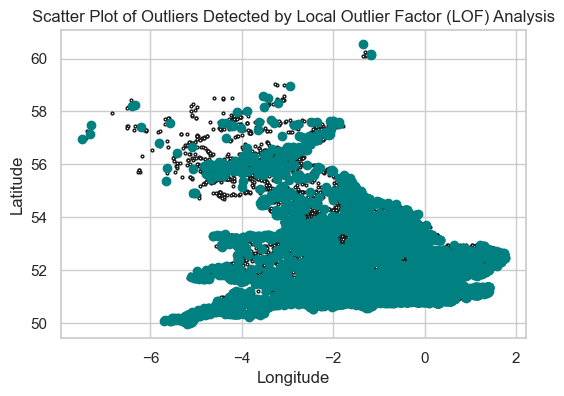

In [349]:
# Create a scatter plot to visualize the results of LocalOutlierFactor (LOF) analysis.
plt.figure(figsize=(6,4))
plt.scatter(valid_table['longitude'],valid_table['latitude'],c='white',s=4,edgecolor='k') #create a scatter plot of the latitude against longitude
# Plot the latitude against longitude for the data points that were identified as outliers
# Label the axes and add a title
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Scatter Plot of Outliers Detected by Local Outlier Factor (LOF) Analysis')
plt.scatter(LOF_anomalies['longitude'],LOF_anomalies['latitude'],c='teal')
# Show the plot
plt.show()

The visualization helps to understand the spatial distribution of actual data and the detected outliers. 

The above scatter plot shows the geographical coordinates (longitude and latitude) of the data point. The white dots with black edges represents the main data points while teal cirlce represents the outliers that were identified by the LOF Algorithms. 

## Detection of Outliers Using Isolation Forest

In [350]:
ranst=np.random.RandomState(0)

model = IsolationForest(max_samples=100,random_state=ranst, contamination=.05) 
model.fit(valid_table)
if_scores = model.decision_function(valid_table)
if_anomalies=model.predict(valid_table)
if_anomalies=pd.Series(if_anomalies, index=valid_table.index).replace([-1,1],[1,0])
# Outlier labels are converted 1 for outliers and 0 for inliers. 
if_anomalies=valid_table [if_anomalies==1];

C:\Program Files\Python311\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


In [351]:
# Dataframe containing outlier points

if_anomalies 

,accident_year,longitude,latitude,police_force,number_of_vehicles,number_of_casualties,day_of_week,local_authority_district,first_road_class,road_type,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,hour
0,2020,-0.254001,51.462262,1,1,1,3,10,6,6,...,9,1,9,9,0,0,1,3,2,9
12,2020,0.221108,51.595036,1,2,2,4,15,3,3,...,9,1,7,1,0,0,1,3,2,4
33,2020,-0.108489,51.591936,1,2,1,4,31,6,2,...,9,4,9,9,9,0,1,3,2,20
34,2020,-0.098327,51.390066,1,2,1,4,20,6,7,...,0,4,1,1,0,0,1,3,2,1
37,2020,0.147310,51.530303,1,1,2,4,16,5,9,...,9,7,7,1,0,0,1,3,2,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91183,2020,-3.944559,55.732713,99,3,4,6,938,3,6,...,4,1,1,1,0,0,1,2,-1,16
91185,2020,-3.343610,56.110929,99,2,2,7,925,3,6,...,5,4,8,2,0,0,1,1,-1,1
91189,2020,-2.946947,56.491558,99,1,1,3,918,6,7,...,0,1,9,2,0,0,1,2,-1,10
91191,2020,-3.634775,56.153290,99,2,1,3,934,3,6,...,4,1,1,1,0,0,2,1,-1,7


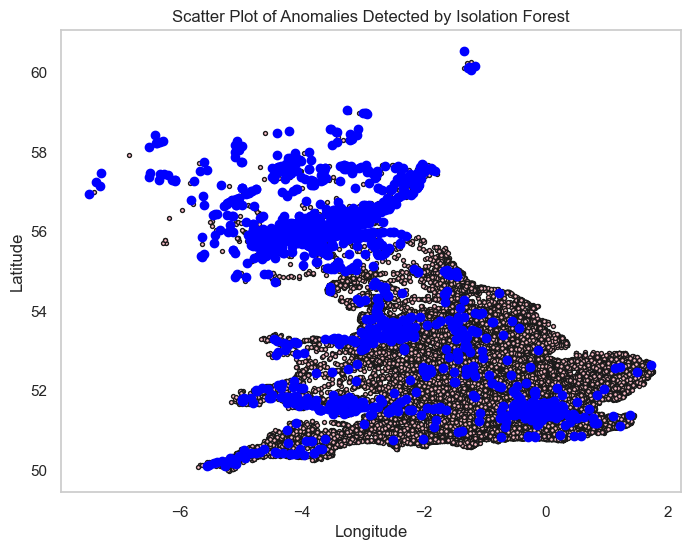

In [352]:
plt.figure(figsize=(8,6))
plt.scatter(valid_table['longitude'],valid_table['latitude'],color='pink',s=8,edgecolor='k')
plt.scatter(if_anomalies['longitude'],if_anomalies['latitude'],color='blue')
# Label the axes and add a title
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Scatter Plot of Anomalies Detected by Isolation Forest')
plt.grid(False)
# Showthe plot
plt.show()

## 7. Can you develop a classification model using the provided data that accurately predicts fatal injuries sustained in road traffic accidents, with the aim of informing and improving road safety measures?

In [353]:
accident_table['accident_severity'].unique()

array(['Fatal', 'Not Fatal', 'Severe'], dtype=object)

In [354]:
# Map accident severity
mapping = {'Fatal': True, 'Not Fatal': False, 'Severe': False}
series_label = accident_table['accident_severity'].map(mapping)

# Create y_labels Series from the new column
y_labels = series_label

In [355]:
y_labels

0         True
1         True
2         True
3        False
4         True
         ...  
91194    False
91195     True
91196    False
91197     True
91198     True
Name: accident_severity, Length: 91199, dtype: bool

In [356]:
dfacc = y_labels.value_counts()

In [357]:
dfacc

True     71453
False    19746
Name: accident_severity, dtype: int64

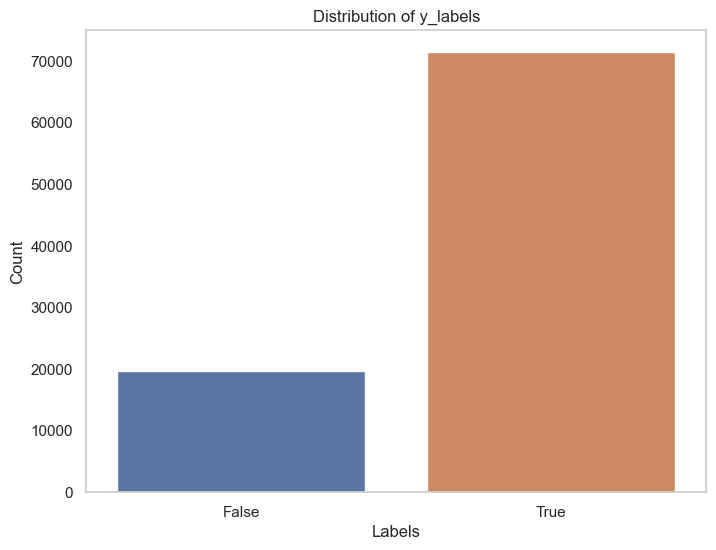

In [358]:
# Countplot using Seaborn
plt.figure(figsize=(8, 6))
sns.countplot(x=y_labels)
plt.xlabel('Labels')
plt.ylabel('Count')
plt.title('Distribution of y_labels')
plt.grid(False)
# Display the plot
plt.show()

In [359]:
!pip install scikit-learn
!pip install imbalanced-learn


Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [360]:
from imblearn.under_sampling import RandomUnderSampler



In [361]:

from imblearn.under_sampling import RandomUnderSampler



In [362]:
from imblearn.under_sampling import RandomUnderSampler

# Create a balanced dataset using the RandomUnderSampler.
rus = RandomUnderSampler()
balanced_data, y_data = rus.fit_resample(accident_table, y_labels)


In [363]:
# Convert ydata series back to a pandas series
y_data = pd.Series(y_data)

In [364]:
# Check that the new dataframe and labels have a balanced number of fatal and non-fatal accidents
y_data.value_counts()

False    19746
True     19746
Name: accident_severity, dtype: int64

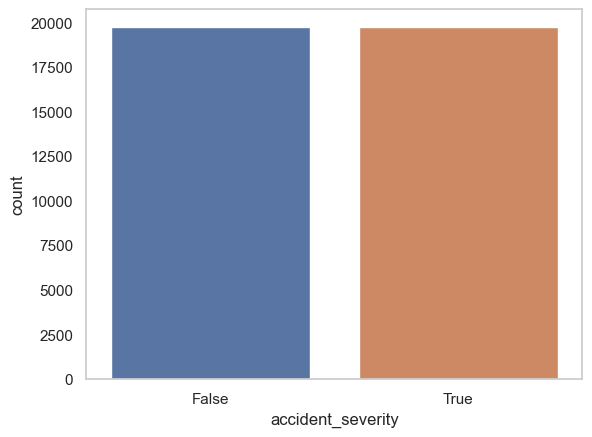

In [365]:
# Visualize y_data using seaborn
sns.countplot(x=y_data)
plt.grid(False)
# Show plot
plt.show()

## Feature Selection Using Filtering

Police officers are more likely to visit or attend an accidentscene most cases it is after an accident must have occur and here we are interested in the causes of fatal accident not an event that happen after the accident. As a result of this we are going to remove did_police_officer_attend_scene_of_accident column.   

In [366]:
# Removing the accident_severity column from the dataframe, as this contains the classifications as to whether the accident was fatal or not, and we want to predict that.
balanced_data.drop(columns = ['accident_severity', 'did_police_officer_attend_scene_of_accident'], inplace = True)

In [367]:
# No more accident severity
balanced_data

,accident_index,accident_year,accident_reference,longitude,latitude,police_force,number_of_vehicles,number_of_casualties,date,day_of_week,...,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,trunk_road_flag,hour,day_names,weather_conditions_category,road_type_category,road_surface_category
3,2020010228006,2020,010228006,-0.001683,51.541210,1,1,1,2020-01-01,4,...,1,0,0,1,2,1,Thursday,Fine without high winds,Single carriageway,Dry
7,2020010228017,2020,010228017,-0.039390,51.523195,1,2,1,2020-01-01,4,...,2,0,0,1,2,3,Thursday,Other,Dual carriageway,Wet/Damp
11,2020010228024,2020,010228024,-0.058620,51.660013,1,3,4,2020-01-01,4,...,2,0,0,1,2,3,Thursday,Fine without high winds,Dual carriageway,Wet/Damp
13,2020010228032,2020,010228032,-0.182588,51.453048,1,3,1,2020-01-01,4,...,2,0,0,1,2,1,Thursday,Fine without high winds,Single carriageway,Wet/Damp
15,2020010228038,2020,010228038,0.207510,51.593297,1,1,1,2020-01-01,4,...,2,0,0,2,2,4,Thursday,Fog or mist,Dual carriageway,Wet/Damp
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54901,2020351013567,2020,351013567,-0.073118,52.403804,35,2,1,2020-12-24,5,...,2,0,0,2,2,10,Friday,Fine with high winds,Single carriageway,Wet/Damp
80600,2020522002301,2020,522002301,-2.551889,51.439707,52,2,1,2020-05-29,6,...,1,0,0,1,2,18,Saturday,Fine without high winds,Single carriageway,Dry
32355,2020122000791,2020,122000791,-0.414406,54.276785,12,2,1,2020-08-25,3,...,2,0,0,1,2,15,Wednesday,Raining without high winds,Single carriageway,Wet/Damp
84033,2020552000894,2020,552000894,-1.899673,50.807638,55,2,2,2020-09-23,4,...,1,0,0,1,2,14,Thursday,Fine without high winds,Single carriageway,Dry


In [368]:
# Select the  numerical features
balanced_data = balanced_data.select_dtypes([np.number])
# Only keep columns that are numbers in the data frame.

In [369]:
# feauture selection for clasification
k_bestor = SelectKBest(f_classif, k=12) # Select the 12 best features to use for classification.
k_bestor.fit(balanced_data, y_data) 

C:\Program Files\Python311\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: UserWarning: Features [0] are constant.
  warnings.warn("Features %s are constant." % constant_features_idx, UserWarning)
C:\Program Files\Python311\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:113: RuntimeWarning: invalid value encountered in divide
  f = msb / msw


SelectKBest(k=12)

In [370]:
SelectKBest(k=12)

SelectKBest(k=12)

In [371]:
k_sad = k_bestor.get_support()
classifiers = k_bestor.feature_names_in_[k_sad]
classifiers

array(['latitude', 'police_force', 'number_of_vehicles',
       'local_authority_district', 'speed_limit', 'junction_detail',
       'junction_control', 'second_road_class',
       'pedestrian_crossing_human_control',
       'pedestrian_crossing_physical_facilities', 'urban_or_rural_area',
       'trunk_road_flag'], dtype=object)

In [372]:
selection_grades= k_bestor.scores_[k_sad]
selection_grades

array([417.72249791, 626.87887439, 355.59633079, 629.99886734,
       665.37741933, 263.51029474, 304.63377113, 211.76663357,
       390.65296786, 222.68495411, 670.24669498, 330.37960174])

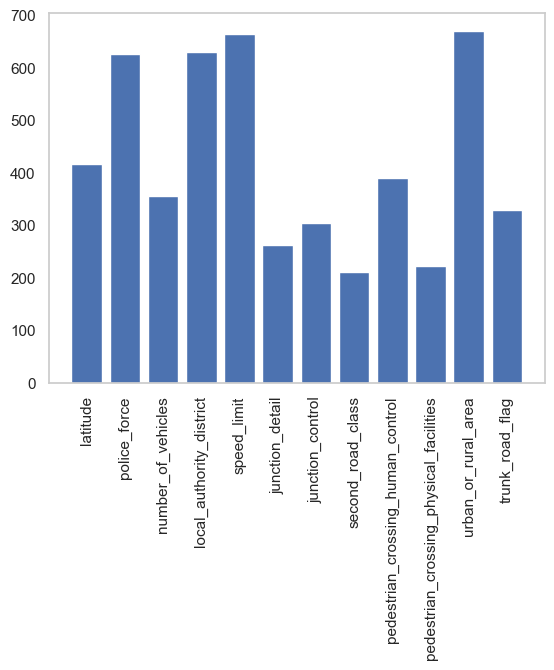

In [373]:
# Plot a bar chart of the features and the scores.
plt.bar(classifiers, selection_grades)
plt.xticks(rotation = 'vertical')
plt.grid(False)
# Display the plot
plt.show()

 What features have the best scores? These are expected to be the ones most useful in classifying the accidents as fatal or not. Do they make sense? Are any of them
 surprising? Do the features selected tell you anything about what is important for road safety?

## Logistic regression

In [374]:
y_target = y_data # assigning the target variable y_data to y_target
Xfeatures = balanced_data

In [375]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(Xfeatures, y_target, test_size=0.2, random_state=42)

In [376]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [377]:
logreg_model = LogisticRegression()

In [378]:
# Train the model on the training data
logreg_model.fit(X_train_scaled, y_train)

LogisticRegression()

In [379]:
# Make predictions on the scaled testing data
y_pred = logreg_model.predict(X_test_scaled)

# Calculate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")

Accuracy: 0.60


## Decision Tree

In [380]:
y_target = y_data # assigning the target variable y_data to y_target
Xfeatures = balanced_data

In [381]:
# Split the balanced data into test and training samples using train_test_split 
X_train, X_test, y_train, y_test = train_test_split(Xfeatures, y_target, test_size = 0.2, random_state = 42)

In [382]:
tree = DecisionTreeClassifier(min_samples_leaf = 100)

In [383]:
# Train the decision tree classifier on the training data.
tree.fit(X_train, y_train)

DecisionTreeClassifier(min_samples_leaf=100)

In [384]:
# Make predictions using the trained model on the test data.
y_pred = tree.predict(X_test)

In [385]:
# Calculate the accuracy of the model on the training data.
accident_tree = round(tree.score(X_train, y_train) * 100, 2)

In [386]:
# Evaluate the classifier using cross evaluation
tree_class = cross_validate(tree, X_train, y_train, cv=10, scoring = 'accuracy', return_estimator = True)
# Return the dictionary
tree_class

{'fit_time': array([0.14899755, 0.14799547, 0.1470058 , 0.14099574, 0.13700271,
        0.14199519, 0.14100742, 0.14999938, 0.1449964 , 0.14499998]),
 'score_time': array([0.00200391, 0.002002  , 0.00299954, 0.00200176, 0.00200343,
        0.00100064, 0.00200009, 0.00200129, 0.00200105, 0.00200367]),
 'estimator': [DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100),
  DecisionTreeClassifier(min_samples_leaf=100)],
 'test_score': array([0.61265823, 0.59905063, 0.59841772, 0.59924027, 0.6119025 ,
        0.5824628 , 0.61221906, 0.58816081, 0.59227604, 0.6011396 ])}

In [387]:
# Print the accuracy scores of each fold during cross-validation.
print(tree_class['test_score'])

[0.61265823 0.59905063 0.59841772 0.59924027 0.6119025  0.5824628
 0.61221906 0.58816081 0.59227604 0.6011396 ]


In [388]:
# Evaluate the performance of the model
test_accuracy = tree_class['test_score'].mean() # Calculate the mean accuracy across all folds.
print(f"Mean Accuracy: {test_accuracy:.2f}")

Mean Accuracy: 0.60


## EVALUATE THE CLASSIFIER USING CONFUSION MATRIX

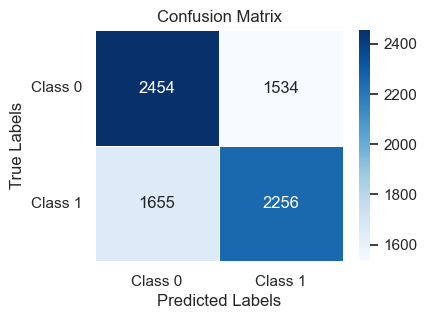

In [389]:
# y_test: Actual labels
# y_pred: Predicted labels from the model

# Create the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Set up the figure size
plt.figure(figsize=(4, 3))

# Create a heatmap with improved formatting
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=True, linewidths=.5)

# Add labels and title
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')

# Add tick labels for the axes
plt.xticks(ticks=[0.5, 1.5], labels=['Class 0', 'Class 1'])
plt.yticks(ticks=[0.5, 1.5], labels=['Class 0', 'Class 1'], rotation=0)

# Show the plot
plt.show()



In [390]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.60      0.62      0.61      3988
        True       0.60      0.58      0.59      3911

    accuracy                           0.60      7899
   macro avg       0.60      0.60      0.60      7899
weighted avg       0.60      0.60      0.60      7899



## EXAMINNATION OF THE IMPORTANT FEATURES

In [391]:
feature_importance = pd.DataFrame(np.array([tree.feature_names_in_, 
                                       tree.feature_importances_]
                                     ).T,
                             columns=["Feature", "Importance"])


feature_importance

,Feature,Importance
0,accident_year,0.0
1,longitude,0.071423
2,latitude,0.145116
3,police_force,0.013104
4,number_of_vehicles,0.207061
5,number_of_casualties,0.056367
6,day_of_week,0.014477
7,local_authority_district,0.127214
8,first_road_class,0.018226
9,road_type,0.032029


In [392]:
feature_importance.sort_values("Importance", ascending=False)

,Feature,Importance
4,number_of_vehicles,0.207061
2,latitude,0.145116
7,local_authority_district,0.127214
21,urban_or_rural_area,0.121516
1,longitude,0.071423
5,number_of_casualties,0.056367
23,hour,0.049123
10,speed_limit,0.039135
9,road_type,0.032029
14,pedestrian_crossing_human_control,0.026136


## REGULARISATION IN ORDER TO UNDERSTAND THE TREE

In [393]:
tree_REGULARIZATION = DecisionTreeClassifier(max_depth=3)
tree_REGULARIZATION

DecisionTreeClassifier(max_depth=3)

In [394]:
tree_REGULARIZATION.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=3)

##   Tree Visualization

In [395]:
!pip install graphviz

Defaulting to user installation because normal site-packages is not writeable


In [396]:
from sklearn.tree import export_graphviz
import graphviz

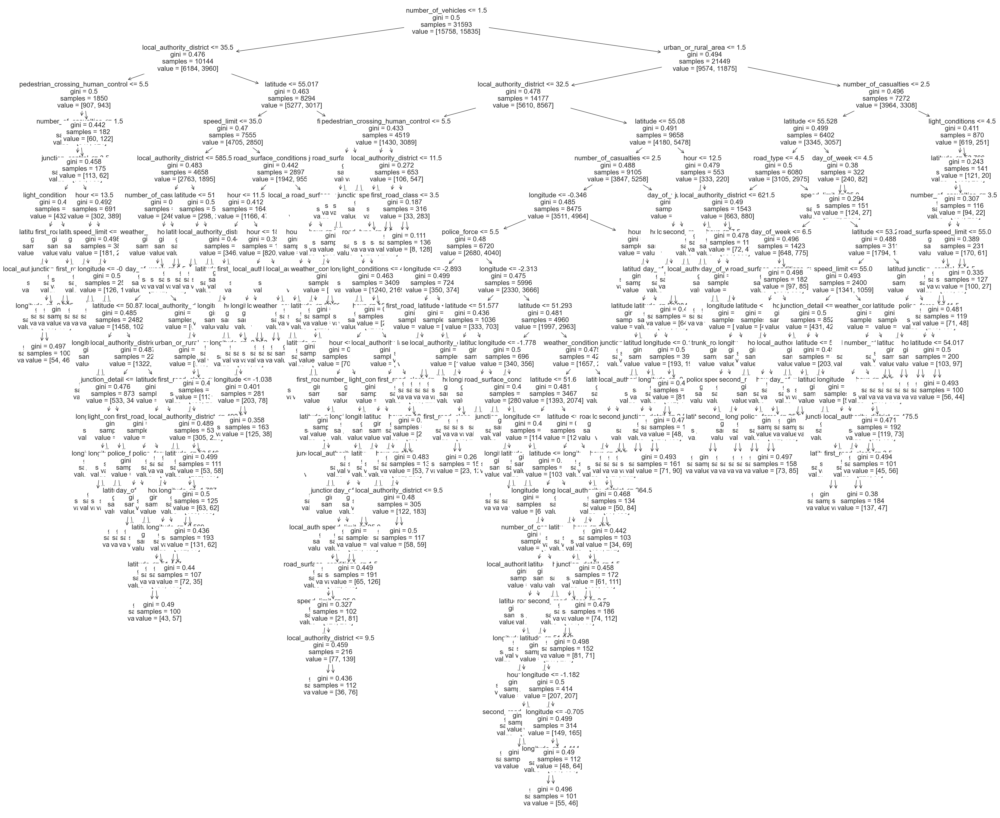

In [397]:
plt.figure(figsize=(40, 35))
plot_tree(tree, feature_names=X_train.columns.tolist(), fontsize=16)
#show the plot
plt.show()

## Determine max_depth

In [398]:

max_depth_range = list(range(1, 20))
accuracy = []

In [399]:
for depth in max_depth_range:
    
    decision_tree = DecisionTreeClassifier(max_depth = depth, random_state = 42)
    decision_tree.fit(X_train, y_train)
    score = decision_tree.score(X_test, y_test)
    accuracy.append(score)

In [400]:
accuracy

[0.5651348271933156,
 0.5922268641600202,
 0.5972907963033295,
 0.6010887454108115,
 0.6058994809469553,
 0.6045068996075452,
 0.6021015318394733,
 0.6009621471072287,
 0.6023547284466388,
 0.5981769844284086,
 0.594252437017344,
 0.5856437523737182,
 0.5818458032662363,
 0.5751360931763514,
 0.5705785542473731,
 0.5719711355867831,
 0.5660210153183948,
 0.5594379035320927,
 0.5585517154070135]

## Hyperparameter Tuning Using Grid Search

In [401]:
# Define the parameter grid
param_grid = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

In [402]:
# Create a Decision Tree model
decision_tree = DecisionTreeClassifier()


In [403]:
# Create the GridSearchCV 
grid_search = GridSearchCV(decision_tree, param_grid, cv=5, scoring='accuracy')

In [404]:
# Fit the grid search
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]},
             scoring='accuracy')

In [405]:
GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]},
             scoring='accuracy')

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]},
             scoring='accuracy')

In [406]:
# Derive the best hyperparameters
hyperparameter = grid_search.best_params_
print("Best Hyperparameters:", hyperparameter)

Best Hyperparameters: {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10}


In [407]:
new_model = grid_search.best_estimator_

In [408]:
# Evaluate the model
new_accuracy = new_model.score(X_test, y_test)
print("Accuracy of New Model:", new_accuracy)

Accuracy of New Model: 0.5988099759463223


## Training the model with the new Hyperparameters

In [409]:
new_model = DecisionTreeClassifier(max_depth = 10, min_samples_leaf = 1, min_samples_split = 5, random_state = 42)
new_model.fit(X_train, y_train)

DecisionTreeClassifier(max_depth=10, min_samples_split=5, random_state=42)

### Prediction

In [410]:
new_pred = new_model.predict(X_test)

In [411]:
accuracy_scores = accuracy_score(y_test, new_pred)
print("The Accuracy of the New Model is:", accuracy_scores)

The Accuracy of the New Model is: 0.5991897708570705


## Random Forest

In [412]:
accident_forestification = RandomForestClassifier(n_estimators=100)
accident_forestification

RandomForestClassifier()

In [413]:
accident_forestification.fit(X_train, y_train)

RandomForestClassifier()

In [414]:
y_output = accident_forestification.predict(X_test)

In [415]:
RandomFor_accuracy = metrics.accuracy_score(y_output, y_test)
print("The accuracy of the random forest model is:", RandomFor_accuracy)

The accuracy of the random forest model is: 0.6003291555893151


## FEATURE IMPORTANCE

In [416]:
feature_importance = pd.Series(accident_forestification.feature_importances_,index=accident_forestification.feature_names_in_)

In [417]:
feature_importance

accident_year                              0.000000
longitude                                  0.142643
latitude                                   0.146349
police_force                               0.054382
number_of_vehicles                         0.036892
number_of_casualties                       0.025415
day_of_week                                0.072302
local_authority_district                   0.108148
first_road_class                           0.037062
road_type                                  0.023686
speed_limit                                0.033607
junction_detail                            0.034581
junction_control                           0.017373
second_road_class                          0.023598
pedestrian_crossing_human_control          0.006711
pedestrian_crossing_physical_facilities    0.026580
light_conditions                           0.024314
weather_conditions                         0.027439
road_surface_conditions                    0.023040
special_cond

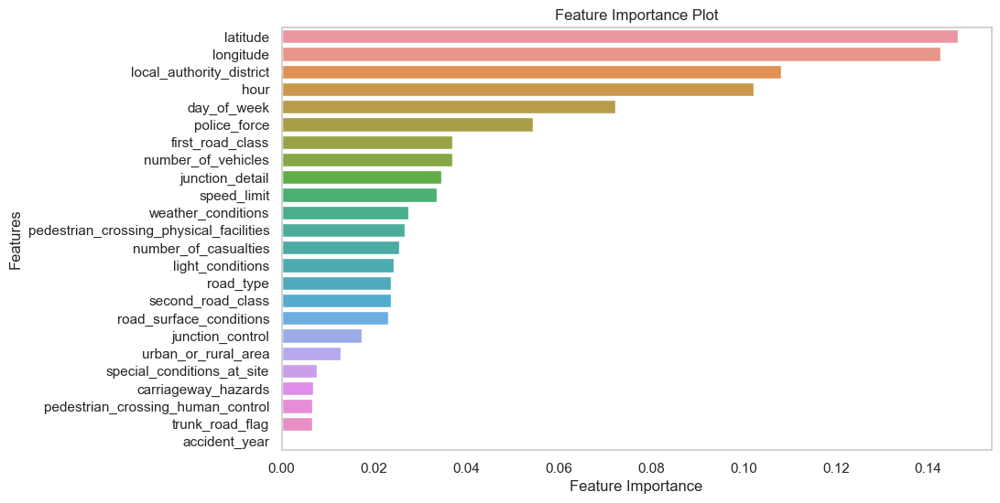

In [418]:
plt.figure(figsize=(10,6))

# Sorting feature importance in descending order
feature_importance_sorted = feature_importance.sort_values(ascending=False)

# Creating a bar plot using seaborn
sns.barplot(x=feature_importance_sorted, y=feature_importance_sorted.index)

# Turning off grid
plt.grid(False)

# Labeling the axes and adding a title
plt.xlabel('Feature Importance')
plt.ylabel('Features')
plt.title('Feature Importance Plot')

# Show the plot
plt.show()

In [419]:
X_train.corr()

,accident_year,longitude,latitude,police_force,number_of_vehicles,number_of_casualties,day_of_week,local_authority_district,first_road_class,road_type,...,pedestrian_crossing_human_control,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,trunk_road_flag,hour
accident_year,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
longitude,NaN,1.000000,-0.431154,-0.371094,0.038287,-0.034705,0.000705,-0.389592,-0.027561,-0.026218,...,0.135051,0.120151,0.001747,0.009200,0.000634,0.072193,0.067310,-0.109529,0.517779,-0.007555
latitude,NaN,-0.431154,1.000000,0.169571,-0.041774,0.034039,0.006608,0.118953,0.032910,0.022125,...,-0.108625,-0.076304,-0.006799,0.006324,-0.008987,-0.061332,-0.055749,0.051246,-0.454803,0.010585
police_force,NaN,-0.371094,0.169571,1.000000,-0.021973,0.050298,-0.001938,0.958589,0.031540,0.026534,...,-0.187368,-0.187299,0.002794,-0.018640,-0.017777,-0.092929,-0.082623,0.274334,-0.665429,-0.022414
number_of_vehicles,NaN,0.038287,-0.041774,-0.021973,1.000000,0.211870,-0.000200,-0.018380,-0.099761,-0.048468,...,-0.001894,-0.038655,-0.077635,-0.035074,-0.041396,-0.021285,-0.028588,0.002455,0.018024,0.008909
number_of_casualties,NaN,-0.034705,0.034039,0.050298,0.211870,1.000000,0.001281,0.055324,-0.086079,-0.007388,...,-0.046795,-0.066019,0.038324,-0.006169,0.010104,-0.020959,-0.024972,0.137861,-0.040818,0.013758
day_of_week,NaN,0.000705,0.006608,-0.001938,-0.000200,0.001281,1.000000,-0.002413,0.001273,0.010744,...,-0.003638,0.004956,0.030953,0.002954,0.006106,-0.007178,-0.003273,-0.020608,-0.000473,0.036825
local_authority_district,NaN,-0.389592,0.118953,0.958589,-0.018380,0.055324,-0.002413,1.000000,0.043379,0.026858,...,-0.205709,-0.203642,-0.000172,-0.025745,-0.026317,-0.100944,-0.091067,0.285016,-0.596526,-0.023479
first_road_class,NaN,-0.027561,0.032910,0.031540,-0.099761,-0.086079,0.001273,0.043379,1.000000,0.283965,...,-0.042126,-0.121383,-0.040896,0.002333,-0.028123,-0.032969,-0.022976,-0.160973,0.113509,0.027795
road_type,NaN,-0.026218,0.022125,0.026534,-0.048468,-0.007388,0.010744,0.026858,0.283965,1.000000,...,0.094761,-0.018675,-0.012449,0.050102,0.061833,0.051632,0.076896,-0.022396,0.054458,0.020058


<Axes: >

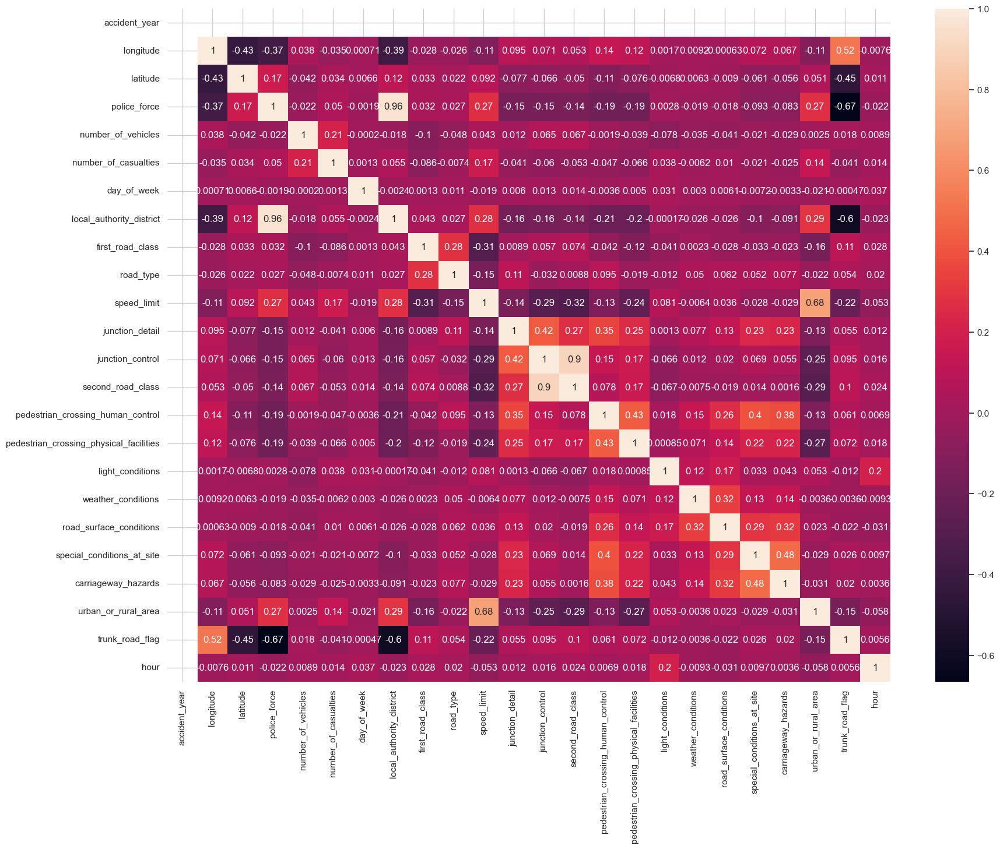

In [420]:
plt.figure(figsize=(20,15))
sns.heatmap(X_train.corr(), annot=True)

In [421]:
# Random Forest Classifier
forest_classifier = RandomForestClassifier()

In [422]:
# Define the hyperparameter
hyperparameter_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

### Hyperparameter tuning

In [423]:
# build a new model with the best hyperparameters
new_parameters = RandomForestClassifier(max_depth=10,
                                                min_samples_split=5,
                                                min_samples_leaf=1)

In [424]:
# Fit the model to the training data
new_parameters.fit(X_train, y_train)


RandomForestClassifier(max_depth=10, min_samples_split=5)

In [425]:
# Predictions
y_predictions =new_parameters.predict(X_test)

In [426]:
# Evaluate the accuracy of the new model
randnew_accuracy = accuracy_score(y_test, y_predictions)
print("The Accuracy is:", randnew_accuracy)

The Accuracy is: 0.616913533358653


In [427]:
# Calculate F1 score
f1 = f1_score(y_test, y_predictions)

# Calculate precision score
precision = precision_score(y_test, y_predictions)

print("F1 Score:", f1)
print("Precision Score:", precision)

F1 Score: 0.6277982779827799
Precision Score: 0.6048826736193411


F1 Score: 0.6277982779827799
Precision Score: 0.6048826736193411
Classification Report:
              precision    recall  f1-score   support

       False       0.63      0.58      0.61      3988
        True       0.60      0.65      0.63      3911

    accuracy                           0.62      7899
   macro avg       0.62      0.62      0.62      7899
weighted avg       0.62      0.62      0.62      7899



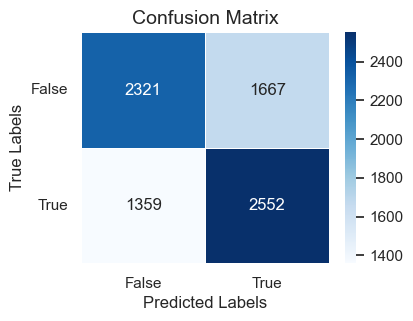

In [436]:
# y_test: Actual labels
# y_predictions: Predicted labels from the model

# Calculate F1 score
f1 = f1_score(y_test, y_predictions)
print("F1 Score:", f1)

# Calculate precision score
precision = precision_score(y_test, y_predictions)
print("Precision Score:", precision)

# Print the classification report
print("Classification Report:")
print(classification_report(y_test, y_predictions))

# Create the confusion matrix
cm = confusion_matrix(y_test, y_predictions)

# Set up the figure size
plt.figure(figsize=(4, 3))

# Create a heatmap with improved formatting
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=True, linewidths=.5)

# Add labels and title
plt.xlabel('Predicted Labels', fontsize=12)
plt.ylabel('True Labels', fontsize=12)
plt.title('Confusion Matrix', fontsize=14)

# Add tick labels for the axes
plt.xticks(ticks=[0.5, 1.5], labels=['False', 'True'])
plt.yticks(ticks=[0.5, 1.5], labels=['False', 'True'], rotation=0)

# Show the plot
plt.show()


## XGBOOST

In [428]:
!pip install xgboost


Defaulting to user installation because normal site-packages is not writeable


In [429]:
from xgboost import XGBClassifier

import xgboost as xgb 

X_train, X_test, y_train, y_test = train_test_split(Xfeatures, y_target, test_size=0.2, random_state=42)

In [430]:
# Create an XGBoost classifier
xgb_classifier = xgb.XGBClassifier(objective='binary:logistic', random_state=42)

In [431]:
from xgboost import XGBClassifier



# Create an instance of the XGBoost classifier
xgb_classifier = XGBClassifier()

# Train the model
xgb_classifier.fit(X_train, y_train)


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=None, ...)

In [432]:
y_pred = xgb_classifier.predict(X_test)

In [433]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.60843144701861


In [437]:

# y_test: Actual labels
# y_predictions: Predicted labels from the model

# Calculate F1 score
f1 = f1_score(y_test, y_predictions)
print("F1 Score:", f1)

# Calculate precision score
precision = precision_score(y_test, y_predictions)
print("Precision Score:", precision)



F1 Score: 0.6277982779827799
Precision Score: 0.6048826736193411
